We tested the cointegration of the data in 2 different periods and found the different best pair. (whole from 2020-2023 VS every year) 

We also used 2 different strategy of stop-loss.(return dropped continously in 4 hours VS bollinger band)  

So,we acquired 4 versions here to explore the better strategy. 

## 1)whole cointegration with drop 4-hours stop-loss 'BNBUSDT & EOSUSDT'

## 2)whole cointegration with bollinger band  stop-loss 'BNBUSDT & EOSUSDT'

## 3)2-year cointegration with drop 4-hours stop-loss 'XRPUSDT & BCHUSDT'

## 4)2-year cointegration with bollinger band  stop-loss 'XRPUSDT & BCHUSDT'

## Data preparing

In [1]:
import quandl
import pandas as pd
import numpy as np
import scipy.stats as st
from matplotlib import pyplot as plt
import matplotlib.dates as mdates
import requests
import statsmodels.tsa.stattools as ts 
from statsmodels.tsa.vector_ar.vecm import coint_johansen
import warnings
warnings.filterwarnings("ignore")

In [2]:
# from binance.client import Client
# import pandas as pd

# api_key = 'f929176ab23267fc0d070a50feb52fc38c4e5f633e5d271617e8ffa3f1dd391c'
# api_secret = '69f5a56cb218c8ac11b940b19bb3d6fdb4e468afc37a772d34e53bd8f698bb48'
# client = Client(api_key, api_secret)

# def extract_sp(assets, *args):
#     def data(ticker):
#         klines = client.get_historical_klines(ticker, Client.KLINE_INTERVAL_1HOUR, *args)
#         df = pd.DataFrame(klines,  columns=['timestamp', 'open', 'high', 'low', 'close', 
#                                             'volume', 'close_time', 'quote_asset_volume', 
#                                             'number_of_trades', 'taker_buy_base_asset_volume', 
#                                             'taker_buy_quote_asset_volume', 'ignore']
#                          )
#         df['close'] = df['close'].astype(float)
#         df['timestamp'] = pd.to_datetime(df['timestamp'], unit='ms')
#         df['close_time'] = pd.to_datetime(df['close_time'], unit='ms')
#         return df.set_index('timestamp')
    
#     crypto_currencies = [data(ticker) for ticker in assets]
    
#     return pd.concat(crypto_currencies,
#                      keys=assets,
#                      names=["Assets","Date"])


# assets = ['BTCUSDT', 'ETHUSDT', 'SOLUSDT', 'ADAUSDT', 'BNBUSDT', 
#           'LTCUSDT', 'NOTUSDT','XLMUSDT','BCHUSDT',
#           'LINKUSDT','XRPUSDT','YGGUSDT','EOSUSDT']
# crypto = extract_sp(assets, "2020-01-01", "2024-05-31")
# crypto

In [3]:
crypto = pd.read_csv("crypto_hourly.csv")

In [4]:
crypto_prices =\
(
    crypto
    .reset_index()
    .pivot(index = "Date",
           columns = "Assets",
           values = "close")
)

crypto_prices.index = pd.to_datetime(crypto_prices.index)
crypto_prices

Assets,ADAUSDT,BCHUSDT,BNBUSDT,BTCUSDT,EOSUSDT,ETHUSDT,LINKUSDT,LTCUSDT,NOTUSDT,SOLUSDT,XLMUSDT,XRPUSDT,YGGUSDT
Date,,,,,,,,,,,,,
2020-01-01 00:00:00,0.03278,204.43,13.6981,7177.02,2.5882,128.87,1.7638,41.28,NaN,NaN,0.04488,0.19248,NaN
2020-01-01 01:00:00,0.03299,206.19,13.7995,7216.27,2.6161,130.64,1.7831,41.62,NaN,NaN,0.04517,0.19371,NaN
2020-01-01 02:00:00,0.03317,207.38,13.8478,7242.85,2.6223,130.85,1.8004,41.85,NaN,NaN,0.04523,0.19418,NaN
2020-01-01 03:00:00,0.03303,205.71,13.8170,7225.01,2.6085,130.20,1.7932,41.53,NaN,NaN,0.04517,0.19397,NaN
2020-01-01 04:00:00,0.03299,206.20,13.7922,7217.27,2.6165,130.20,1.7968,41.59,NaN,NaN,0.04511,0.19363,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-30 20:00:00,0.44740,467.30,594.0000,68475.99,0.8130,3737.69,17.9090,84.01,0.012812,167.27,0.10670,0.51880,0.9983
2024-05-30 21:00:00,0.44800,467.70,595.3000,68416.76,0.8112,3751.36,17.8310,84.55,0.012678,166.84,0.10700,0.52020,0.9983
2024-05-30 22:00:00,0.44790,466.50,595.0000,68314.93,0.8118,3747.44,17.9020,84.42,0.012723,167.20,0.10690,0.51970,0.9852


In [5]:
missing_values_per_column = crypto_prices.isna().sum()

missing_values_per_column

Assets
ADAUSDT         0
BCHUSDT         0
BNBUSDT         0
BTCUSDT         0
EOSUSDT         0
ETHUSDT         0
LINKUSDT        0
LTCUSDT         0
NOTUSDT     38308
SOLUSDT      5346
XLMUSDT         0
XRPUSDT         0
YGGUSDT     15145
dtype: int64

In [6]:
missing_values_per_column = crypto_prices.isna().sum()

columns_without_missing_values = missing_values_per_column[missing_values_per_column == 0].index

crypto_prices_cleaned = crypto_prices[columns_without_missing_values]

crypto_prices_cleaned

Assets,ADAUSDT,BCHUSDT,BNBUSDT,BTCUSDT,EOSUSDT,ETHUSDT,LINKUSDT,LTCUSDT,XLMUSDT,XRPUSDT
Date,,,,,,,,,,
2020-01-01 00:00:00,0.03278,204.43,13.6981,7177.02,2.5882,128.87,1.7638,41.28,0.04488,0.19248
2020-01-01 01:00:00,0.03299,206.19,13.7995,7216.27,2.6161,130.64,1.7831,41.62,0.04517,0.19371
2020-01-01 02:00:00,0.03317,207.38,13.8478,7242.85,2.6223,130.85,1.8004,41.85,0.04523,0.19418
2020-01-01 03:00:00,0.03303,205.71,13.8170,7225.01,2.6085,130.20,1.7932,41.53,0.04517,0.19397
2020-01-01 04:00:00,0.03299,206.20,13.7922,7217.27,2.6165,130.20,1.7968,41.59,0.04511,0.19363
...,...,...,...,...,...,...,...,...,...,...
2024-05-30 20:00:00,0.44740,467.30,594.0000,68475.99,0.8130,3737.69,17.9090,84.01,0.10670,0.51880
2024-05-30 21:00:00,0.44800,467.70,595.3000,68416.76,0.8112,3751.36,17.8310,84.55,0.10700,0.52020
2024-05-30 22:00:00,0.44790,466.50,595.0000,68314.93,0.8118,3747.44,17.9020,84.42,0.10690,0.51970


In [7]:
norm_prices = crypto_prices_cleaned.divide(crypto_prices_cleaned.iloc[-1])
norm_prices

Assets,ADAUSDT,BCHUSDT,BNBUSDT,BTCUSDT,EOSUSDT,ETHUSDT,LINKUSDT,LTCUSDT,XLMUSDT,XRPUSDT
Date,,,,,,,,,,
2020-01-01 00:00:00,0.073465,0.440013,0.023003,0.104835,3.214756,0.034340,0.098498,0.489215,0.420619,0.370296
2020-01-01 01:00:00,0.073935,0.443801,0.023173,0.105409,3.249410,0.034812,0.099576,0.493245,0.423336,0.372663
2020-01-01 02:00:00,0.074339,0.446362,0.023254,0.105797,3.257111,0.034868,0.100542,0.495971,0.423899,0.373567
2020-01-01 03:00:00,0.074025,0.442768,0.023202,0.105536,3.239970,0.034695,0.100140,0.492178,0.423336,0.373163
2020-01-01 04:00:00,0.073935,0.443823,0.023161,0.105423,3.249907,0.034695,0.100341,0.492889,0.422774,0.372509
...,...,...,...,...,...,...,...,...,...,...
2024-05-30 20:00:00,1.002689,1.005811,0.997481,1.000234,1.009812,0.995990,1.000112,0.995615,1.000000,0.998076
2024-05-30 21:00:00,1.004034,1.006672,0.999664,0.999368,1.007577,0.999632,0.995756,1.002015,1.002812,1.000770
2024-05-30 22:00:00,1.003810,1.004090,0.999160,0.997881,1.008322,0.998588,0.999721,1.000474,1.001874,0.999808


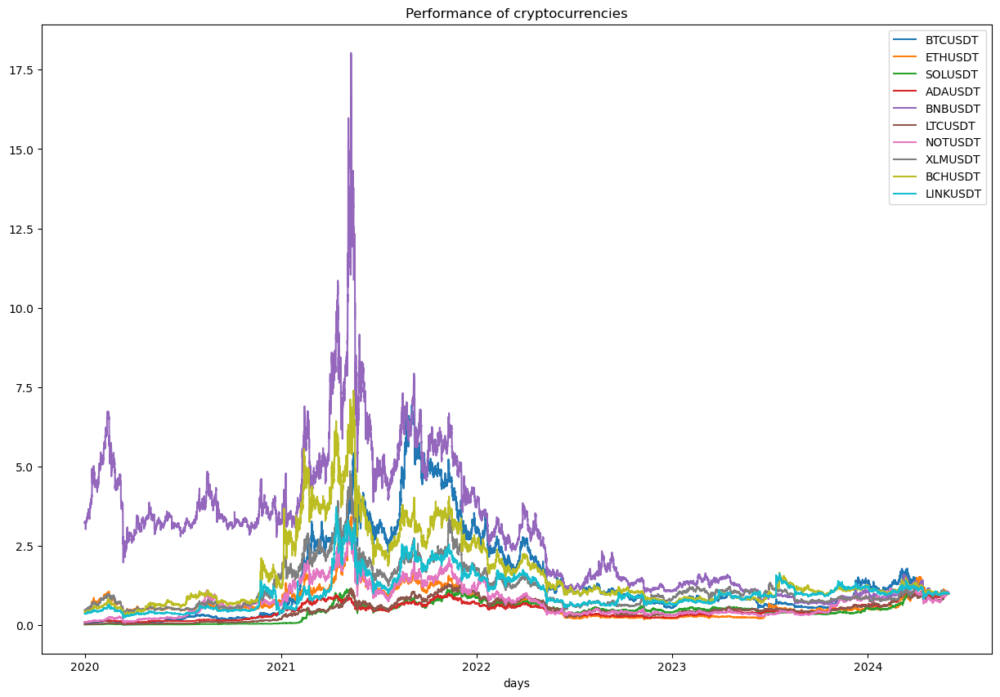

In [8]:
assets = ['BTCUSDT', 'ETHUSDT', 'SOLUSDT', 'ADAUSDT', 'BNBUSDT', 
          'LTCUSDT', 'NOTUSDT','XLMUSDT','BCHUSDT',
          'LINKUSDT','XRPUSDT','YGGUSDT','EOSUSDT']
plt.figure(figsize = (15, 10))
plt.plot(norm_prices)

plt.xlabel('days')
plt.title('Performance of cryptocurrencies')
plt.legend(assets)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.show()

### 1) whole check: Choose the minium p-value pairs BNBUSDT & EOSUSDT

In [9]:
import statsmodels.api as sm;
import statsmodels.tsa.stattools as ts

crypto_prices_train=crypto_prices_cleaned.loc['2020-01-01':'2023-12-31']
crypto_prices_test=crypto_prices_cleaned.loc['2024-01-01':'2024-05-30']

In [10]:
p_value = {}
for a1 in crypto_prices_train.columns:
    for a2 in crypto_prices_train.columns:
        if a1 != a2:
            test_result = ts.coint(crypto_prices_train[a1], 
                                   crypto_prices_train[a2]
                                  )
            p_value[a1 + ' and ' + a2] = test_result[1]
            # print(a1 + ' and ' + a2 + ': p-value = ' + str(test_result[1]))
p_value_df = p_value_df = pd.DataFrame(list(p_value.items()), columns=['Pair', 'P-Value'])
p_value_df_sorted = p_value_df.sort_values(by = "P-Value")
p_value_df_sorted

,Pair,P-Value
61,LINKUSDT and XLMUSDT,0.000097
78,XLMUSDT and LINKUSDT,0.000108
70,LTCUSDT and XLMUSDT,0.000120
79,XLMUSDT and LTCUSDT,0.000181
86,XRPUSDT and ETHUSDT,0.004908
...,...,...
52,ETHUSDT and XLMUSDT,0.725976
49,ETHUSDT and EOSUSDT,0.735026
51,ETHUSDT and LTCUSDT,0.750594
50,ETHUSDT and LINKUSDT,0.752746


In [11]:
filtered_p_value_df = p_value_df_sorted[p_value_df_sorted['P-Value'] < 0.05]
filtered_p_value_df

,Pair,P-Value
61,LINKUSDT and XLMUSDT,0.000097
78,XLMUSDT and LINKUSDT,0.000108
70,LTCUSDT and XLMUSDT,0.000120
79,XLMUSDT and LTCUSDT,0.000181
86,XRPUSDT and ETHUSDT,0.004908
81,XRPUSDT and ADAUSDT,0.007919
16,BCHUSDT and XLMUSDT,0.008739
84,XRPUSDT and BTCUSDT,0.009692
73,XLMUSDT and BCHUSDT,0.011978
69,LTCUSDT and LINKUSDT,0.014848


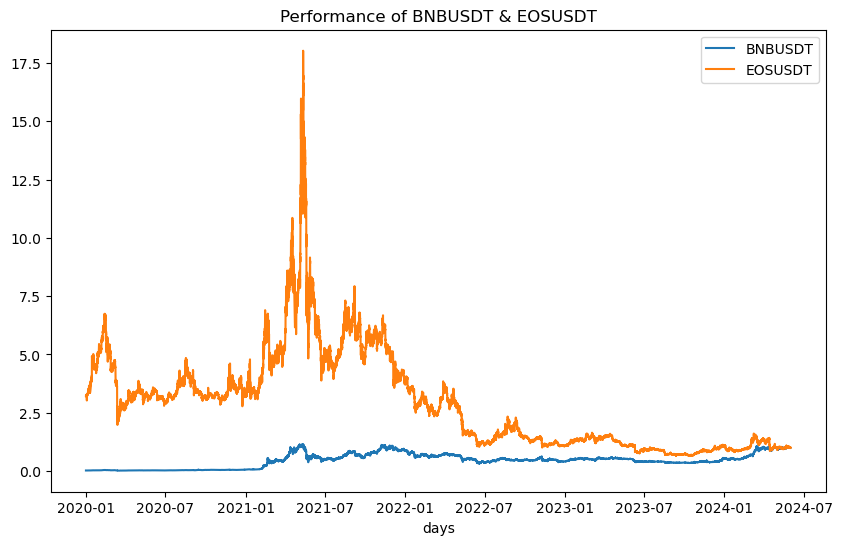

In [12]:
pairs_1 = crypto_prices_cleaned[['BNBUSDT','EOSUSDT']]

plt.figure(figsize = (10, 6))
plt.plot(norm_prices[['BNBUSDT','EOSUSDT']])
plt.xlabel('days')
plt.title('Performance of BNBUSDT & EOSUSDT')
plt.legend(pairs_1.columns)
plt.show()

In [13]:
result_pair1_2023 = sm.OLS(crypto_prices_cleaned.loc['2020':'2023','BNBUSDT'],
                      sm.add_constant(crypto_prices_cleaned.loc['2020':'2023','EOSUSDT'])
                     ).fit()
result_pair1_2023.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                BNBUSDT   R-squared:                       0.059
Model:                            OLS   Adj. R-squared:                  0.059
Method:                 Least Squares   F-statistic:                     2199.
Date:                Mon, 17 Jun 2024   Prob (F-statistic):               0.00
Time:                        17:29:08   Log-Likelihood:            -2.2771e+05
No. Observations:               35032   AIC:                         4.554e+05
Df Residuals:                   35030   BIC:                         4.554e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        188.5917      1.522    123.921      0.000     185.609     191.575
EOSUSDT       23.5558      0.502     46.891      0.000      22.571      24.540
==============================================================================
Omnibus:                     6286.001   Durbin-Watson:                   0.000
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1939.490
Skew:                          -0.339   Prob(JB):                         0.00
Kurtosis:                       2.068   Cond. No.                         5.77
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [14]:
result_pair1_24 = sm.OLS(crypto_prices_cleaned.loc['2024']['BNBUSDT'],
                      sm.add_constant(crypto_prices_cleaned.loc['2024']['EOSUSDT'])
                     ).fit()
result_pair1_24.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                BNBUSDT   R-squared:                       0.266
Model:                            OLS   Adj. R-squared:                  0.266
Method:                 Least Squares   F-statistic:                     1312.
Date:                Mon, 17 Jun 2024   Prob (F-statistic):          1.59e-245
Time:                        17:29:08   Log-Likelihood:                -22103.
No. Observations:                3625   AIC:                         4.421e+04
Df Residuals:                    3623   BIC:                         4.422e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         80.4750     10.908      7.378      0.000      59.089     101.861
EOSUSDT      455.2738     12.567     36.228      0.000     430.635     479.913
==============================================================================
Omnibus:                    21196.742   Durbin-Watson:                   0.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              371.573
Skew:                           0.175   Prob(JB):                     2.06e-81
Kurtosis:                       1.471   Cond. No.                         12.2
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [15]:
pairs_1

Assets,BNBUSDT,EOSUSDT
Date,,
2020-01-01 00:00:00,13.6981,2.5882
2020-01-01 01:00:00,13.7995,2.6161
2020-01-01 02:00:00,13.8478,2.6223
2020-01-01 03:00:00,13.8170,2.6085
2020-01-01 04:00:00,13.7922,2.6165
...,...,...
2024-05-30 20:00:00,594.0000,0.8130
2024-05-30 21:00:00,595.3000,0.8112
2024-05-30 22:00:00,595.0000,0.8118


In [16]:
rolling_window = 90

pairs1_2023 = pairs_1.copy()
pairs1_2023['BNEOspread'] = ((pairs_1['BNBUSDT']
                            - 
                            result_pair1_2023.params[1] * pairs_1['EOSUSDT']
                           ) 
                           - result_pair1_2023.params[0]
                          )
pairs1_2023['rolling_mean'] = pairs1_2023['BNEOspread'].rolling(window=rolling_window).mean()
pairs1_2023['rolling_std'] = pairs1_2023['BNEOspread'].rolling(window=rolling_window).std()
pairs1_2023['BNEOzscors'] = ((pairs1_2023['BNEOspread'] - pairs1_2023['rolling_mean']
                           )
                           /
                           pairs1_2023['rolling_std']
                          )
pairs1_2023['beta'] = result_pair1_2023.params[1]
pairs1_2023 = pairs1_2023.loc['2020-01-01':'2023-12-31']


pairs1_24 = pairs_1.copy()
pairs1_24['BNEOspread'] = ((pairs_1['BNBUSDT']
                            - 
                            result_pair1_2023.params[1]*pairs_1['EOSUSDT']
                           ) 
                           - result_pair1_2023.params[0]
                          )
pairs1_24['rolling_mean'] = pairs1_24['BNEOspread'].rolling(window=rolling_window).mean()
pairs1_24['rolling_std'] = pairs1_24['BNEOspread'].rolling(window=rolling_window).std()
pairs1_24['BNEOzscors'] = ((pairs1_24['BNEOspread'] - pairs1_24['rolling_mean']
                           )
                           /
                           pairs1_24['rolling_std']
                          )
pairs1_24['beta'] = result_pair1_2023.params[1]
pairs1_24 = pairs1_24.loc['2024-01-01':'2024-5-30']

In [17]:
pairs1_2023

Assets,BNBUSDT,EOSUSDT,BNEOspread,rolling_mean,rolling_std,BNEOzscors,beta
Date,,,,,,,
2020-01-01 00:00:00,13.6981,2.5882,-235.860657,NaN,NaN,NaN,23.555775
2020-01-01 01:00:00,13.7995,2.6161,-236.416463,NaN,NaN,NaN,23.555775
2020-01-01 02:00:00,13.8478,2.6223,-236.514208,NaN,NaN,NaN,23.555775
2020-01-01 03:00:00,13.8170,2.6085,-236.219939,NaN,NaN,NaN,23.555775
2020-01-01 04:00:00,13.7922,2.6165,-236.433185,NaN,NaN,NaN,23.555775
...,...,...,...,...,...,...,...
2023-12-31 19:00:00,316.2000,0.8610,107.326779,110.624279,5.463741,-0.603524,23.555775
2023-12-31 20:00:00,312.3000,0.8530,103.615225,110.516057,5.505344,-1.253479,23.555775
2023-12-31 21:00:00,312.9000,0.8630,103.979667,110.380447,5.514457,-1.160727,23.555775


In [18]:
pairs1_24

Assets,BNBUSDT,EOSUSDT,BNEOspread,rolling_mean,rolling_std,BNEOzscors,beta
Date,,,,,,,
2024-01-01 00:00:00,314.4,0.8540,105.691669,110.050492,5.591105,-0.779600,23.555775
2024-01-01 01:00:00,315.3,0.8590,106.473890,109.966517,5.587394,-0.625090,23.555775
2024-01-01 02:00:00,310.9,0.8560,102.144558,109.795747,5.588998,-1.368973,23.555775
2024-01-01 03:00:00,309.2,0.8480,100.633004,109.615564,5.620352,-1.598220,23.555775
2024-01-01 04:00:00,309.2,0.8430,100.750783,109.402769,5.588969,-1.548047,23.555775
...,...,...,...,...,...,...,...
2024-05-30 19:00:00,597.0,0.8164,389.177366,392.094788,3.995056,-0.730258,23.555775
2024-05-30 20:00:00,594.0,0.8130,386.257456,391.968141,3.997455,-1.428580,23.555775
2024-05-30 21:00:00,595.3,0.8112,387.599856,391.865481,3.989586,-1.069190,23.555775


In [19]:
combined_pairs1 = pd.concat([pairs1_2023, pairs1_24])
combined_pairs1

Assets,BNBUSDT,EOSUSDT,BNEOspread,rolling_mean,rolling_std,BNEOzscors,beta
Date,,,,,,,
2020-01-01 00:00:00,13.6981,2.5882,-235.860657,NaN,NaN,NaN,23.555775
2020-01-01 01:00:00,13.7995,2.6161,-236.416463,NaN,NaN,NaN,23.555775
2020-01-01 02:00:00,13.8478,2.6223,-236.514208,NaN,NaN,NaN,23.555775
2020-01-01 03:00:00,13.8170,2.6085,-236.219939,NaN,NaN,NaN,23.555775
2020-01-01 04:00:00,13.7922,2.6165,-236.433185,NaN,NaN,NaN,23.555775
...,...,...,...,...,...,...,...
2024-05-30 19:00:00,597.0000,0.8164,389.177366,392.094788,3.995056,-0.730258,23.555775
2024-05-30 20:00:00,594.0000,0.8130,386.257456,391.968141,3.997455,-1.428580,23.555775
2024-05-30 21:00:00,595.3000,0.8112,387.599856,391.865481,3.989586,-1.069190,23.555775


In [20]:
count_zero = (combined_pairs1['BNEOzscors'] == 0).sum()
count_zero

0

In [21]:
abs_sorted_index = np.argsort(np.abs(combined_pairs1['BNEOspread']))

sorted_abs_values = combined_pairs1['BNEOspread'].iloc[abs_sorted_index]
sorted_abs_values.head(20)

Date
2021-06-26 08:00:00   -0.019866
2021-05-28 12:00:00    0.022823
2021-05-30 11:00:00   -0.037182
2021-05-28 14:00:00   -0.051121
2021-03-12 06:00:00   -0.077150
2022-06-17 00:00:00    0.084099
2021-06-27 20:00:00   -0.095757
2021-03-10 04:00:00    0.095818
2022-06-20 00:00:00   -0.104795
2021-03-10 13:00:00   -0.106963
2021-03-10 06:00:00    0.110602
2021-07-20 17:00:00    0.128829
2022-06-16 23:00:00    0.148990
2021-07-02 03:00:00    0.165867
2021-07-20 02:00:00    0.176334
2021-05-28 18:00:00   -0.180927
2021-03-12 03:00:00    0.183517
2021-03-31 20:00:00   -0.236854
2021-03-12 11:00:00   -0.249359
2021-07-21 01:00:00   -0.280190
Name: BNEOspread, dtype: float64

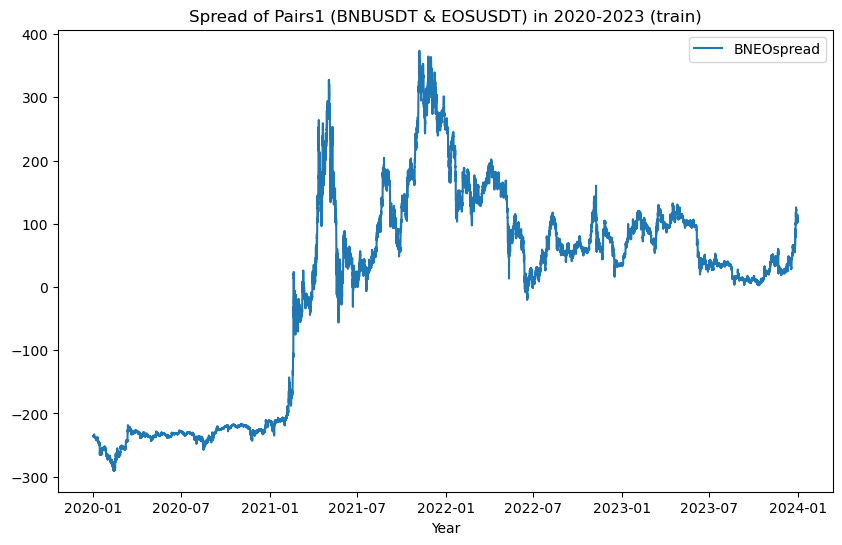

In [22]:
plt.figure(figsize=(10, 6))

plt.plot(pairs1_2023.index, pairs1_2023['BNEOspread'], label='BNEOspread')

plt.xlabel('Year')
plt.title('Spread of Pairs1 (BNBUSDT & EOSUSDT) in 2020-2023 (train)')

plt.legend()

plt.show()

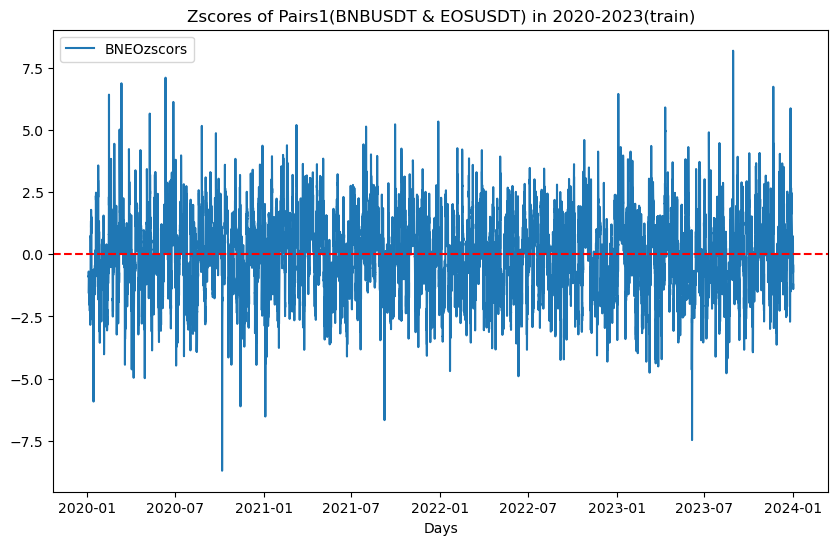

In [23]:
plt.figure(figsize=(10, 6))

plt.plot(pairs1_2023.index, pairs1_2023['BNEOzscors'], label='BNEOzscors')

plt.xlabel('Days')
plt.title('Zscores of Pairs1(BNBUSDT & EOSUSDT) in 2020-2023(train)')
plt.axhline(y=0, color='red', linestyle='--') 

plt.legend()

plt.show()

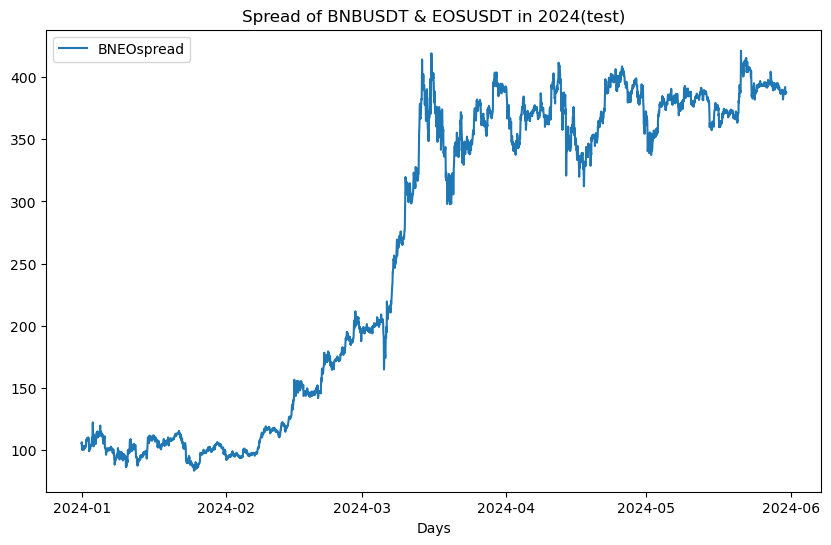

In [24]:
plt.figure(figsize=(10, 6))

plt.plot(pairs1_24.index, pairs1_24['BNEOspread'], label='BNEOspread')

plt.xlabel('Days')
plt.title('Spread of BNBUSDT & EOSUSDT in 2024(test)')

plt.legend()

plt.show()

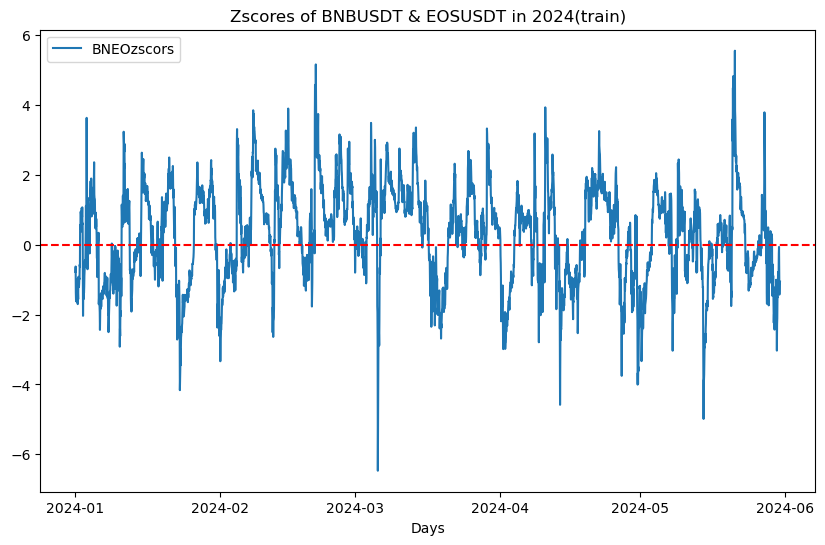

In [25]:
plt.figure(figsize=(10, 6))

plt.plot(pairs1_24.index, pairs1_24['BNEOzscors'], label='BNEOzscors')

plt.xlabel('Days')
plt.title('Zscores of BNBUSDT & EOSUSDT in 2024(train)')
plt.axhline(y=0, color='red', linestyle='--') 

plt.legend()

plt.show()

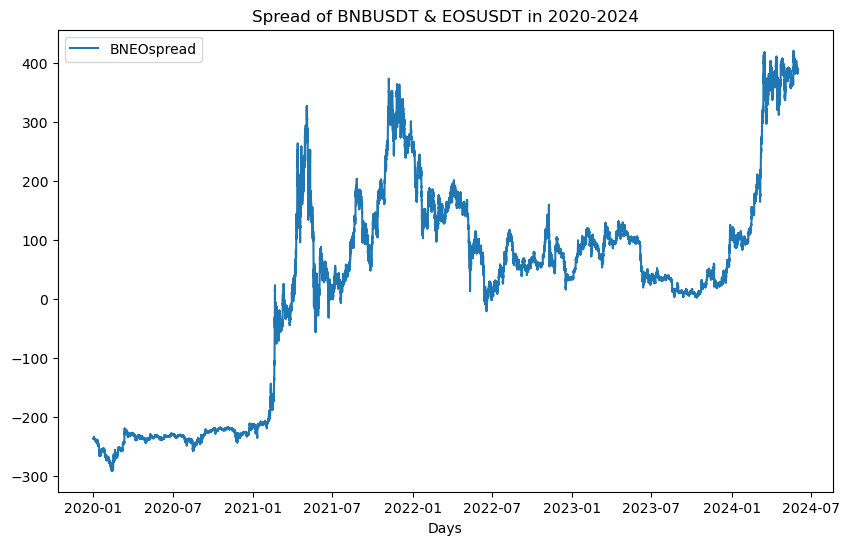

In [26]:
plt.figure(figsize=(10, 6))

plt.plot(combined_pairs1.index, combined_pairs1['BNEOspread'], label='BNEOspread')

plt.xlabel('Days')
plt.title('Spread of BNBUSDT & EOSUSDT in 2020-2024')

plt.legend()

plt.show()

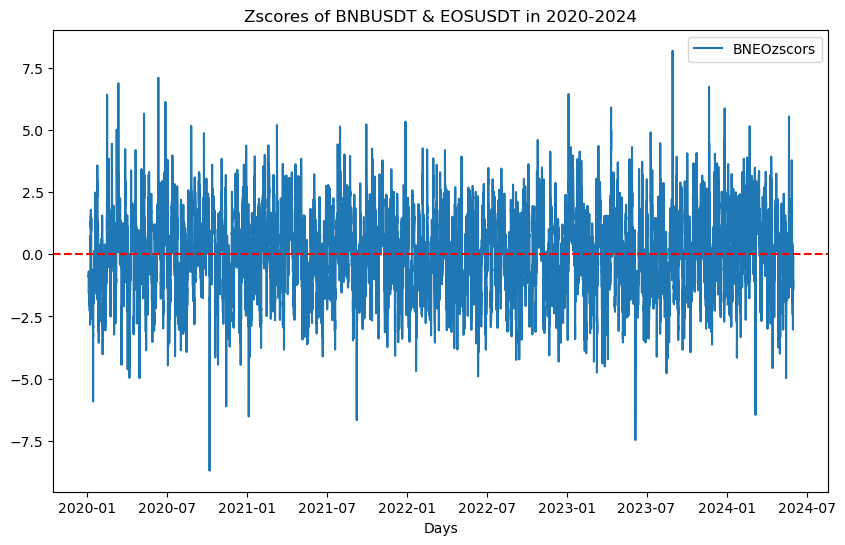

In [27]:
plt.figure(figsize=(10, 6))
plt.plot(combined_pairs1.index, combined_pairs1['BNEOzscors'], label='BNEOzscors')
plt.axhline(y=0, color='red', linestyle='--') 

plt.xlabel('Days')
plt.title('Zscores of BNBUSDT & EOSUSDT in 2020-2024')

plt.legend()

plt.show()

### 2) 2-year check: Choose the one that has overall cointegration pairs XRPUSDT & BCHUSDT

In [28]:
def cointegration_test(dataframe, p_value_threshold=0.05):
    p_value = {}
    columns = dataframe.columns
    for a1 in columns:
        for a2 in columns:
            if a1 != a2:
                test_result = ts.coint(dataframe[a1], dataframe[a2])
                p_value[a1 + ' and ' + a2] = test_result[1]
                
    p_value_df = pd.DataFrame(list(p_value.items()), columns=['Pair', 'P-Value'])
    filtered_df = p_value_df[p_value_df["P-Value"] < p_value_threshold]
    
    return filtered_df

In [29]:
crypto_2021 = crypto_prices_cleaned.loc['2020-01-01':'2021-12-31']
crypto_2122 = crypto_prices_cleaned.loc['2021-01-01':'2022-12-31']
crypto_2223 = crypto_prices_cleaned.loc['2022-01-01':'2023-12-31']

coin_crypto_2021 = cointegration_test(crypto_2021)
coin_crypto_2122 = cointegration_test(crypto_2122)
coin_crypto_2223 = cointegration_test(crypto_2223)

In [30]:
pd.concat([coin_crypto_2021,coin_crypto_2122,coin_crypto_2223],axis = 1)

,Pair,P-Value,Pair,P-Value,Pair,P-Value
12,BCHUSDT and EOSUSDT,0.024216,BCHUSDT and EOSUSDT,0.000562,NaN,NaN
16,BCHUSDT and XLMUSDT,0.031336,BCHUSDT and XLMUSDT,0.001403,NaN,NaN
17,BCHUSDT and XRPUSDT,0.030084,NaN,NaN,BCHUSDT and XRPUSDT,0.019152
37,EOSUSDT and BCHUSDT,0.005472,EOSUSDT and BCHUSDT,0.000281,NaN,NaN
41,EOSUSDT and LINKUSDT,0.047426,EOSUSDT and LINKUSDT,0.001349,NaN,NaN
42,EOSUSDT and LTCUSDT,0.044026,EOSUSDT and LTCUSDT,0.005068,NaN,NaN
43,EOSUSDT and XLMUSDT,0.049787,EOSUSDT and XLMUSDT,0.001951,NaN,NaN
44,EOSUSDT and XRPUSDT,0.028499,NaN,NaN,NaN,NaN
60,LINKUSDT and LTCUSDT,0.020414,LINKUSDT and LTCUSDT,0.000020,NaN,NaN
61,LINKUSDT and XLMUSDT,0.000976,LINKUSDT and XLMUSDT,0.000009,NaN,NaN


In [31]:
pairs_2 = crypto_prices_cleaned[['XRPUSDT',"BCHUSDT"]]
pairs_2

Assets,XRPUSDT,BCHUSDT
Date,,
2020-01-01 00:00:00,0.19248,204.43
2020-01-01 01:00:00,0.19371,206.19
2020-01-01 02:00:00,0.19418,207.38
2020-01-01 03:00:00,0.19397,205.71
2020-01-01 04:00:00,0.19363,206.20
...,...,...
2024-05-30 20:00:00,0.51880,467.30
2024-05-30 21:00:00,0.52020,467.70
2024-05-30 22:00:00,0.51970,466.50


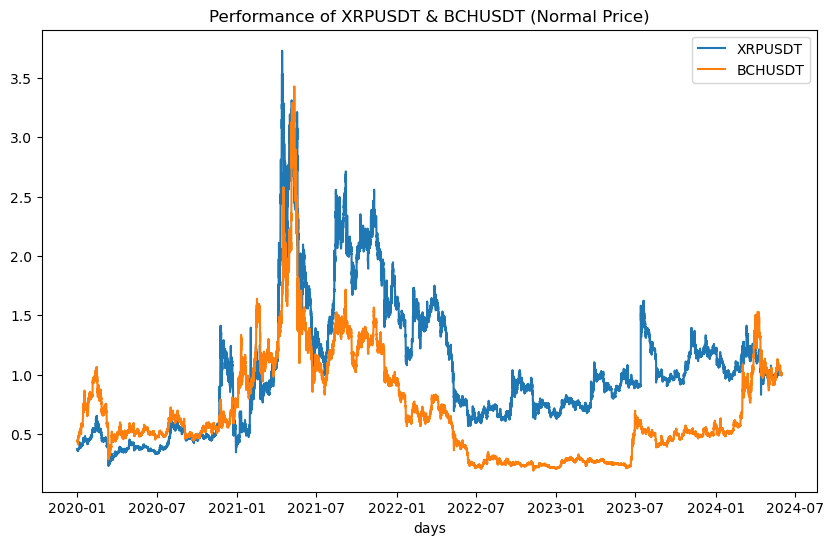

In [32]:
plt.figure(figsize = (10, 6))
plt.plot(norm_prices[['XRPUSDT',"BCHUSDT"]])
plt.xlabel('days')
plt.title('Performance of XRPUSDT & BCHUSDT (Normal Price)')
plt.legend(pairs_2.columns)
plt.show()

## Pairs Trading Strategy 

In [33]:
def calculate_rolling_beta(data, y_col, x_col, window):
    y = data[y_col]
    x = data[x_col]

    def rolling_ols_beta(y, x):
        x = sm.add_constant(x)
        model = sm.OLS(y, x).fit()
        return model.params[1] 

    rolling_beta = y.rolling(window=window).apply(lambda y: rolling_ols_beta(y, x[y.index]), raw=False)
    return rolling_beta

def calculate_rolling_intercept(data, y_col, x_col, window):
    y = data[y_col]
    x = data[x_col]

    def rolling_ols_intercept(y, x):
        x = sm.add_constant(x)
        model = sm.OLS(y, x).fit()
        return model.params[0] 

    rolling_intercept = y.rolling(window=window).apply(lambda y: rolling_ols_intercept(y, x[y.index]), raw=False)
    return rolling_intercept

In [34]:
def pairs_trading_strategy(data,label1,label2, z_signal_in, z_signal_out, min_spread, MA_window, OLS_window):
    data['beta'] = calculate_rolling_beta(data, label1, label2, OLS_window)
    data['intercept'] = calculate_rolling_intercept(data, label1, label2, OLS_window)
    data = data.dropna()
    
    data['spread'] = ((data[label1] - data['beta'] * data[label2]) - data['intercept'])
    data['Spread_MA'] = data['spread'].rolling(window=MA_window).mean()
    data['Spread_Std'] = data['spread'].rolling(window=MA_window).std()
    
    data['zscors'] = (data['spread'] - data['Spread_MA']) / data['Spread_Std']
    
    data['signal'] = np.nan
    data.loc[(data['zscors'] > z_signal_in) & (np.abs(data['spread']) > min_spread), 'signal'] = -1
    data.loc[(data['zscors'] < -z_signal_in) & (np.abs(data['spread']) > min_spread), 'signal'] = 1
    data.loc[data['zscors'].abs() < z_signal_out, 'signal'] = 0
    
    data['position'] = data['signal'].fillna(method='ffill').fillna(0).astype(int)
    
    data['return_Y'] = np.log(data[label1] / data[label1].shift(1)) 
    data['return_X'] = np.log(data[label2] / data[label2].shift(1)) 
    data['position_Y'] = data['position']
    data['position_Y'] = data['position_Y'].shift(1)
    data['position_X'] = data['position'] * data['beta'] * (-1)
    data['position_X'] = data['position_X'].shift(1)
    data['hourlypnl'] = (data['position_Y'] * data['return_Y'] + data['position_X'] * data['return_X'])
    data['cumpnl'] = data['hourlypnl'].cumsum()
    data['max_cumpnl'] = data['cumpnl'].cummax()
    
    plt.figure(figsize=(10, 6))
    plt.plot(data.index, data['spread'], label='Spread')
    plt.xlabel('Date')
    plt.ylabel('Spread')
    plt.title(f'Spread of Pairs ({label1} & {label2})')
    plt.legend()
    plt.show()

    plt.figure(figsize=(10, 6))
    plt.plot(data.index, data['zscors'], label='Z-scores')
    plt.xlabel('Date')
    plt.ylabel('Z-score')
    plt.title(f'Z-scores of Pairs ({label1} & {label2})')
    plt.axhline(y=0, color='red', linestyle='--')
    plt.legend()
    plt.show()

    change = data['position'].diff().fillna(0)
    plt.figure(figsize=(10, 6))
    plt.plot(data.index, data['spread'], label='Spread')
    buy_signals = data.index[change == 1]
    sell_signals = data.index[change == -1]
    buy_signal_y_value = data['spread'].min() - 0.05
    sell_signal_y_value = data['spread'].min() - 0.08
    plt.scatter(buy_signals, data['spread'][buy_signals], color='red', marker='^', s=50, label='Buy Signal')
    plt.scatter(sell_signals, data['spread'][sell_signals], color='green', marker='o', s=50, label='Sell Signal')
    
    plt.scatter(buy_signals, [buy_signal_y_value] * len(buy_signals), color='red', marker='^', s=50)
    plt.scatter(sell_signals, [sell_signal_y_value] * len(sell_signals), color='green', marker='o', s=50)
    plt.axhline(buy_signal_y_value, color='black', linestyle='--', linewidth=0.5)
    plt.axhline(sell_signal_y_value, color='black', linestyle='--', linewidth=0.5)
    plt.xlabel('Date')
    plt.ylabel('Spread')
    plt.title(f'Trading Signals of Pairs ({label1} & {label2})')
    plt.legend()
    plt.show()
    
    return data

In [35]:
z_signal_in = 1.96
z_signal_out = 0.25
min_spread = 0.005
MA_window = 90
OLS_window = 365*24

In [36]:
def pnlPerformance(pnl, pairs,label,year,stop_loss):
    cumpnl = pnl.cumsum(skipna=True)
    max_cumpnl = cumpnl.cummax(skipna=True)
    sharpe = pnl.mean() / np.std(pnl)
    sharpe = sharpe * np.sqrt(24 * 252)
    
    average_annual_returns = pnl.mean() * 24 * 252 * 100
    total_returns = pnl.sum() * 100
    
    highwatermark_df = cumpnl.cummax()
    drawdown_df = cumpnl - highwatermark_df
    maxdrawdown = drawdown_df.min()
    
    max_drawdown_start = drawdown_df.idxmin()
    max_drawdown_end = \
       drawdown_df[drawdown_df == 0].index[0] if not drawdown_df[drawdown_df == 0].empty else max_drawdown_start
    max_drawdown_period = max_drawdown_end - max_drawdown_start
    
    performance_stats = {'Year': year,
                         'Stop-Loss':stop_loss,
                         'Sharpe Ratio': sharpe,
                         'Average Annual Returns (%)': average_annual_returns,
                         'Total Returns (%)': total_returns,
                         'Max Drawdown (%)': maxdrawdown * 100,
                         'Max Drawdown Period': max_drawdown_period
                        }
    
    performance_df = pd.DataFrame(performance_stats, index=[label])
    
    plt.figure(figsize=(10, 6))
    plt.plot(cumpnl.values, label='Cumulative PnL')
    plt.plot(max_cumpnl.values, label='Max Cumulative PnL')
    plt.legend()
    plt.title(f"Performance of Pairs {pairs}")
    plt.show()
    
    return performance_df

In [37]:
def stop_loss_strategy1(data, label1, label2, crypto1, crypto2, num_consecutive_losses=4):
    stoploss_data = data.copy()
    new_data = data.copy()

    stoploss_data['stop_loss_signal'] = np.nan
    for i in range(3, len(stoploss_data)):
        if (stoploss_data['hourlypnl'].iloc[i-3] < 0 and
            stoploss_data['hourlypnl'].iloc[i-2] < 0 and
            stoploss_data['hourlypnl'].iloc[i-1] < 0 and
            stoploss_data['hourlypnl'].iloc[i] < 0):
            stoploss_data['stop_loss_signal'].iloc[i] = 0

    new_data['signal'].update(stoploss_data['stop_loss_signal'])

    new_data['position'] = new_data['signal'].fillna(method='ffill').fillna(0).astype(int)
    new_data['position'] = new_data['position'].shift(1)

    new_data['return_crypto1'] = np.log(new_data[crypto1] / new_data[crypto1].shift(1))
    new_data['return_crypto2'] = np.log(new_data[crypto2] / new_data[crypto2].shift(1))

    new_data['crypto1position'] = new_data['position']
    new_data['crypto2position'] = new_data['position'] * new_data['beta'] * (-1)
    new_data['hourlypnl'] = (new_data['crypto1position'] * new_data['return_crypto1'] +
                             new_data['crypto2position'] * new_data['return_crypto2']
                            )
    
    new_data['cumpnl'] = new_data['hourlypnl'].cumsum()
    new_data['max_cumpnl'] = new_data['cumpnl'].cummax()
    
    plt.figure(figsize=(10, 6))
    plt.plot(new_data.index, new_data['spread'], label='Spread')
    plt.xlabel('Date')
    plt.ylabel('Spread')
    plt.title(f'Spread of Pairs ({label1} & {label2})')
    plt.legend()
    plt.show()

    plt.figure(figsize=(10, 6))
    plt.plot(new_data.index, new_data['zscors'], label='Z-scores')
    plt.xlabel('Date')
    plt.ylabel('Z-score')
    plt.title(f'Z-scores of Pairs ({label1} & {label2})')
    plt.axhline(y=0, color='red', linestyle='--')
    plt.legend()
    plt.show()

    change = new_data['position'].diff().fillna(0)
    plt.figure(figsize=(10, 6))
    plt.plot(new_data.index, new_data['spread'], label='Spread')
    buy_signals = new_data.index[change == 1]
    sell_signals = new_data.index[change == -1]
    buy_signal_y_value = new_data['spread'].min() - 0.05
    sell_signal_y_value = new_data['spread'].min() - 0.08
    plt.scatter(buy_signals, new_data['spread'][buy_signals], color='red', marker='^', s=50, label='Buy Signal')
    plt.scatter(sell_signals, new_data['spread'][sell_signals], color='green', marker='o', s=50, label='Sell Signal')
    
    plt.scatter(buy_signals, [buy_signal_y_value] * len(buy_signals), color='red', marker='^', s=50, label='Buy Signal')
    plt.scatter(sell_signals, [sell_signal_y_value] * len(sell_signals), color='green', marker='o', s=50, label='Sell Signal')
    plt.axhline(buy_signal_y_value, color='black', linestyle='--', linewidth=0.5)
    plt.axhline(sell_signal_y_value, color='black', linestyle='--', linewidth=0.5)
    plt.xlabel('Date')
    plt.ylabel('Spread')
    plt.title(f'Trading Signals of Pairs ({label1} & {label2})')
    plt.legend()
    plt.show()
        
    return new_data

In [38]:
def bollinger_band_stop_loss(data,pnl_label,label1,label2,boll_window,std_multiplier):
    stoploss_data = data.copy()
    new_data = data.copy()
    stoploss_data['Rolling_mean'] = stoploss_data[pnl_label].rolling(boll_window).mean()
    stoploss_data['Rolling_std'] = stoploss_data[pnl_label].rolling(boll_window).std()
    stoploss_data['Upper_band'] = stoploss_data['Rolling_mean'] + std_multiplier * stoploss_data['Rolling_std']
    stoploss_data['Lower_band'] = stoploss_data['Rolling_mean'] - std_multiplier * stoploss_data['Rolling_std']
    stoploss_data['Stop_Loss'] = np.where((stoploss_data[pnl_label] < stoploss_data['Lower_band']) | 
                                          (stoploss_data[pnl_label] > stoploss_data['Upper_band']),
                                          0, np.nan)

    new_data['stop_loss_signal'] = stoploss_data['Stop_Loss']
    new_data['signal'].update(new_data['stop_loss_signal'])
    
    new_data['position'] = new_data['signal'].fillna(method='ffill').fillna(0).astype(int)
    new_data['position'] = new_data['position'].shift(1)
    
    new_data['return_Y'] = np.log(new_data[label1] / new_data[label1].shift(1)) 
    new_data['return_X'] = np.log(new_data[label2] / new_data[label2].shift(1)) 
    new_data['position_Y'] = new_data['position']
    new_data['position_X'] = new_data['position'] * new_data['beta'] * (-1)
    new_data['hourlypnl'] = (new_data['position_Y'] * new_data['return_Y'] 
                             + new_data['position_X'] * new_data['return_X'])
    new_data['cumpnl'] = new_data['hourlypnl'].cumsum()
    new_data['max_cumpnl'] = new_data['cumpnl'].cummax()
    
    plt.figure(figsize=(10, 6))
    plt.plot(new_data.index, new_data['spread'], label='Spread')
    plt.xlabel('Date')
    plt.ylabel('Spread')
    plt.title(f'Spread of Pairs ({label1} & {label2})')
    plt.legend()
    plt.show()

    plt.figure(figsize=(10, 6))
    plt.plot(new_data.index, new_data['zscors'], label='Z-scores')
    plt.xlabel('Date')
    plt.ylabel('Z-score')
    plt.title(f'Z-scores of Pairs ({label1} & {label2})')
    plt.axhline(y=0, color='red', linestyle='--')
    plt.legend()
    plt.show()

    change = new_data['position'].diff().fillna(0)
    plt.figure(figsize=(10, 6))
    plt.plot(new_data.index, new_data['spread'], label='Spread')
    buy_signals = new_data.index[change == 1]
    sell_signals = new_data.index[change == -1]
    buy_signal_y_value = new_data['spread'].min() - 0.05
    sell_signal_y_value = new_data['spread'].min() - 0.07
    plt.scatter(buy_signals, new_data['spread'][buy_signals], color='red', marker='^', s=50, label='Buy Signal')
    plt.scatter(sell_signals, new_data['spread'][sell_signals], color='green', marker='o', s=50, label='Sell Signal')
    plt.scatter(buy_signals, [buy_signal_y_value] * len(buy_signals), color='red', marker='^', s=50, label='Buy Signal')
    plt.scatter(sell_signals, [sell_signal_y_value] * len(sell_signals), color='green', marker='o', s=50, label='Sell Signal')
    plt.axhline(buy_signal_y_value, color='black', linestyle='--', linewidth=0.5)
    plt.axhline(sell_signal_y_value, color='black', linestyle='--', linewidth=0.5)
    plt.xlabel('Date')
    plt.ylabel('Spread')
    plt.title(f'Trading Signals of Pairs ({label1} & {label2})')
    plt.legend()
    plt.show()
    
    plt.figure(figsize=(10, 6))
    plt.plot(stoploss_data.index, stoploss_data[pnl_label], label='Cumulative PnL')
    plt.plot(stoploss_data.index, stoploss_data['Rolling_mean'], label='Rolling Mean', linestyle='--')
    plt.plot(stoploss_data.index, stoploss_data['Upper_band'], label='Upper Band', linestyle='--')
    plt.plot(stoploss_data.index, stoploss_data['Lower_band'], label='Lower Band', linestyle='--')
    plt.fill_between(stoploss_data.index, stoploss_data['Lower_band'], stoploss_data['Upper_band'], color='gray', alpha=0.2)
    plt.xlabel('Date')
    plt.ylabel('Cumulative PnL')
    plt.title('Bollinger Bands for Cumulative PnL')
    plt.legend()
    plt.show()
    
    return new_data

In [39]:
boll_window = 15
std_multiplier = 1.96

### Version 1 : whole cointegration with drop 4-days stop-loss 'BNBUSDT & EOSUSDT'

In [40]:
pairs1_train_2123 = pairs_1.loc['2020-01-01':'2023-12-31']
pairs1_train_2123

Assets,BNBUSDT,EOSUSDT
Date,,
2020-01-01 00:00:00,13.6981,2.5882
2020-01-01 01:00:00,13.7995,2.6161
2020-01-01 02:00:00,13.8478,2.6223
2020-01-01 03:00:00,13.8170,2.6085
2020-01-01 04:00:00,13.7922,2.6165
...,...,...
2023-12-31 19:00:00,316.2000,0.8610
2023-12-31 20:00:00,312.3000,0.8530
2023-12-31 21:00:00,312.9000,0.8630


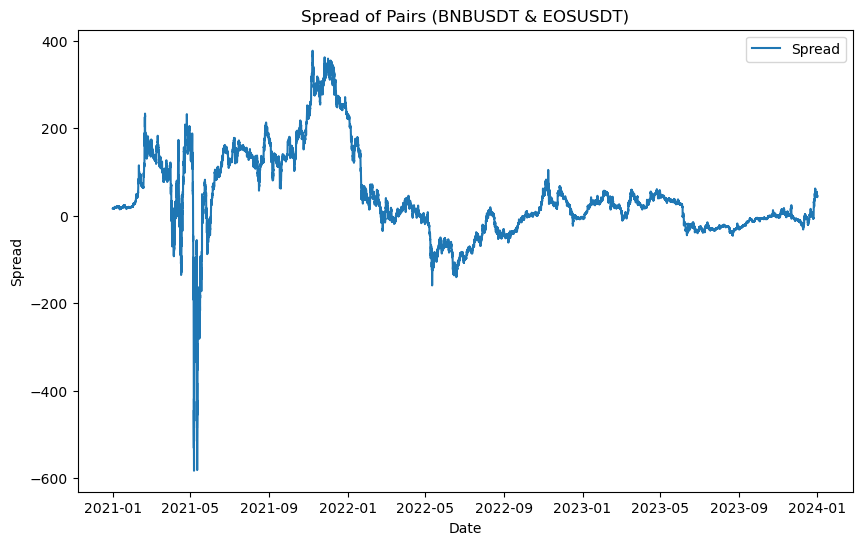

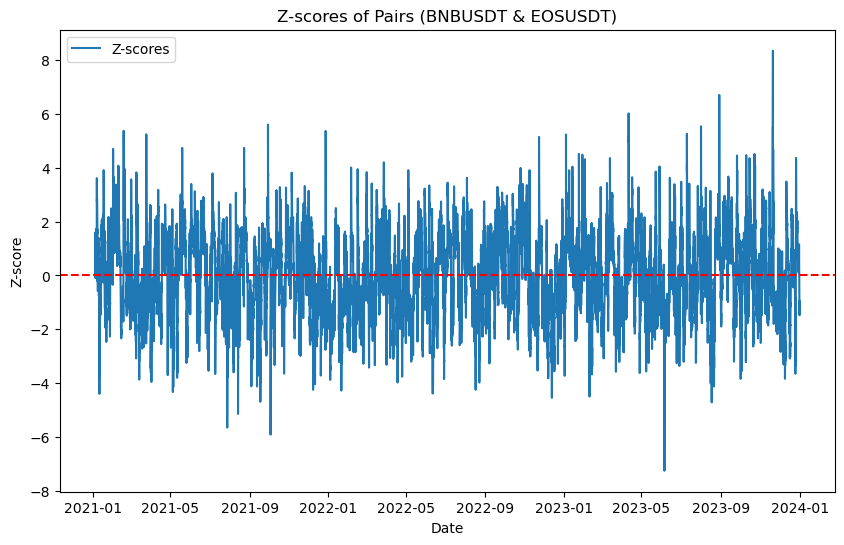

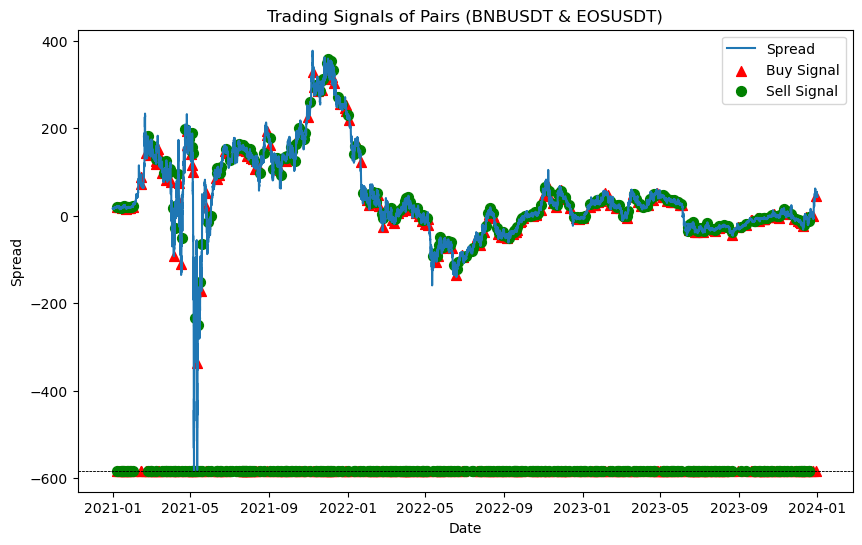

Assets,BNBUSDT,EOSUSDT,beta,intercept,spread,Spread_MA,Spread_Std,zscors,signal,position,return_Y,return_X,position_Y,position_X,hourlypnl,cumpnl,max_cumpnl
Date,,,,,,,,,,,,,,,,,
2020-12-31 17:00:00,37.1184,2.5664,1.576284,16.692384,16.380641,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-12-31 18:00:00,37.1045,2.5779,1.573882,16.702042,16.345148,NaN,NaN,NaN,NaN,0,-0.000375,0.004471,0.0,-0.0,-0.0,0.000000,0.000000
2020-12-31 19:00:00,37.1399,2.5797,1.571553,16.711484,16.374281,NaN,NaN,NaN,NaN,0,0.000954,0.000698,0.0,-0.0,0.0,0.000000,0.000000
2020-12-31 20:00:00,37.1855,2.5875,1.569278,16.720769,16.404224,NaN,NaN,NaN,NaN,0,0.001227,0.003019,0.0,-0.0,0.0,0.000000,0.000000
2020-12-31 21:00:00,37.0441,2.5865,1.566981,16.730103,16.261000,NaN,NaN,NaN,NaN,0,-0.003810,-0.000387,0.0,-0.0,0.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 19:00:00,316.2000,0.8610,178.208681,116.810969,45.951357,49.150858,4.468922,-0.715945,NaN,0,-0.000948,-0.001161,0.0,-0.0,0.0,51.634389,63.200633
2023-12-31 20:00:00,312.3000,0.8530,178.211745,116.816147,43.469235,49.111121,4.503618,-1.252745,NaN,0,-0.012411,-0.009335,0.0,-0.0,0.0,51.634389,63.200633
2023-12-31 21:00:00,312.9000,0.8630,178.215963,116.820260,42.279364,49.031973,4.560669,-1.480618,NaN,0,0.001919,0.011655,0.0,-0.0,0.0,51.634389,63.200633


In [41]:
pairs1_train_2123 = pairs_trading_strategy(pairs1_train_2123,'BNBUSDT','EOSUSDT',z_signal_in, 
                                           z_signal_out, min_spread, MA_window, OLS_window
                                          )
pairs1_train_2123

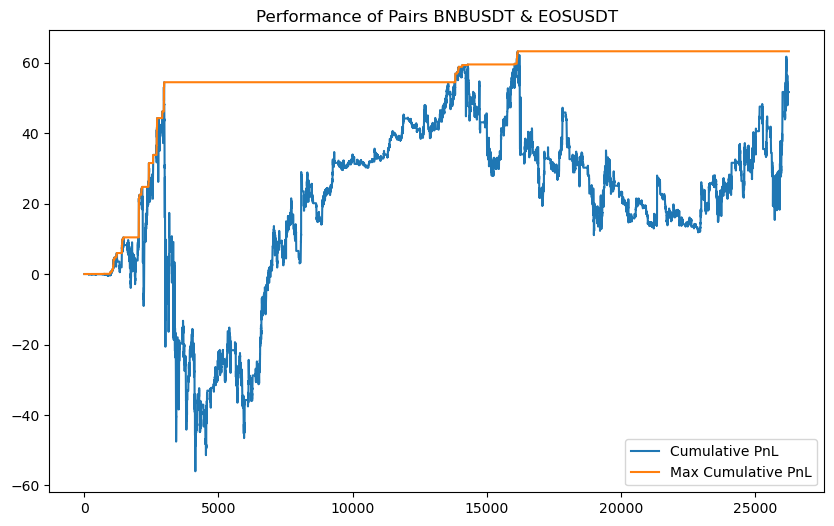

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2021-2023,No,0.209421,1188.660107,5163.438876,-11038.562436,-173 days +05:00:00


In [42]:
pairs1_train_2123_performance = \
   pnlPerformance(pairs1_train_2123['hourlypnl'].dropna(),'BNBUSDT & EOSUSDT','Train','2021-2023','No')
pairs1_train_2123_performance

In [43]:
pairs1_train_2223 = pairs_1.loc['2021-01-01':'2023-12-31']
pairs1_train_2223

Assets,BNBUSDT,EOSUSDT
Date,,
2021-01-01 00:00:00,37.3764,2.6025
2021-01-01 01:00:00,37.6134,2.6319
2021-01-01 02:00:00,37.9600,2.6310
2021-01-01 03:00:00,37.9250,2.6353
2021-01-01 04:00:00,37.8702,2.6386
...,...,...
2023-12-31 19:00:00,316.2000,0.8610
2023-12-31 20:00:00,312.3000,0.8530
2023-12-31 21:00:00,312.9000,0.8630


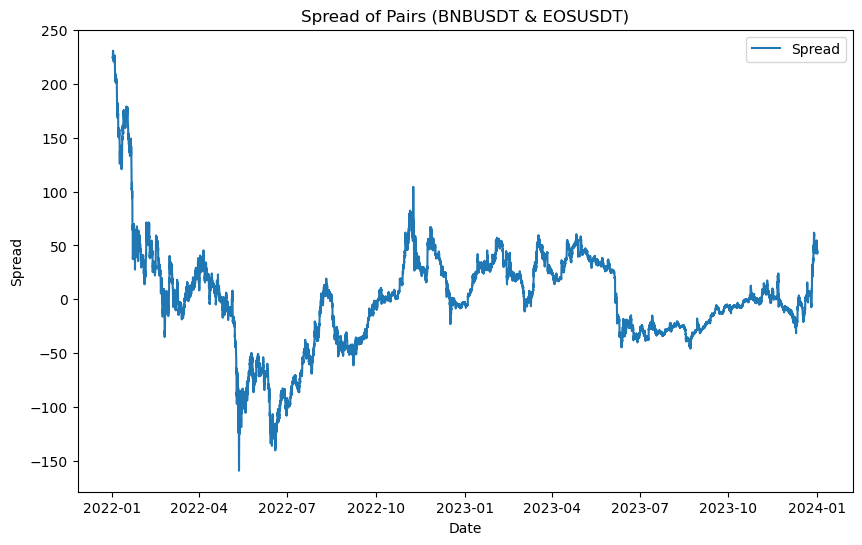

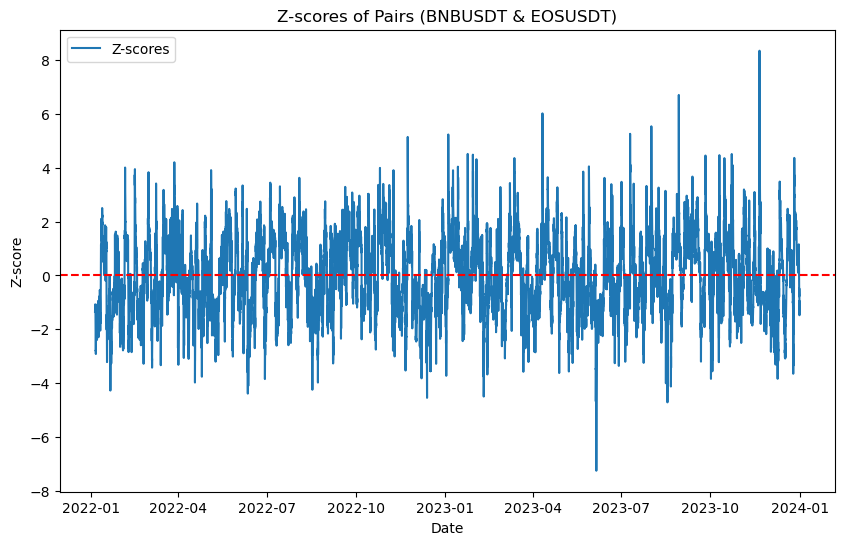

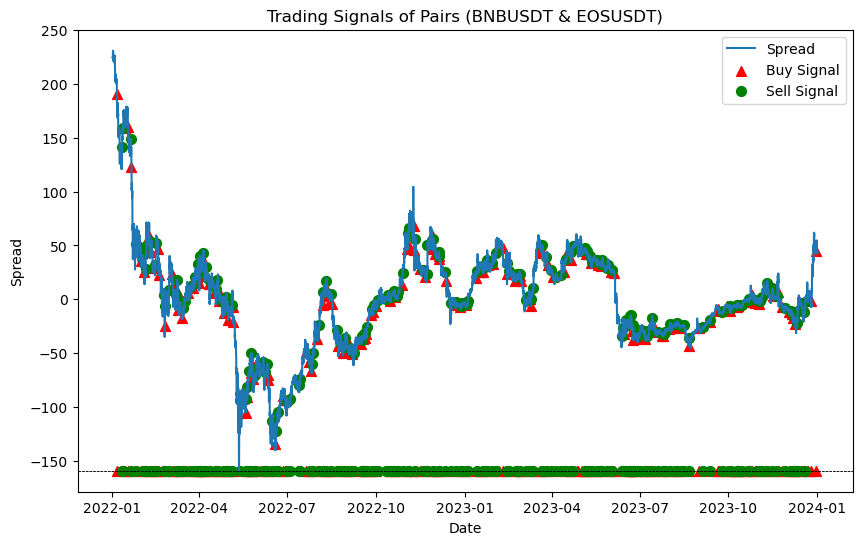

Assets,BNBUSDT,EOSUSDT,beta,intercept,spread,Spread_MA,Spread_Std,zscors,signal,position,return_Y,return_X,position_Y,position_X,hourlypnl,cumpnl,max_cumpnl
Date,,,,,,,,,,,,,,,,,
2022-01-01 12:00:00,516.9,3.069,54.161687,125.801790,224.875992,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-01-01 13:00:00,517.1,3.065,54.124022,126.028928,225.180945,NaN,NaN,NaN,NaN,0,0.000387,-0.001304,0.0,-0.0,0.0,0.000000,0.000000
2022-01-01 14:00:00,516.3,3.067,54.086617,126.254907,224.161438,NaN,NaN,NaN,NaN,0,-0.001548,0.000652,0.0,-0.0,-0.0,0.000000,0.000000
2022-01-01 15:00:00,518.7,3.077,54.049200,126.481113,225.909497,NaN,NaN,NaN,NaN,0,0.004638,0.003255,0.0,-0.0,0.0,0.000000,0.000000
2022-01-01 16:00:00,521.2,3.077,54.011618,126.708411,228.297841,NaN,NaN,NaN,NaN,0,0.004808,0.000000,0.0,-0.0,0.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 19:00:00,316.2,0.861,178.208681,116.810969,45.951357,49.150858,4.468922,-0.715945,NaN,0,-0.000948,-0.001161,0.0,-0.0,0.0,34.496188,46.062432
2023-12-31 20:00:00,312.3,0.853,178.211745,116.816147,43.469235,49.111121,4.503618,-1.252745,NaN,0,-0.012411,-0.009335,0.0,-0.0,0.0,34.496188,46.062432
2023-12-31 21:00:00,312.9,0.863,178.215963,116.820260,42.279364,49.031973,4.560669,-1.480618,NaN,0,0.001919,0.011655,0.0,-0.0,0.0,34.496188,46.062432


In [44]:
pairs1_train_2223 = \
   pairs_trading_strategy(pairs1_train_2223,'BNBUSDT','EOSUSDT',z_signal_in, 
                          z_signal_out, min_spread, MA_window, OLS_window
                         )
pairs1_train_2223

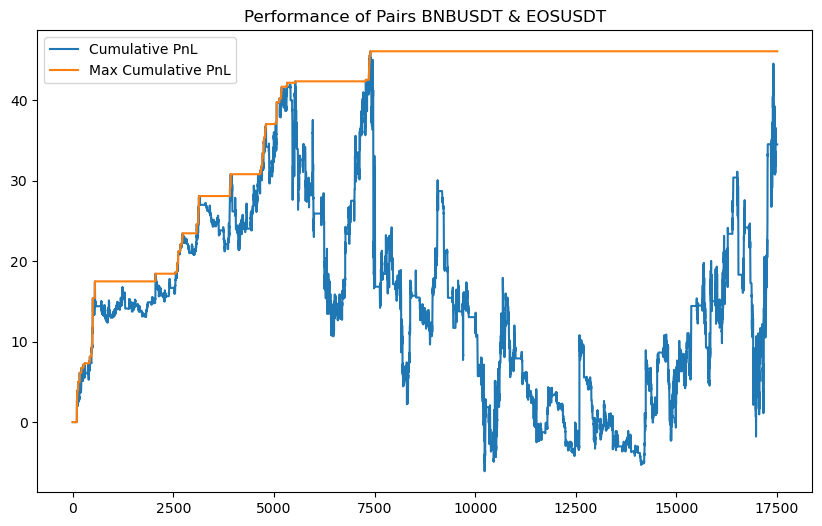

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2022-2023,No,0.28783,1191.779632,3449.618757,-5217.006663,-427 days +14:00:00


In [45]:
pairs1_train_2223_performance = \
   pnlPerformance(pairs1_train_2223['hourlypnl'].dropna(),'BNBUSDT & EOSUSDT','Train','2022-2023','No')

pairs1_train_2223_performance

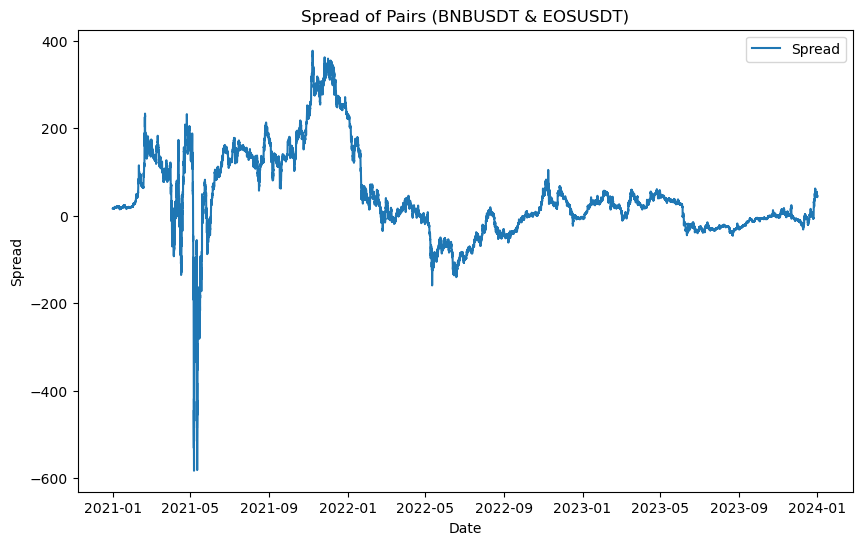

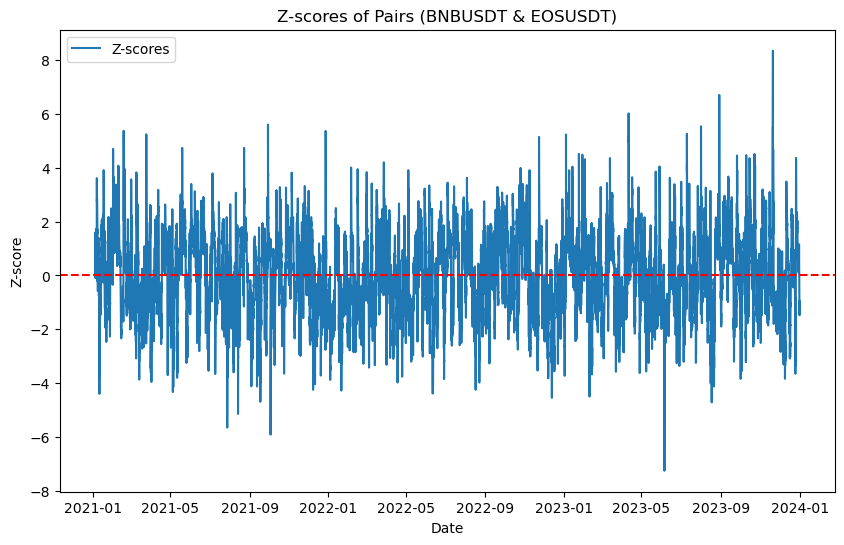

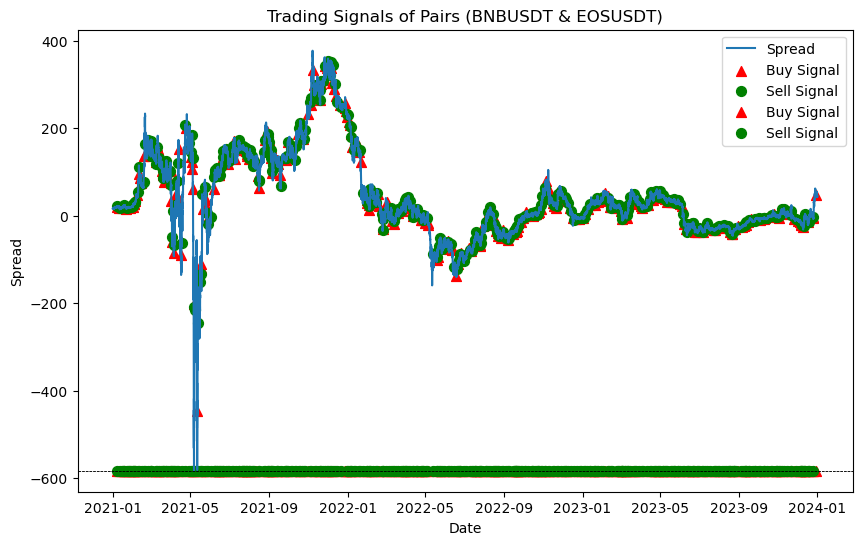

Assets,BNBUSDT,EOSUSDT,beta,intercept,spread,Spread_MA,Spread_Std,zscors,signal,position,...,return_X,position_Y,position_X,hourlypnl,cumpnl,max_cumpnl,return_crypto1,return_crypto2,crypto1position,crypto2position
Date,,,,,,,,,,,,,,,,,,,,,
2020-12-31 17:00:00,37.1184,2.5664,1.576284,16.692384,16.380641,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-12-31 18:00:00,37.1045,2.5779,1.573882,16.702042,16.345148,NaN,NaN,NaN,NaN,0.0,...,0.004471,0.0,-0.0,-0.0,0.000000,0.000000,-0.000375,0.004471,0.0,-0.0
2020-12-31 19:00:00,37.1399,2.5797,1.571553,16.711484,16.374281,NaN,NaN,NaN,NaN,0.0,...,0.000698,0.0,-0.0,0.0,0.000000,0.000000,0.000954,0.000698,0.0,-0.0
2020-12-31 20:00:00,37.1855,2.5875,1.569278,16.720769,16.404224,NaN,NaN,NaN,NaN,0.0,...,0.003019,0.0,-0.0,0.0,0.000000,0.000000,0.001227,0.003019,0.0,-0.0
2020-12-31 21:00:00,37.0441,2.5865,1.566981,16.730103,16.261000,NaN,NaN,NaN,NaN,0.0,...,-0.000387,0.0,-0.0,0.0,0.000000,0.000000,-0.003810,-0.000387,0.0,-0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 19:00:00,316.2000,0.8610,178.208681,116.810969,45.951357,49.150858,4.468922,-0.715945,NaN,0.0,...,-0.001161,0.0,-0.0,0.0,6.167945,44.272827,-0.000948,-0.001161,0.0,-0.0
2023-12-31 20:00:00,312.3000,0.8530,178.211745,116.816147,43.469235,49.111121,4.503618,-1.252745,NaN,0.0,...,-0.009335,0.0,-0.0,0.0,6.167945,44.272827,-0.012411,-0.009335,0.0,-0.0
2023-12-31 21:00:00,312.9000,0.8630,178.215963,116.820260,42.279364,49.031973,4.560669,-1.480618,NaN,0.0,...,0.011655,0.0,-0.0,0.0,6.167945,44.272827,0.001919,0.011655,0.0,-0.0


In [46]:
stoploss1_pairs1_train_2123 = \
   stop_loss_strategy1(pairs1_train_2123, 'BNBUSDT','EOSUSDT','BNBUSDT','EOSUSDT',num_consecutive_losses=4)
stoploss1_pairs1_train_2123


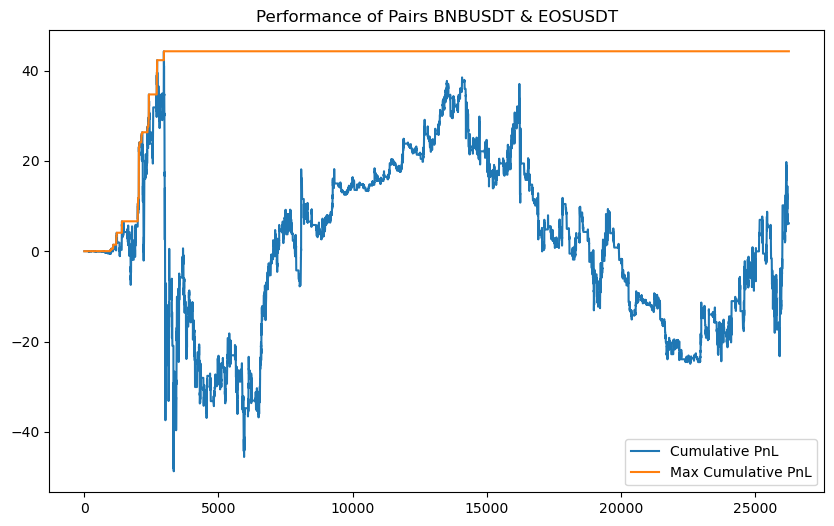

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2021-2023,Strategy 1,0.028061,141.990455,616.794517,-9300.335334,-140 days +18:00:00


In [47]:
pairs1_train_2123_stoploss1_performance = \
   pnlPerformance(stoploss1_pairs1_train_2123['hourlypnl'].dropna(),
                  'BNBUSDT & EOSUSDT','Train','2021-2023','Strategy 1')
pairs1_train_2123_stoploss1_performance

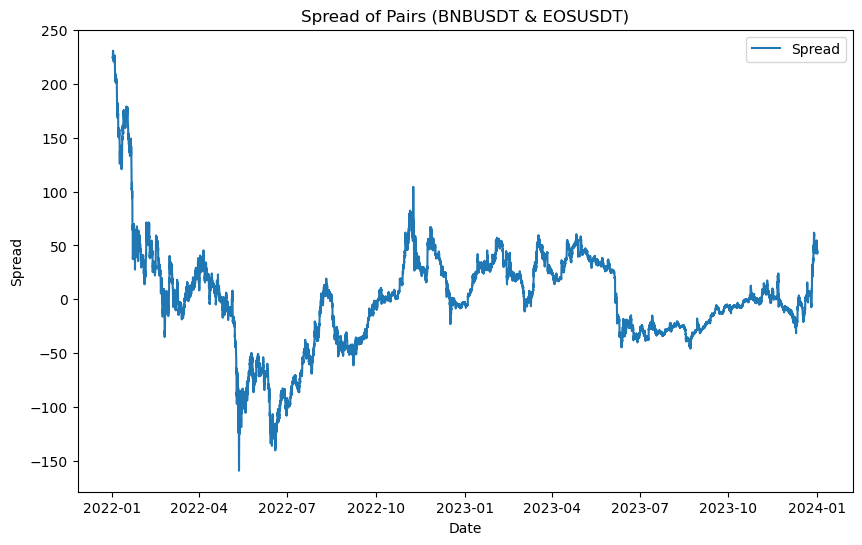

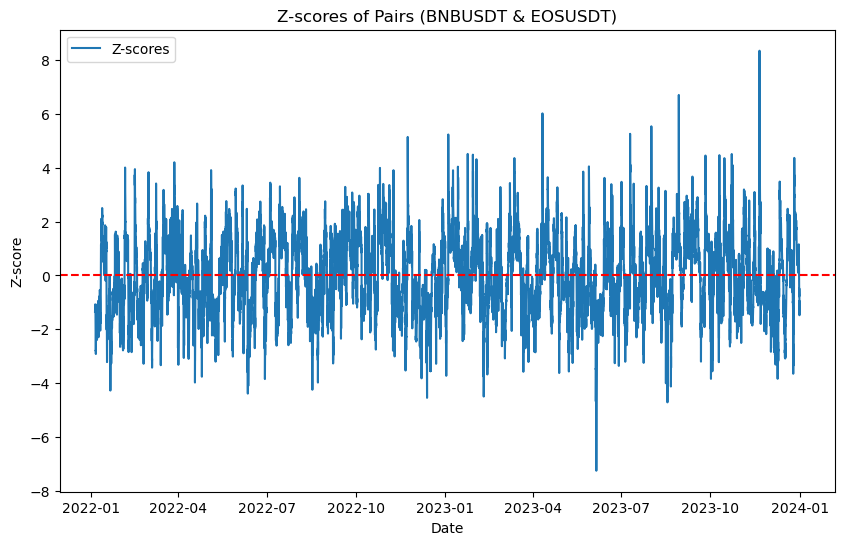

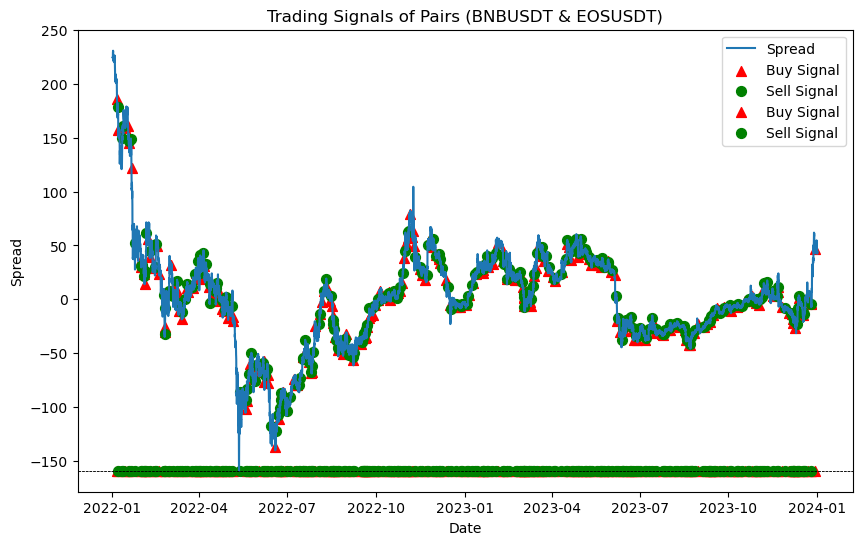

Assets,BNBUSDT,EOSUSDT,beta,intercept,spread,Spread_MA,Spread_Std,zscors,signal,position,...,return_X,position_Y,position_X,hourlypnl,cumpnl,max_cumpnl,return_crypto1,return_crypto2,crypto1position,crypto2position
Date,,,,,,,,,,,,,,,,,,,,,
2022-01-01 12:00:00,516.9,3.069,54.161687,125.801790,224.875992,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-01-01 13:00:00,517.1,3.065,54.124022,126.028928,225.180945,NaN,NaN,NaN,NaN,0.0,...,-0.001304,0.0,-0.0,0.0,0.000000,0.000000,0.000387,-0.001304,0.0,-0.0
2022-01-01 14:00:00,516.3,3.067,54.086617,126.254907,224.161438,NaN,NaN,NaN,NaN,0.0,...,0.000652,0.0,-0.0,-0.0,0.000000,0.000000,-0.001548,0.000652,0.0,-0.0
2022-01-01 15:00:00,518.7,3.077,54.049200,126.481113,225.909497,NaN,NaN,NaN,NaN,0.0,...,0.003255,0.0,-0.0,0.0,0.000000,0.000000,0.004638,0.003255,0.0,-0.0
2022-01-01 16:00:00,521.2,3.077,54.011618,126.708411,228.297841,NaN,NaN,NaN,NaN,0.0,...,0.000000,0.0,-0.0,0.0,0.000000,0.000000,0.004808,0.000000,0.0,-0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 19:00:00,316.2,0.861,178.208681,116.810969,45.951357,49.150858,4.468922,-0.715945,NaN,0.0,...,-0.001161,0.0,-0.0,0.0,2.896639,35.215638,-0.000948,-0.001161,0.0,-0.0
2023-12-31 20:00:00,312.3,0.853,178.211745,116.816147,43.469235,49.111121,4.503618,-1.252745,NaN,0.0,...,-0.009335,0.0,-0.0,0.0,2.896639,35.215638,-0.012411,-0.009335,0.0,-0.0
2023-12-31 21:00:00,312.9,0.863,178.215963,116.820260,42.279364,49.031973,4.560669,-1.480618,NaN,0.0,...,0.011655,0.0,-0.0,0.0,2.896639,35.215638,0.001919,0.011655,0.0,-0.0


In [48]:
stoploss1_pairs1_train_2223 = \
   stop_loss_strategy1(pairs1_train_2223, 'BNBUSDT','EOSUSDT','BNBUSDT','EOSUSDT',num_consecutive_losses=4)
stoploss1_pairs1_train_2223

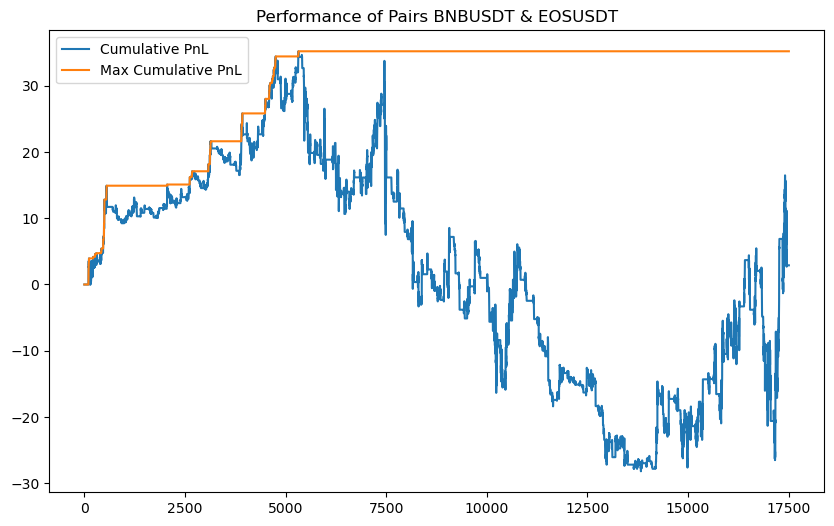

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2022-2023,Strategy 1,0.027531,100.073529,289.663889,-6341.876305,-577 days +18:00:00


In [49]:
pairs1_train_2223_stoploss1_performance = \
   pnlPerformance(stoploss1_pairs1_train_2223['hourlypnl'].dropna(),
                  'BNBUSDT & EOSUSDT','Train','2022-2023','Strategy 1'
                 )
pairs1_train_2223_stoploss1_performance

### Version 2: whole cointegration with bollinger band stop-loss 'BNBUSDT & EOSUSDT'

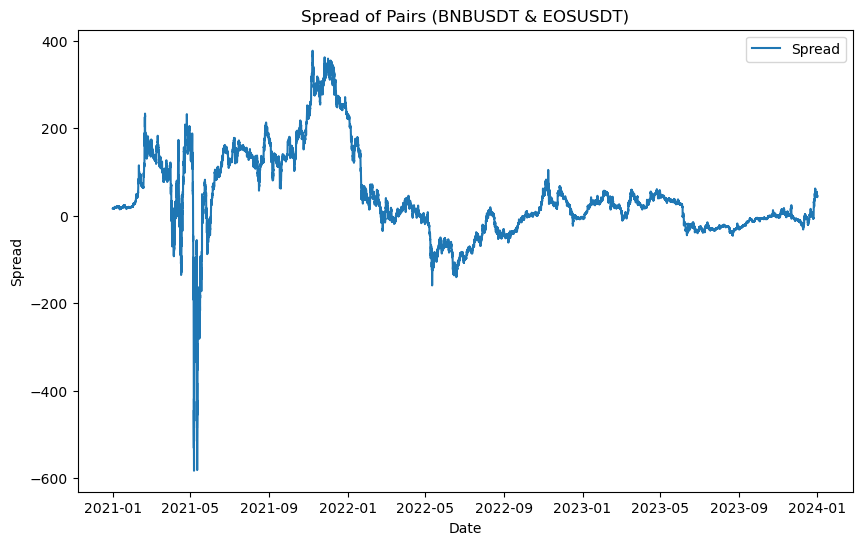

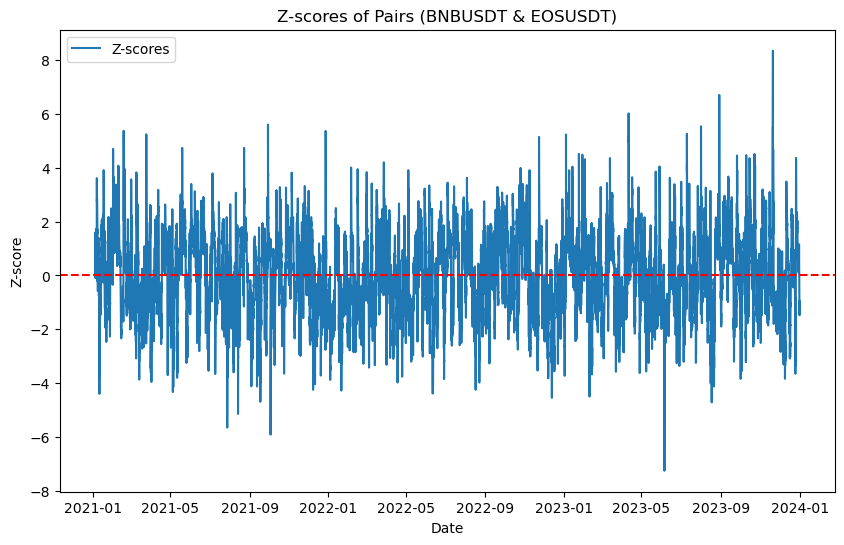

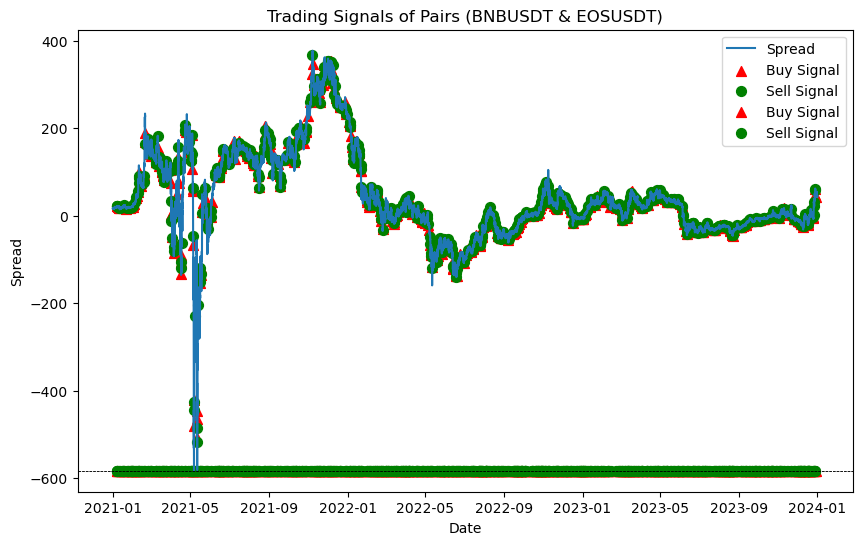

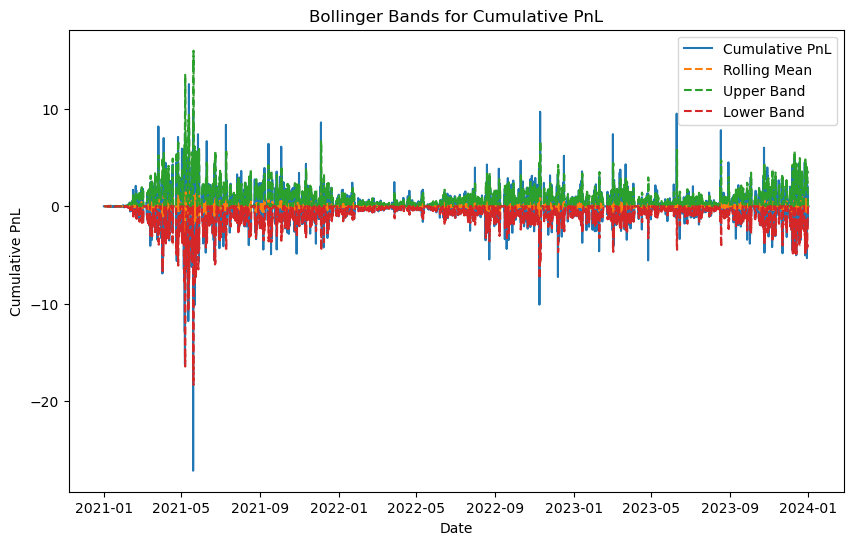

Assets,BNBUSDT,EOSUSDT,beta,intercept,spread,Spread_MA,Spread_Std,zscors,signal,position,return_Y,return_X,position_Y,position_X,hourlypnl,cumpnl,max_cumpnl,stop_loss_signal
Date,,,,,,,,,,,,,,,,,,
2020-12-31 17:00:00,37.1184,2.5664,1.576284,16.692384,16.380641,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-12-31 18:00:00,37.1045,2.5779,1.573882,16.702042,16.345148,NaN,NaN,NaN,NaN,0.0,-0.000375,0.004471,0.0,-0.0,-0.0,0.000000,0.000000,NaN
2020-12-31 19:00:00,37.1399,2.5797,1.571553,16.711484,16.374281,NaN,NaN,NaN,NaN,0.0,0.000954,0.000698,0.0,-0.0,0.0,0.000000,0.000000,NaN
2020-12-31 20:00:00,37.1855,2.5875,1.569278,16.720769,16.404224,NaN,NaN,NaN,NaN,0.0,0.001227,0.003019,0.0,-0.0,0.0,0.000000,0.000000,NaN
2020-12-31 21:00:00,37.0441,2.5865,1.566981,16.730103,16.261000,NaN,NaN,NaN,NaN,0.0,-0.003810,-0.000387,0.0,-0.0,0.0,0.000000,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 19:00:00,316.2000,0.8610,178.208681,116.810969,45.951357,49.150858,4.468922,-0.715945,NaN,0.0,-0.000948,-0.001161,0.0,-0.0,0.0,-33.740374,35.026676,NaN
2023-12-31 20:00:00,312.3000,0.8530,178.211745,116.816147,43.469235,49.111121,4.503618,-1.252745,NaN,0.0,-0.012411,-0.009335,0.0,-0.0,0.0,-33.740374,35.026676,NaN
2023-12-31 21:00:00,312.9000,0.8630,178.215963,116.820260,42.279364,49.031973,4.560669,-1.480618,NaN,0.0,0.001919,0.011655,0.0,-0.0,0.0,-33.740374,35.026676,NaN


In [50]:
stoploss2_pairs1_train_2123 = \
   bollinger_band_stop_loss(pairs1_train_2123, 'hourlypnl','BNBUSDT','EOSUSDT',boll_window,std_multiplier)
stoploss2_pairs1_train_2123

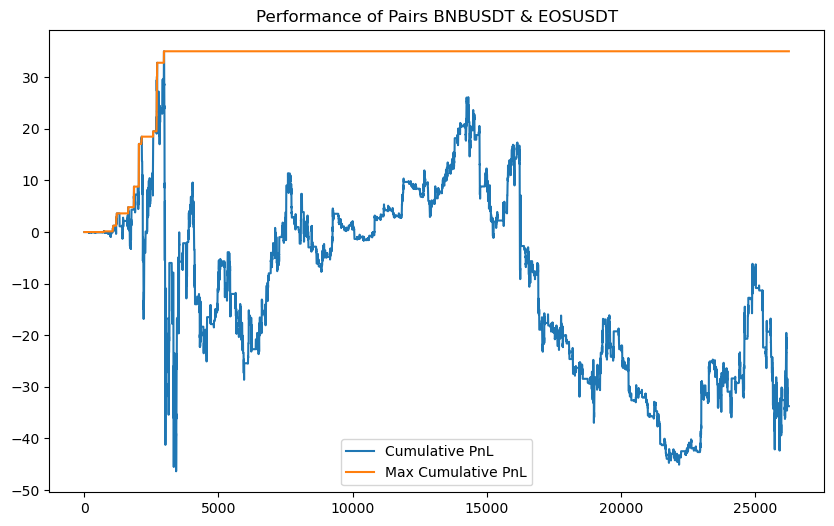

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2021-2023,Strategy 2,-0.169613,-776.727251,-3374.037424,-8138.166929,-143 days +02:00:00


In [51]:
pairs1_train_2123_stoploss2_performance = \
   pnlPerformance(stoploss2_pairs1_train_2123['hourlypnl'].dropna(),
                  'BNBUSDT & EOSUSDT','Train','2021-2023','Strategy 2')

pairs1_train_2123_stoploss2_performance

In [52]:
def compare_stop_loss_strategies(original_data, boll_data, label,name):
    plt.figure(figsize=(10, 6))
    plt.plot(original_data.index, original_data[label], label='Original Strategy')
    plt.plot(boll_data.index, boll_data[label], label='Bollinger Band Stop Loss Strategy')
    plt.xlabel('Date')
    plt.ylabel('Cumulative Returns')
    plt.title(f'Comparison Chart of Cumulative Returns for Stop Loss Strategies in {name}')
    plt.legend()
    plt.show()

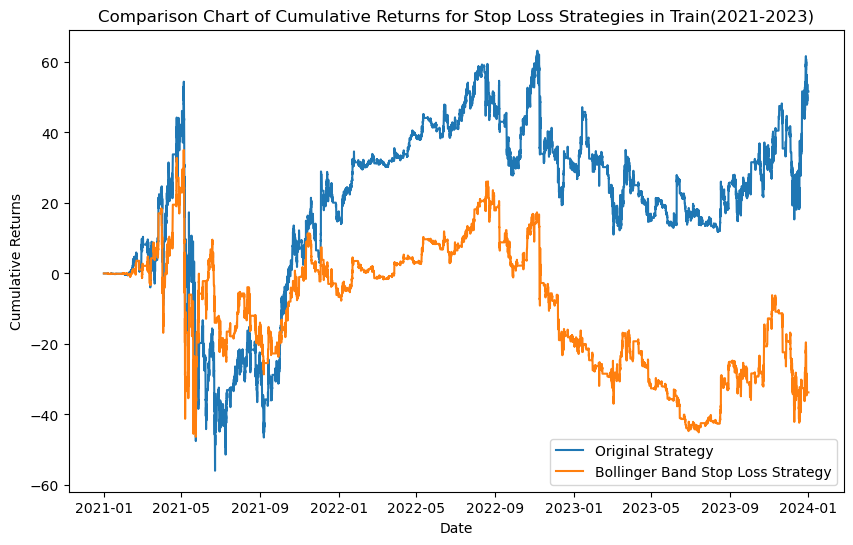

In [53]:
compare_stop_loss_strategies(pairs1_train_2123, stoploss2_pairs1_train_2123, 'cumpnl', 'Train(2021-2023)')

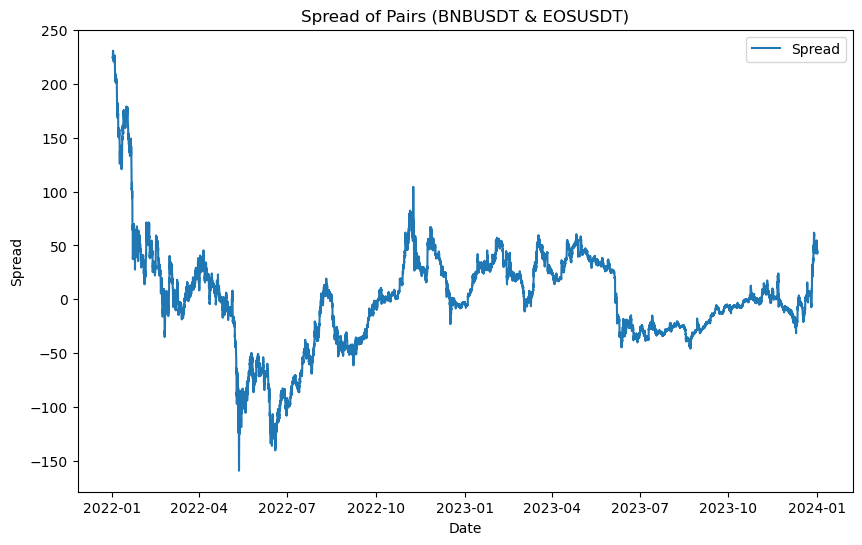

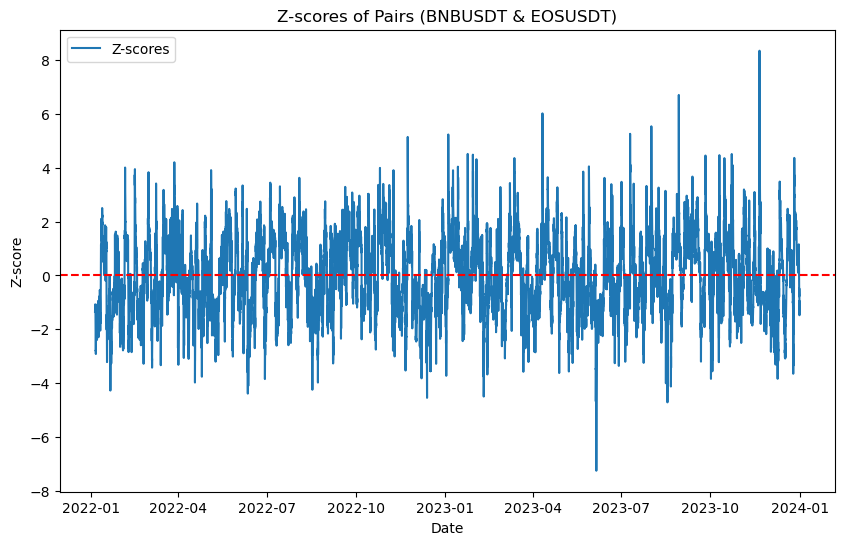

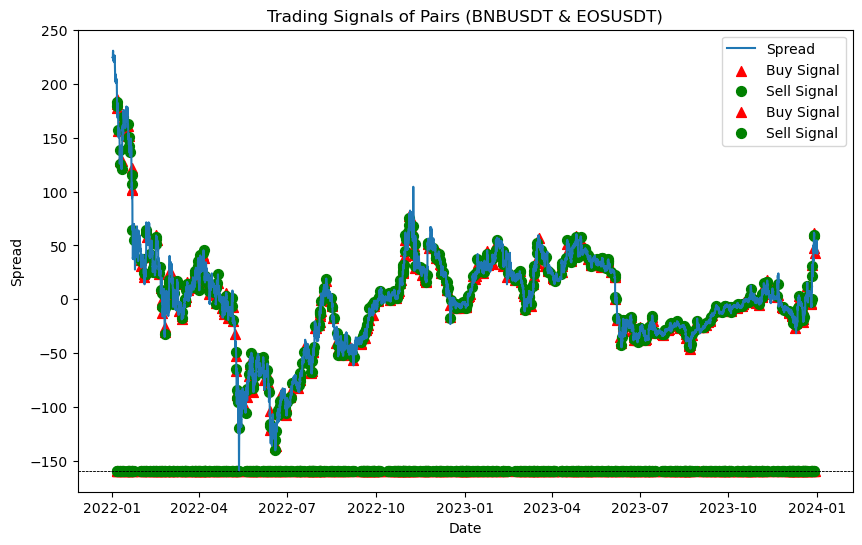

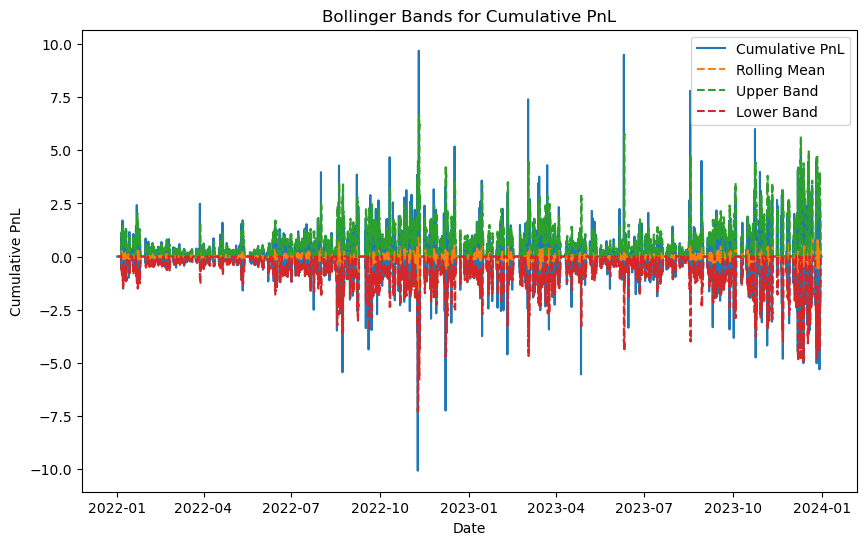

Assets,BNBUSDT,EOSUSDT,beta,intercept,spread,Spread_MA,Spread_Std,zscors,signal,position,return_Y,return_X,position_Y,position_X,hourlypnl,cumpnl,max_cumpnl,stop_loss_signal
Date,,,,,,,,,,,,,,,,,,
2022-01-01 12:00:00,516.9,3.069,54.161687,125.801790,224.875992,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-01-01 13:00:00,517.1,3.065,54.124022,126.028928,225.180945,NaN,NaN,NaN,NaN,0.0,0.000387,-0.001304,0.0,-0.0,0.0,0.000000,0.000000,NaN
2022-01-01 14:00:00,516.3,3.067,54.086617,126.254907,224.161438,NaN,NaN,NaN,NaN,0.0,-0.001548,0.000652,0.0,-0.0,-0.0,0.000000,0.000000,NaN
2022-01-01 15:00:00,518.7,3.077,54.049200,126.481113,225.909497,NaN,NaN,NaN,NaN,0.0,0.004638,0.003255,0.0,-0.0,0.0,0.000000,0.000000,NaN
2022-01-01 16:00:00,521.2,3.077,54.011618,126.708411,228.297841,NaN,NaN,NaN,NaN,0.0,0.004808,0.000000,0.0,-0.0,0.0,0.000000,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 19:00:00,316.2,0.861,178.208681,116.810969,45.951357,49.150858,4.468922,-0.715945,NaN,0.0,-0.000948,-0.001161,0.0,-0.0,0.0,-26.608047,33.267654,NaN
2023-12-31 20:00:00,312.3,0.853,178.211745,116.816147,43.469235,49.111121,4.503618,-1.252745,NaN,0.0,-0.012411,-0.009335,0.0,-0.0,0.0,-26.608047,33.267654,NaN
2023-12-31 21:00:00,312.9,0.863,178.215963,116.820260,42.279364,49.031973,4.560669,-1.480618,NaN,0.0,0.001919,0.011655,0.0,-0.0,0.0,-26.608047,33.267654,NaN


In [54]:
stoploss2_pairs1_train_2223 = \
   bollinger_band_stop_loss(pairs1_train_2223, 'hourlypnl','BNBUSDT','EOSUSDT',boll_window,std_multiplier)
stoploss2_pairs1_train_2223

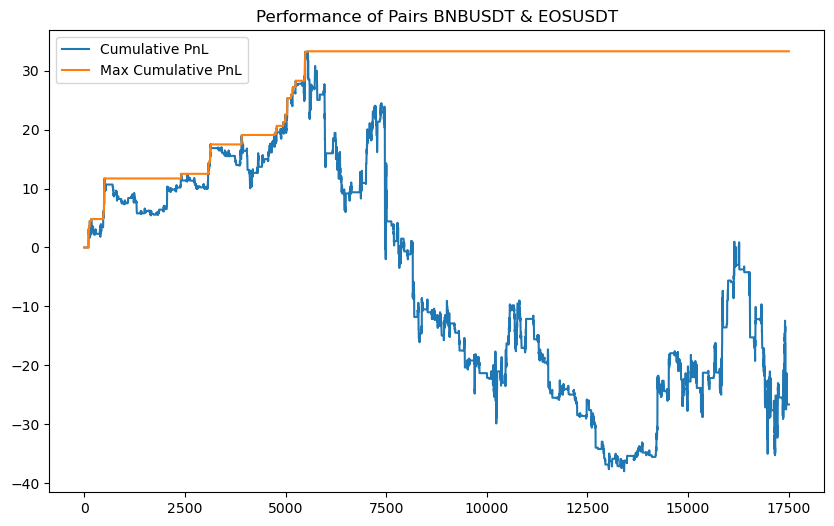

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2022-2023,Strategy 2,-0.285774,-919.258941,-2660.804733,-7121.122059,-559 days +04:00:00


In [55]:
pairs1_train_2223_stoploss2_performance = \
   pnlPerformance(stoploss2_pairs1_train_2223['hourlypnl'].dropna(),
                  'BNBUSDT & EOSUSDT','Train','2022-2023','Strategy 2')

pairs1_train_2223_stoploss2_performance

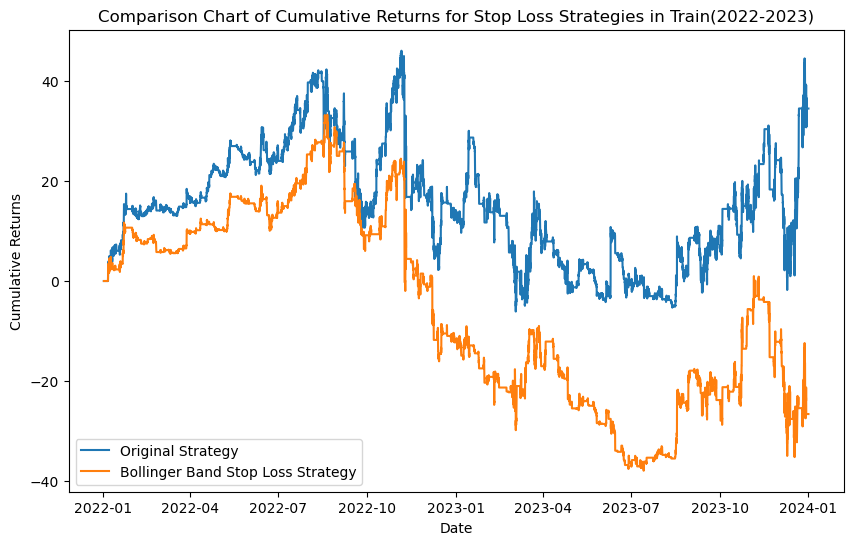

In [56]:
compare_stop_loss_strategies(pairs1_train_2223, stoploss2_pairs1_train_2223, 'cumpnl', 'Train(2022-2023)')

### Devide Train Data (Single Year) and test data

In [57]:
pairs1_train_21 = pairs_1.loc['2020-01-01':'2021-12-31']
pairs1_train_22 = pairs_1.loc['2021-01-01':'2022-12-31']
pairs1_train_23 = pairs_1.loc['2022-01-01':'2023-12-31']

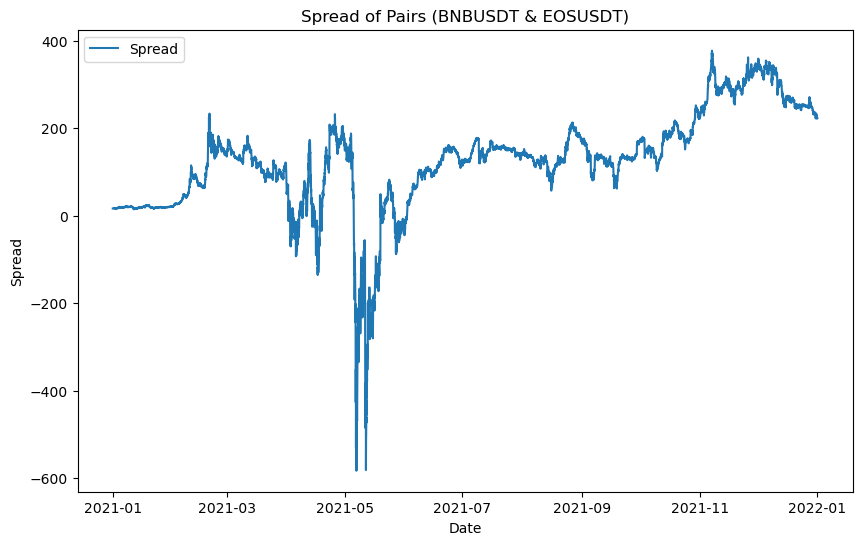

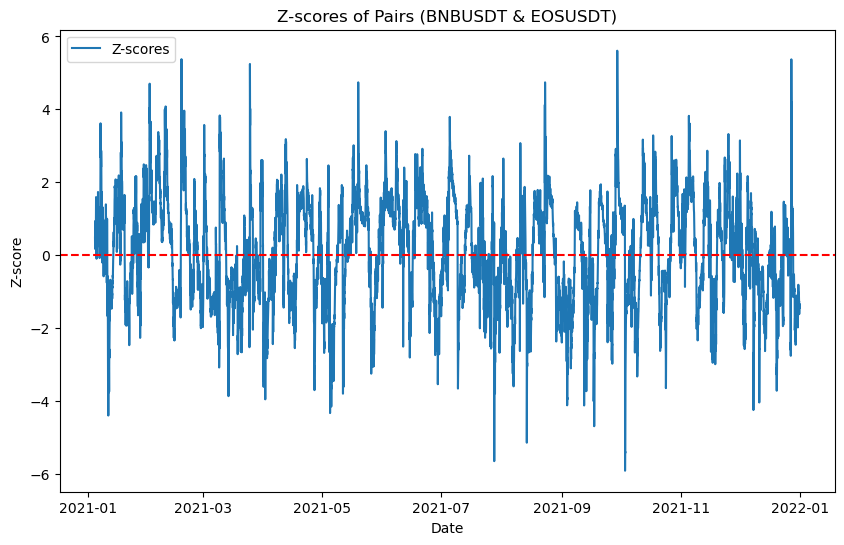

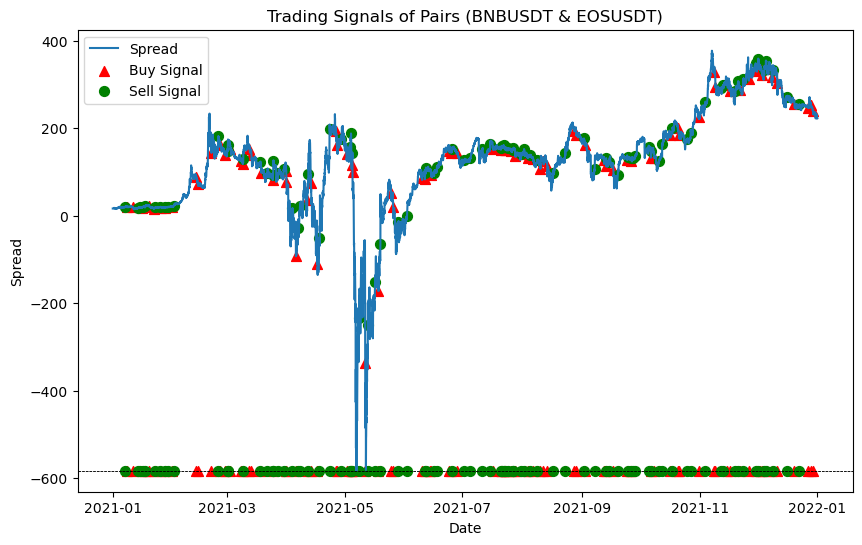

Assets,BNBUSDT,EOSUSDT,beta,intercept,spread,Spread_MA,Spread_Std,zscors,signal,position,return_Y,return_X,position_Y,position_X,hourlypnl,cumpnl,max_cumpnl
Date,,,,,,,,,,,,,,,,,
2020-12-31 17:00:00,37.1184,2.5664,1.576284,16.692384,16.380641,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-12-31 18:00:00,37.1045,2.5779,1.573882,16.702042,16.345148,NaN,NaN,NaN,NaN,0,-0.000375,0.004471,0.0,-0.000000,-0.000000,0.000000,0.000000
2020-12-31 19:00:00,37.1399,2.5797,1.571553,16.711484,16.374281,NaN,NaN,NaN,NaN,0,0.000954,0.000698,0.0,-0.000000,0.000000,0.000000,0.000000
2020-12-31 20:00:00,37.1855,2.5875,1.569278,16.720769,16.404224,NaN,NaN,NaN,NaN,0,0.001227,0.003019,0.0,-0.000000,0.000000,0.000000,0.000000
2020-12-31 21:00:00,37.0441,2.5865,1.566981,16.730103,16.261000,NaN,NaN,NaN,NaN,0,-0.003810,-0.000387,0.0,-0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-31 19:00:00,507.4000,2.9820,54.801106,121.949981,222.033122,239.519927,10.789402,-1.620739,NaN,1,-0.015061,-0.021891,1.0,-54.839237,1.185447,17.625178,54.419484
2021-12-31 20:00:00,507.8000,2.9820,54.763175,122.177788,222.318426,239.114317,10.741635,-1.563625,NaN,1,0.000788,0.000000,1.0,-54.801106,0.000788,17.625967,54.419484
2021-12-31 21:00:00,512.6000,3.0260,54.725407,122.405033,224.595886,238.731505,10.636627,-1.328957,NaN,1,0.009408,0.014647,1.0,-54.763175,-0.792730,16.833237,54.419484


In [58]:
pairs1_train_21 = \
   pairs_trading_strategy(pairs1_train_21,'BNBUSDT','EOSUSDT',
                          z_signal_in, z_signal_out, min_spread, MA_window, OLS_window
                         )
pairs1_train_21

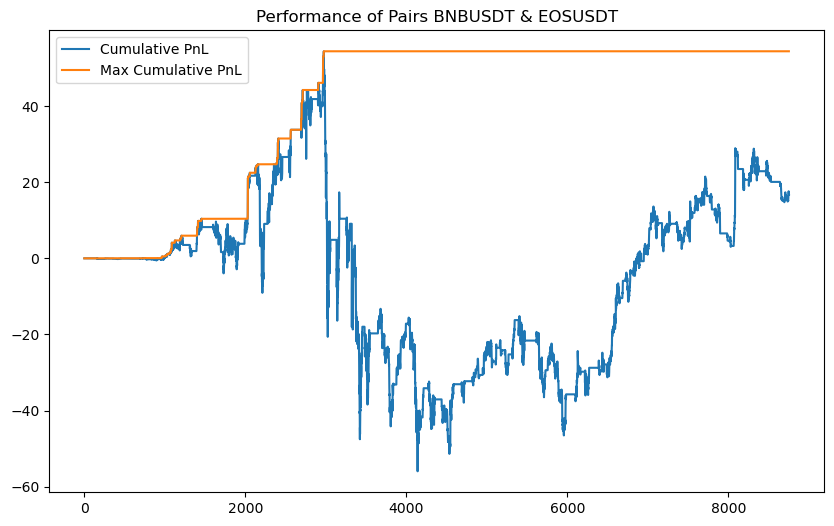

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2021,No,0.146008,1152.968035,1668.639089,-11038.562436,-173 days +05:00:00


In [59]:
pairs1_train_21_performance = \
   pnlPerformance(pairs1_train_21['hourlypnl'].dropna(),
                  'BNBUSDT & EOSUSDT','Train','2021','No')
pairs1_train_21_performance

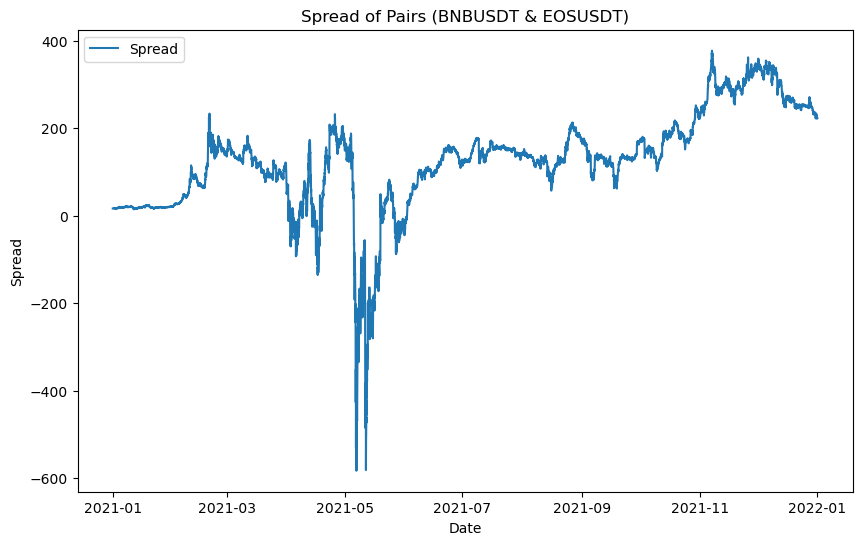

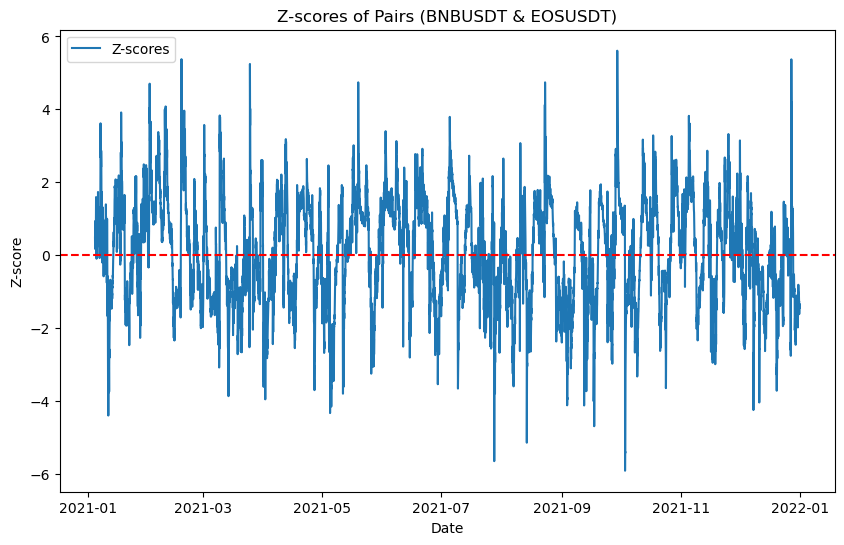

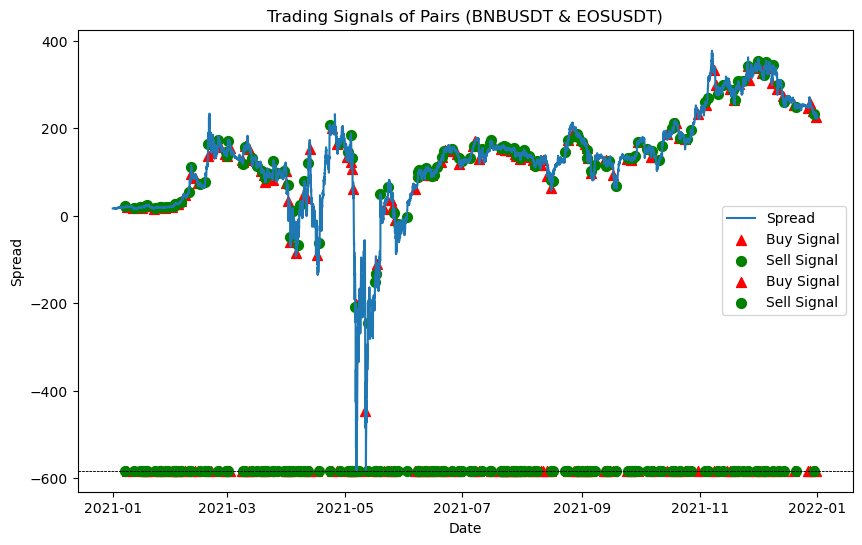

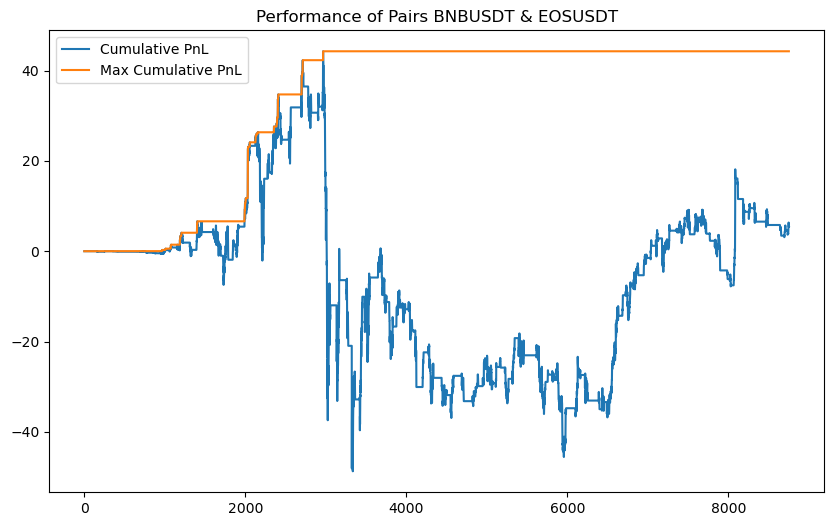

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2021,Strategy1,0.052639,373.678961,540.808853,-9300.335334,-140 days +18:00:00


In [60]:
stoploss1_pairs1_train_21 = stop_loss_strategy1(pairs1_train_21, 'BNBUSDT','EOSUSDT','BNBUSDT','EOSUSDT',num_consecutive_losses=4)
pairs1_train_21_stoploss1_performance = \
   pnlPerformance(stoploss1_pairs1_train_21['hourlypnl'].dropna(),
                  'BNBUSDT & EOSUSDT','Train','2021','Strategy1')
pairs1_train_21_stoploss1_performance

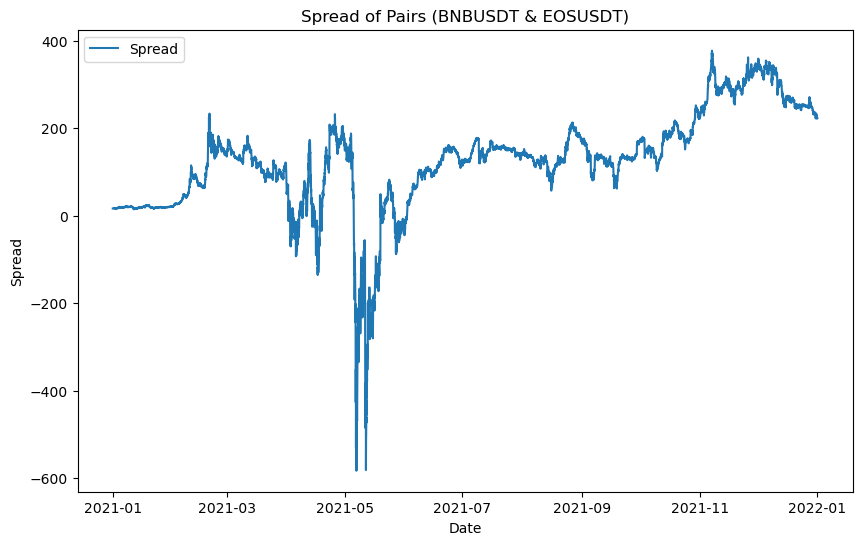

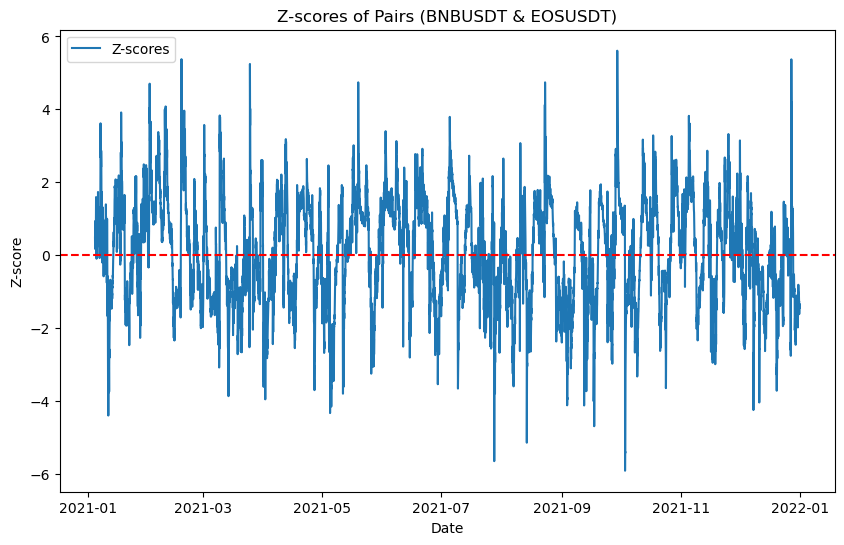

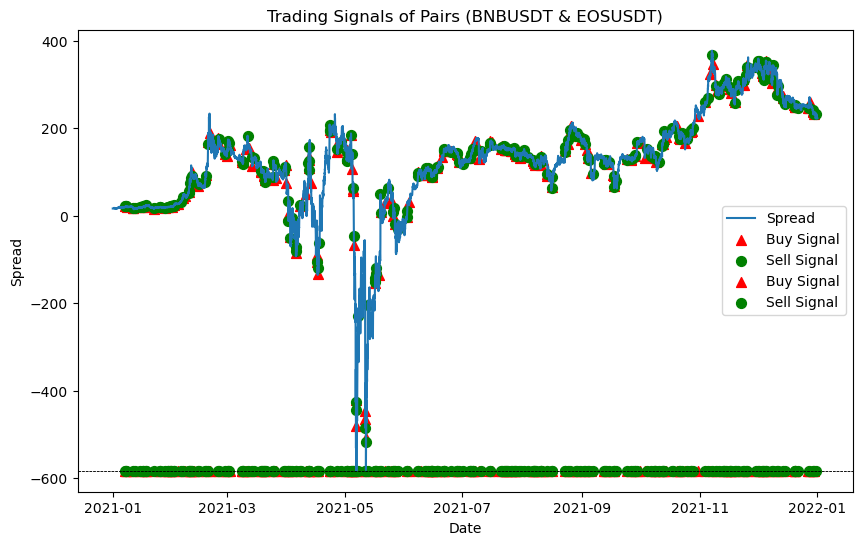

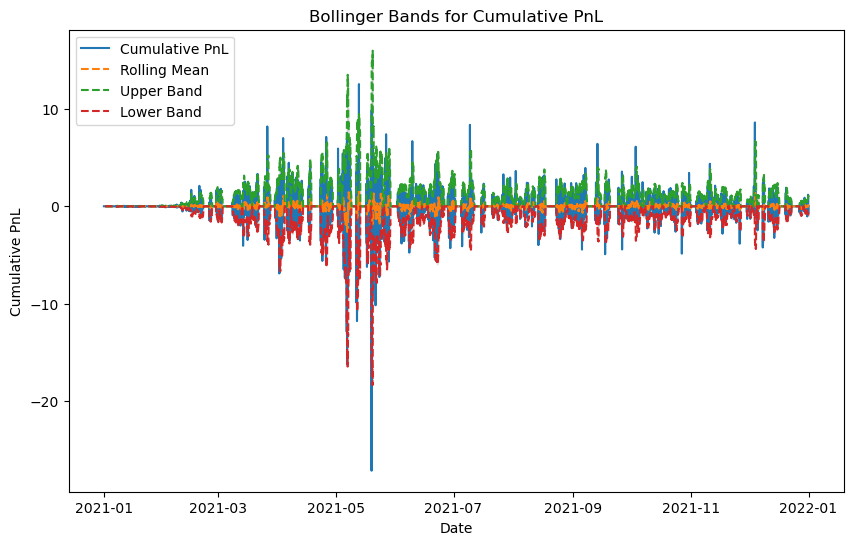

Assets,BNBUSDT,EOSUSDT,beta,intercept,spread,Spread_MA,Spread_Std,zscors,signal,position,return_Y,return_X,position_Y,position_X,hourlypnl,cumpnl,max_cumpnl,stop_loss_signal
Date,,,,,,,,,,,,,,,,,,
2020-12-31 17:00:00,37.1184,2.5664,1.576284,16.692384,16.380641,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-12-31 18:00:00,37.1045,2.5779,1.573882,16.702042,16.345148,NaN,NaN,NaN,NaN,0.0,-0.000375,0.004471,0.0,-0.0,-0.0,0.000000,0.000000,NaN
2020-12-31 19:00:00,37.1399,2.5797,1.571553,16.711484,16.374281,NaN,NaN,NaN,NaN,0.0,0.000954,0.000698,0.0,-0.0,0.0,0.000000,0.000000,NaN
2020-12-31 20:00:00,37.1855,2.5875,1.569278,16.720769,16.404224,NaN,NaN,NaN,NaN,0.0,0.001227,0.003019,0.0,-0.0,0.0,0.000000,0.000000,NaN
2020-12-31 21:00:00,37.0441,2.5865,1.566981,16.730103,16.261000,NaN,NaN,NaN,NaN,0.0,-0.003810,-0.000387,0.0,-0.0,0.0,0.000000,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-31 19:00:00,507.4000,2.9820,54.801106,121.949981,222.033122,239.519927,10.789402,-1.620739,0.0,0.0,-0.015061,-0.021891,0.0,-0.0,0.0,-6.655685,35.026676,0.0
2021-12-31 20:00:00,507.8000,2.9820,54.763175,122.177788,222.318426,239.114317,10.741635,-1.563625,NaN,0.0,0.000788,0.000000,0.0,-0.0,0.0,-6.655685,35.026676,NaN
2021-12-31 21:00:00,512.6000,3.0260,54.725407,122.405033,224.595886,238.731505,10.636627,-1.328957,NaN,0.0,0.009408,0.014647,0.0,-0.0,0.0,-6.655685,35.026676,NaN


In [61]:
stoploss2_pairs1_train_21 = \
   bollinger_band_stop_loss(pairs1_train_21, 'hourlypnl','BNBUSDT','EOSUSDT',boll_window,std_multiplier)
stoploss2_pairs1_train_21

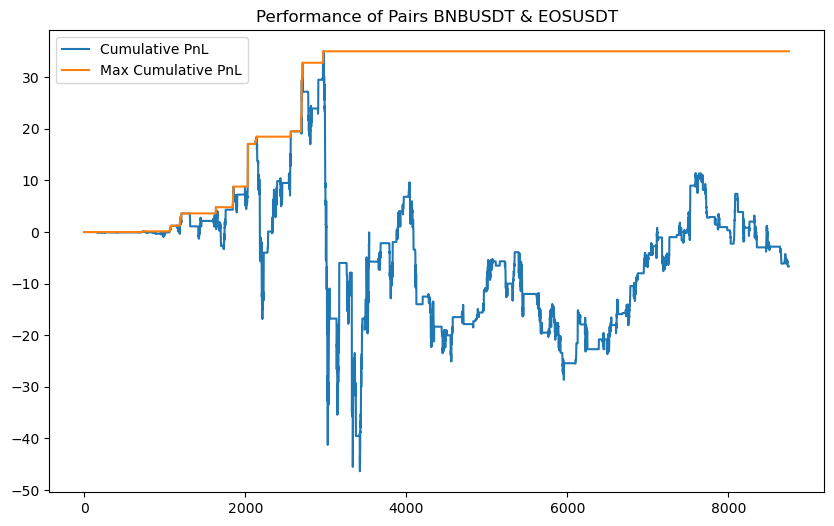

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2021,Strategy2,-0.070757,-459.883276,-665.568505,-8138.166929,-143 days +02:00:00


In [62]:
pairs1_train_21_stoploss2_performance = \
   pnlPerformance(stoploss2_pairs1_train_21['hourlypnl'].dropna(),
                  'BNBUSDT & EOSUSDT','Train','2021','Strategy2')
pairs1_train_21_stoploss2_performance

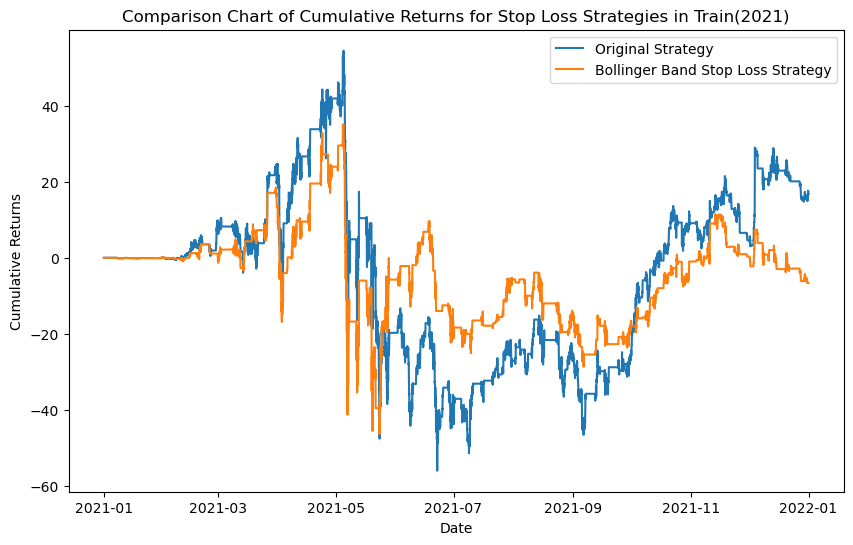

In [63]:
compare_stop_loss_strategies(pairs1_train_21, stoploss2_pairs1_train_21, 'cumpnl', 'Train(2021)')

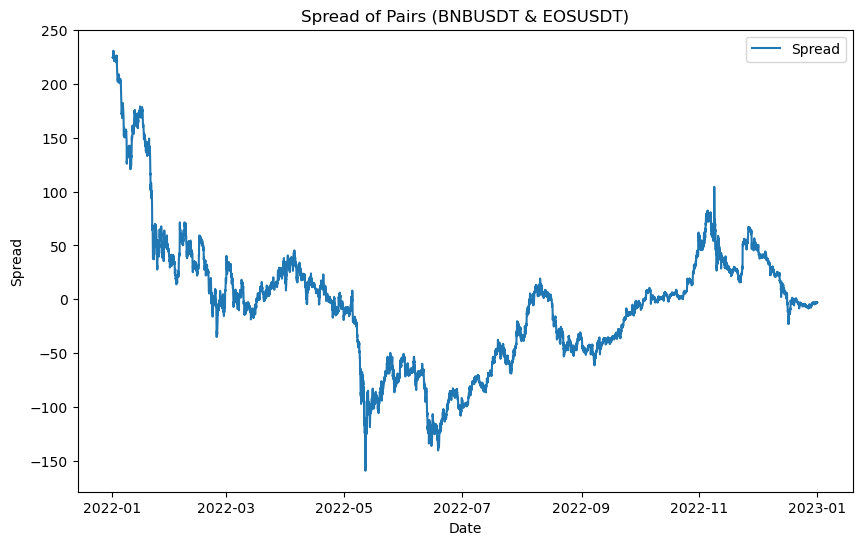

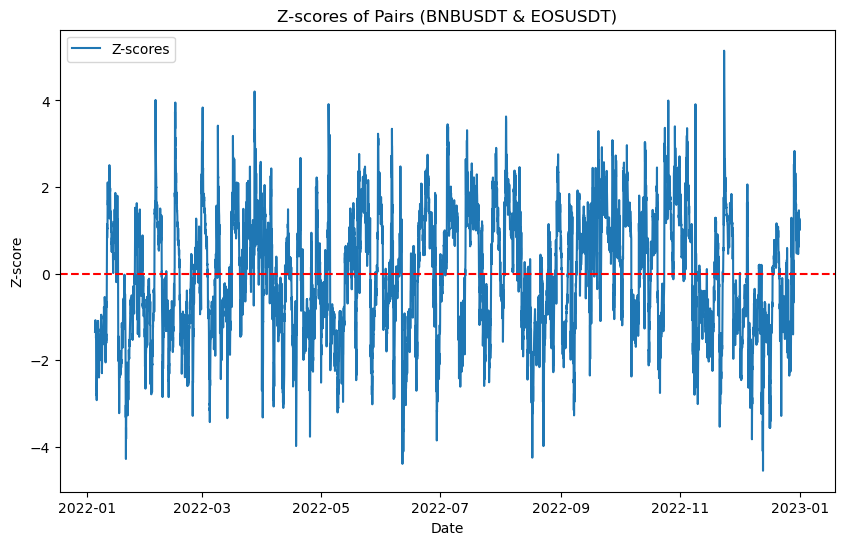

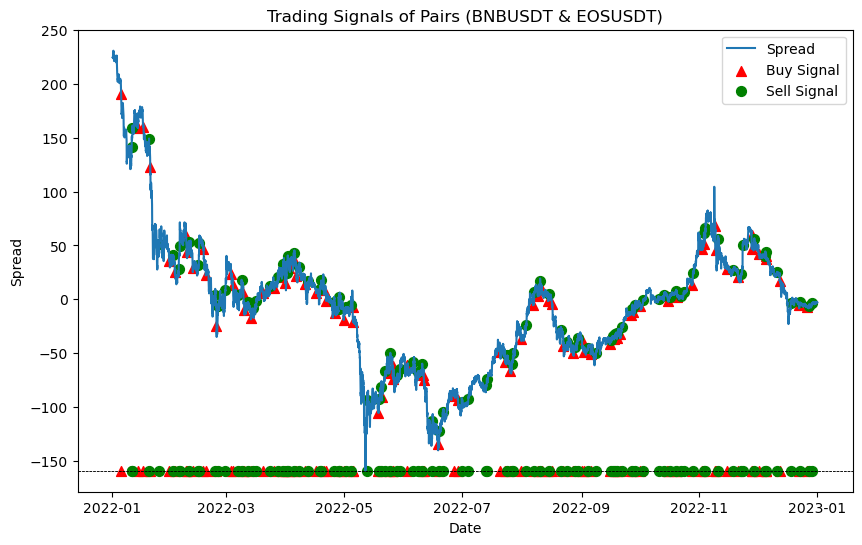

Assets,BNBUSDT,EOSUSDT,beta,intercept,spread,Spread_MA,Spread_Std,zscors,signal,position,return_Y,return_X,position_Y,position_X,hourlypnl,cumpnl,max_cumpnl
Date,,,,,,,,,,,,,,,,,
2022-01-01 12:00:00,516.9,3.069,54.161687,125.801790,224.875992,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-01-01 13:00:00,517.1,3.065,54.124022,126.028928,225.180945,NaN,NaN,NaN,NaN,0,0.000387,-0.001304,0.0,-0.000000,0.000000,0.000000,0.000000
2022-01-01 14:00:00,516.3,3.067,54.086617,126.254907,224.161438,NaN,NaN,NaN,NaN,0,-0.001548,0.000652,0.0,-0.000000,-0.000000,0.000000,0.000000
2022-01-01 15:00:00,518.7,3.077,54.049200,126.481113,225.909497,NaN,NaN,NaN,NaN,0,0.004638,0.003255,0.0,-0.000000,0.000000,0.000000,0.000000
2022-01-01 16:00:00,521.2,3.077,54.011618,126.708411,228.297841,NaN,NaN,NaN,NaN,0,0.004808,0.000000,0.0,-0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31 19:00:00,246.9,0.867,103.016416,160.199413,-2.614646,-4.245862,1.379074,1.182834,NaN,-1,0.001216,0.003466,-1.0,103.030426,0.355909,13.931357,46.062432
2022-12-31 20:00:00,246.9,0.869,103.002284,160.217080,-2.826065,-4.220457,1.383981,1.007523,NaN,-1,0.000000,0.002304,-1.0,103.016416,0.237365,14.168722,46.062432
2022-12-31 21:00:00,247.0,0.866,102.987491,160.235813,-2.422980,-4.180680,1.383622,1.270362,NaN,-1,0.000405,-0.003458,-1.0,103.002284,-0.356609,13.812113,46.062432


In [64]:
pairs1_train_22 = \
   pairs_trading_strategy(pairs1_train_22,'BNBUSDT','EOSUSDT',
                          z_signal_in, z_signal_out, min_spread, MA_window, OLS_window
                         )
pairs1_train_22

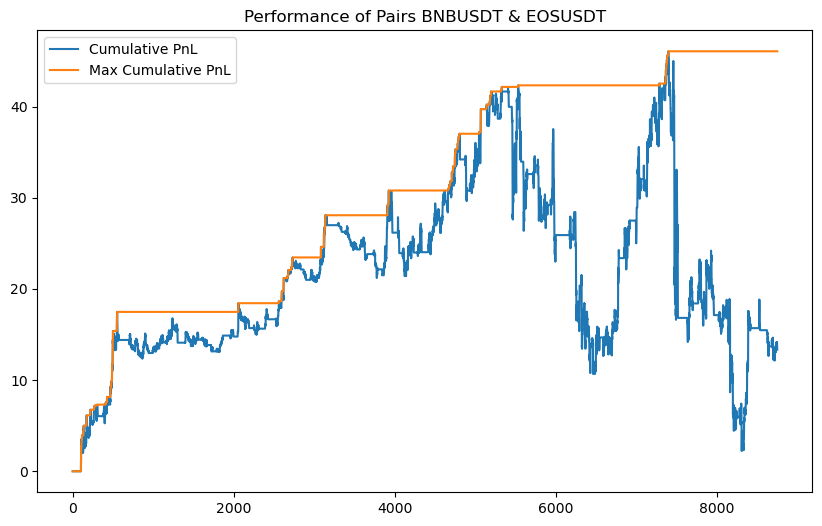

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2022,No,0.261482,922.249543,1333.815601,-4383.895213,-347 days +23:00:00


In [65]:
pairs1_train_22_performance = \
   pnlPerformance(pairs1_train_22['hourlypnl'].dropna(),'BNBUSDT & EOSUSDT','Train','2022','No')
pairs1_train_22_performance

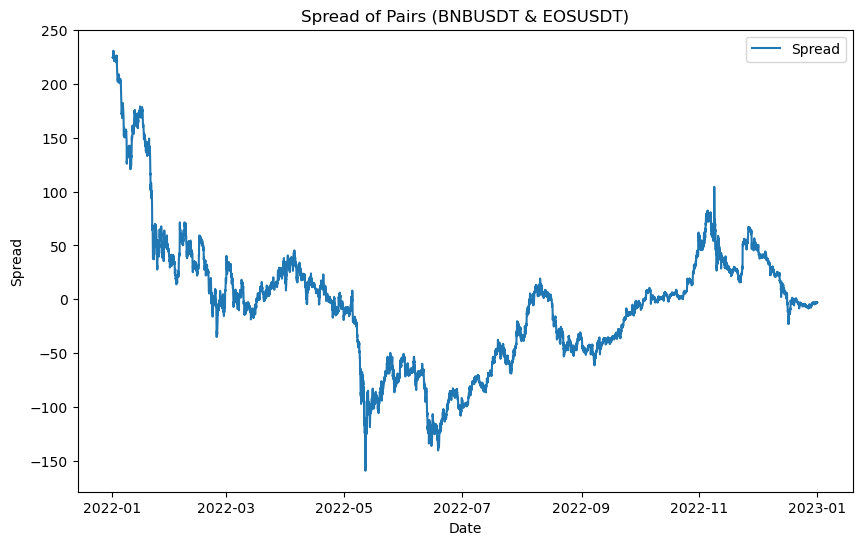

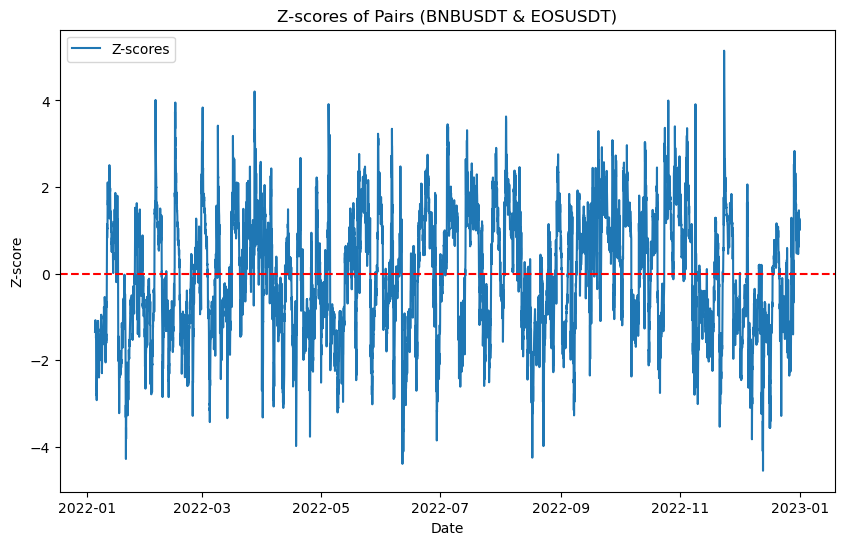

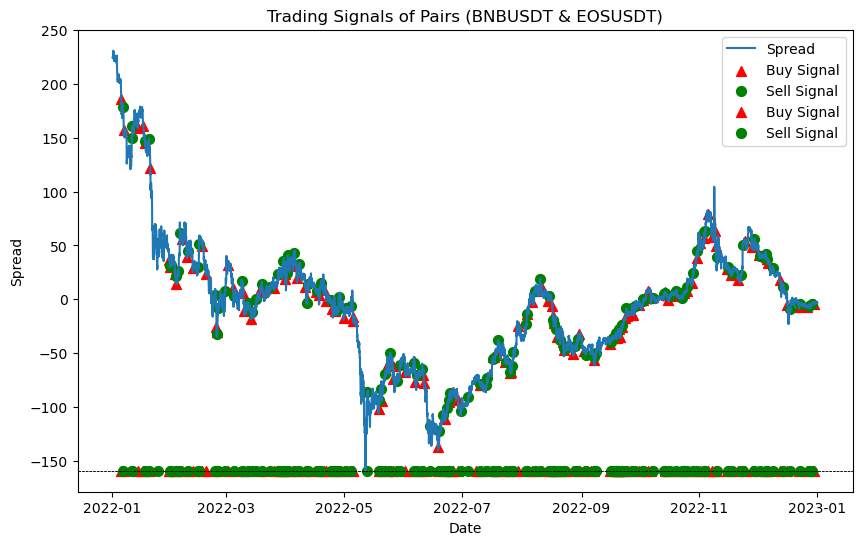

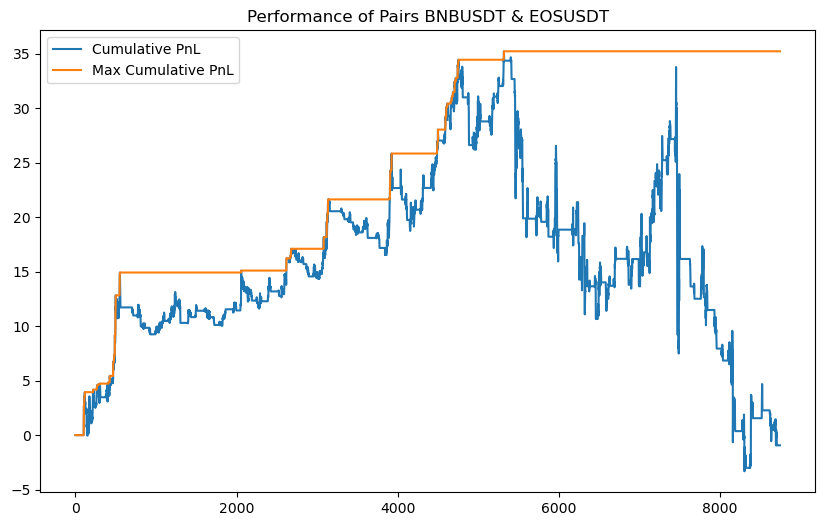

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2022,Strategy1,-0.021943,-64.610892,-93.444358,-3853.110389,-347 days +23:00:00


In [66]:
stoploss1_pairs1_train_22 = stop_loss_strategy1(pairs1_train_22, 'BNBUSDT','EOSUSDT','BNBUSDT','EOSUSDT',num_consecutive_losses=4)
pairs1_train_22_stoploss1_performance = \
   pnlPerformance(stoploss1_pairs1_train_22['hourlypnl'].dropna(),
                  'BNBUSDT & EOSUSDT','Train','2022','Strategy1')
pairs1_train_22_stoploss1_performance

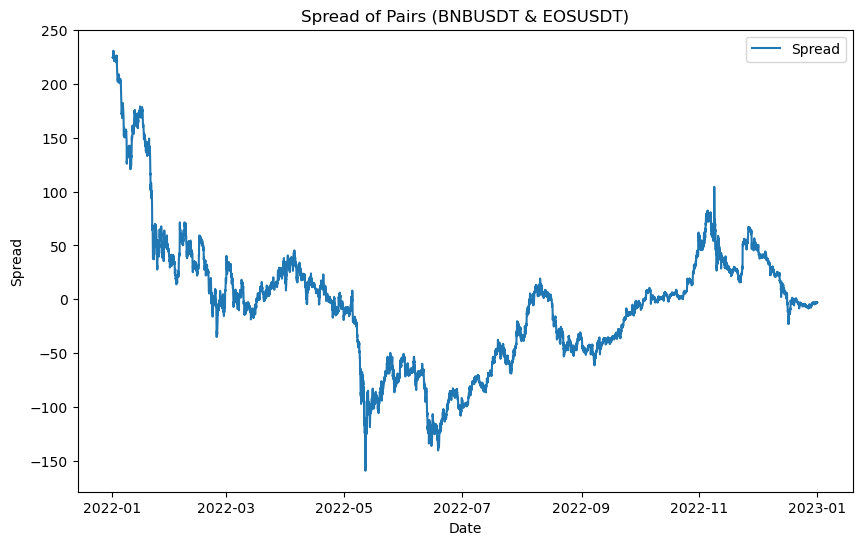

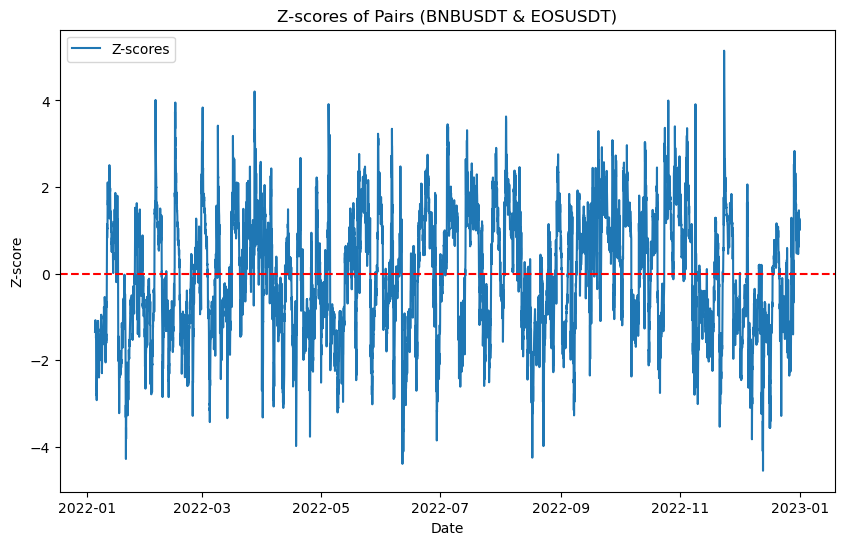

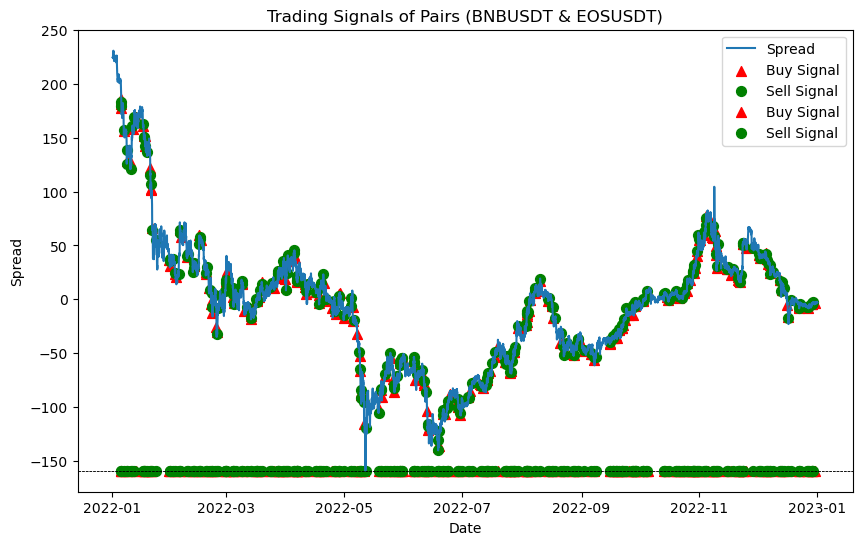

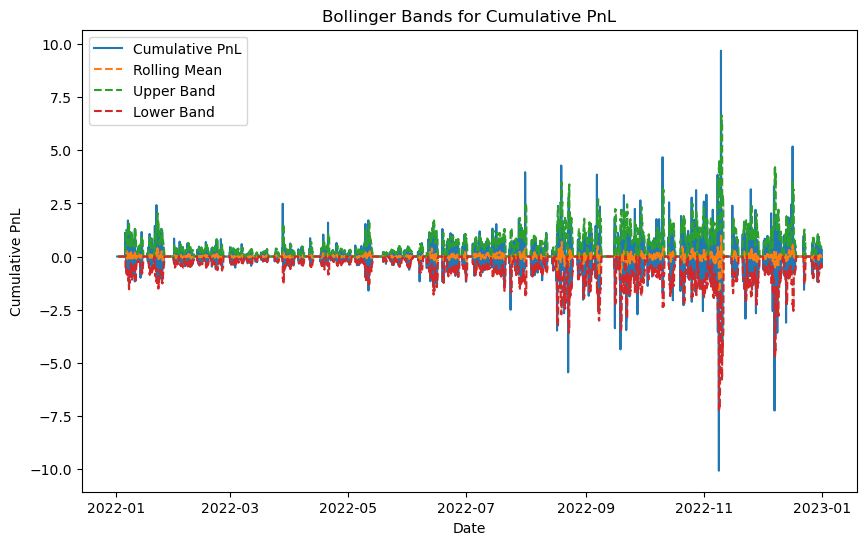

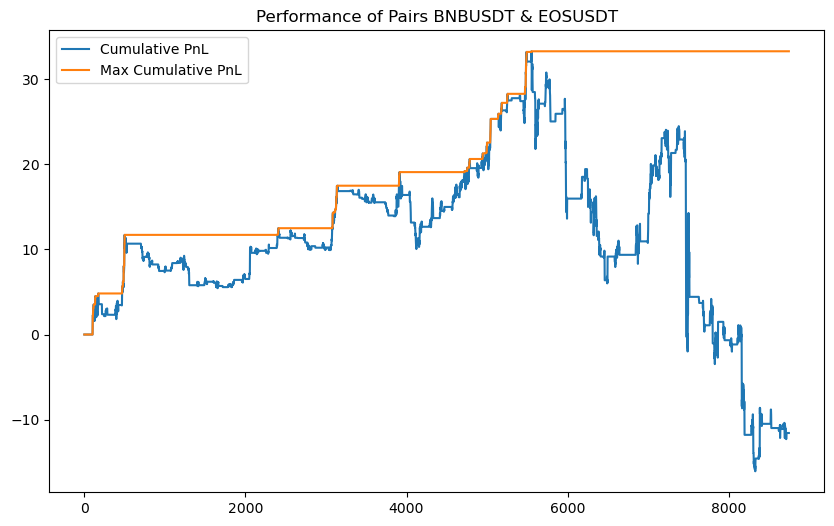

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2022,Strategy2,-0.295034,-799.655542,-1156.512405,-4932.860699,-348 days +23:00:00


In [67]:
stoploss2_pairs1_train_22 = \
   bollinger_band_stop_loss(pairs1_train_22, 'hourlypnl','BNBUSDT','EOSUSDT',boll_window,std_multiplier)
pairs1_train_22_stoploss2_performance = \
   pnlPerformance(stoploss2_pairs1_train_22['hourlypnl'].dropna(),
                  'BNBUSDT & EOSUSDT','Train','2022','Strategy2')
pairs1_train_22_stoploss2_performance

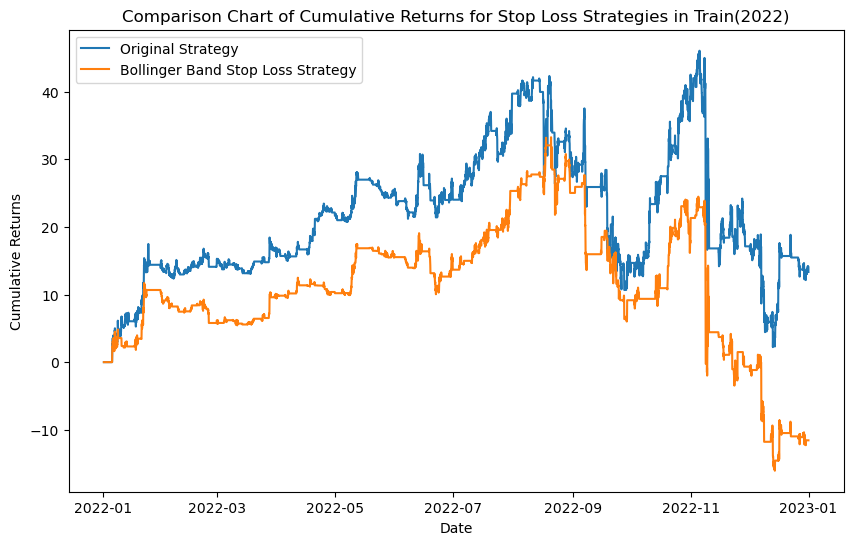

In [68]:
compare_stop_loss_strategies(pairs1_train_22, stoploss2_pairs1_train_22, 'cumpnl', 'Train(2022)')

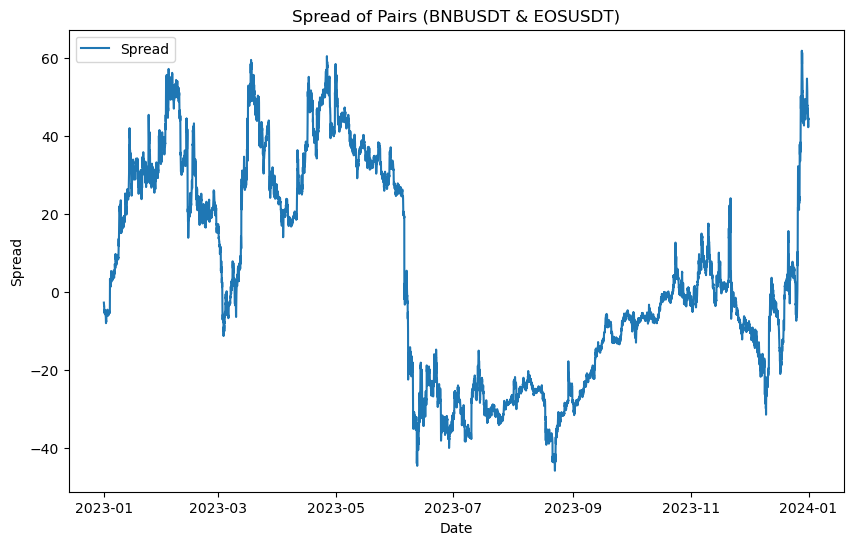

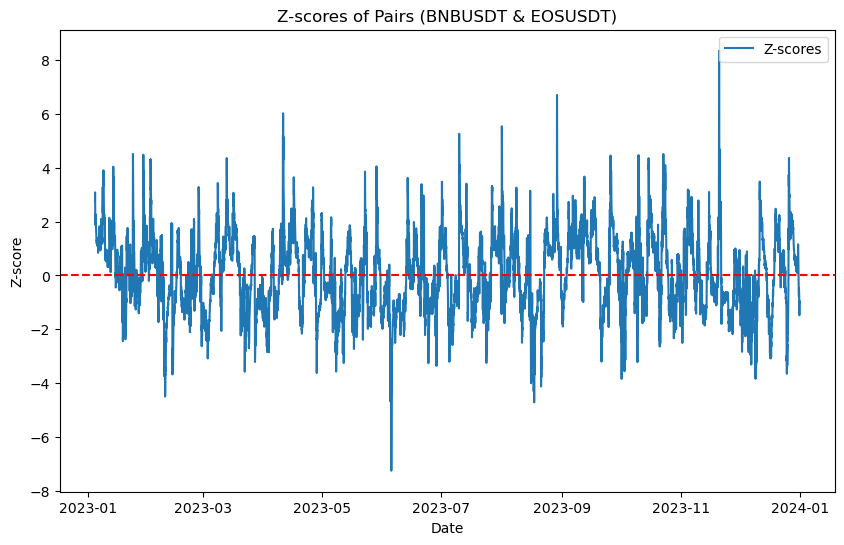

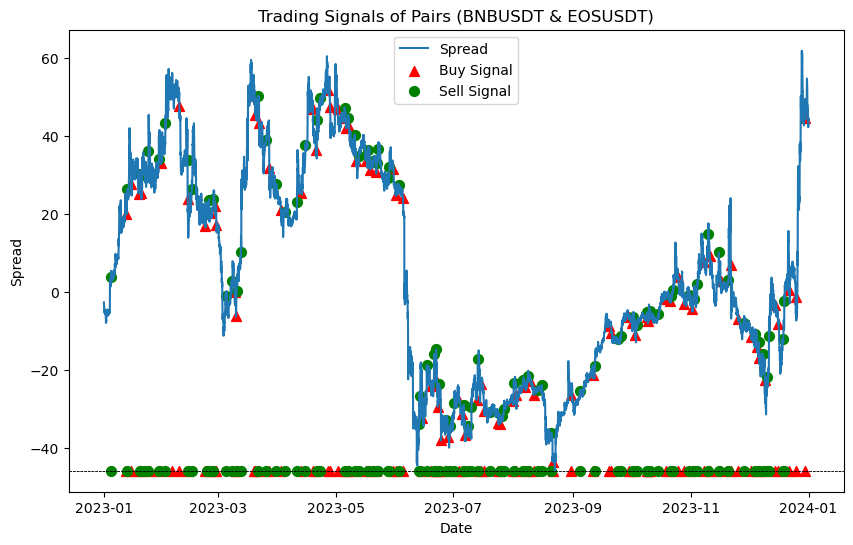

Assets,BNBUSDT,EOSUSDT,beta,intercept,spread,Spread_MA,Spread_Std,zscors,signal,position,return_Y,return_X,position_Y,position_X,hourlypnl,cumpnl,max_cumpnl
Date,,,,,,,,,,,,,,,,,
2022-12-31 23:00:00,246.3,0.862,102.959317,160.271396,-2.722327,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-01 00:00:00,245.7,0.861,102.944207,160.290552,-3.225514,NaN,NaN,NaN,NaN,0,-0.002439,-0.001161,0.0,-0.0,0.0,0.000000,0.000000
2023-01-01 01:00:00,245.8,0.861,102.928922,160.309931,-3.131733,NaN,NaN,NaN,NaN,0,0.000407,0.000000,0.0,-0.0,0.0,0.000000,0.000000
2023-01-01 02:00:00,245.3,0.861,102.913716,160.329146,-3.637855,NaN,NaN,NaN,NaN,0,-0.002036,0.000000,0.0,-0.0,-0.0,0.000000,0.000000
2023-01-01 03:00:00,245.3,0.861,102.898345,160.348571,-3.644046,NaN,NaN,NaN,NaN,0,0.000000,0.000000,0.0,-0.0,0.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 19:00:00,316.2,0.861,178.208681,116.810969,45.951357,49.150858,4.468922,-0.715945,NaN,0,-0.000948,-0.001161,0.0,-0.0,0.0,21.549296,31.581468
2023-12-31 20:00:00,312.3,0.853,178.211745,116.816147,43.469235,49.111121,4.503618,-1.252745,NaN,0,-0.012411,-0.009335,0.0,-0.0,0.0,21.549296,31.581468
2023-12-31 21:00:00,312.9,0.863,178.215963,116.820260,42.279364,49.031973,4.560669,-1.480618,NaN,0,0.001919,0.011655,0.0,-0.0,0.0,21.549296,31.581468


In [69]:
pairs1_train_23 = \
   pairs_trading_strategy(pairs1_train_23,'BNBUSDT','EOSUSDT',
                          z_signal_in, z_signal_out, min_spread, MA_window, OLS_window
                         )
pairs1_train_23

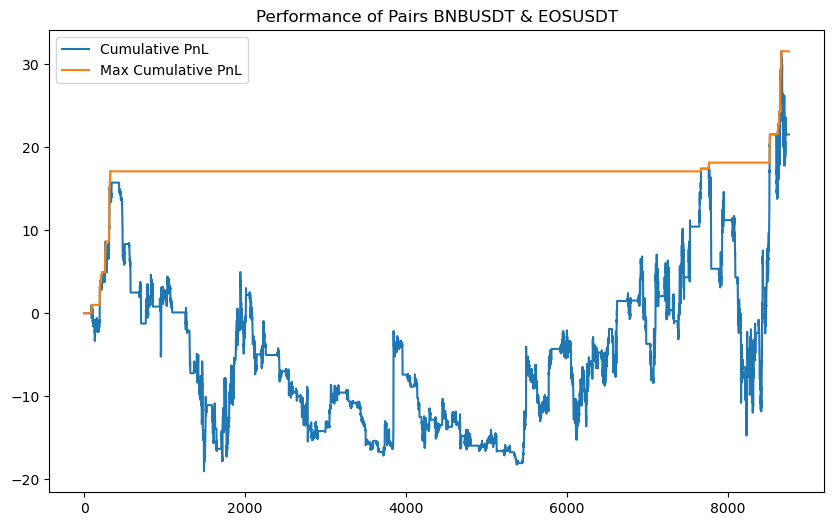

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2023,No,0.318635,1487.956901,2154.929646,-3615.984121,-62 days +01:00:00


In [70]:
pairs1_train_23_performance = \
   pnlPerformance(pairs1_train_23['hourlypnl'].dropna(),'BNBUSDT & EOSUSDT','Train','2023','No')
pairs1_train_23_performance

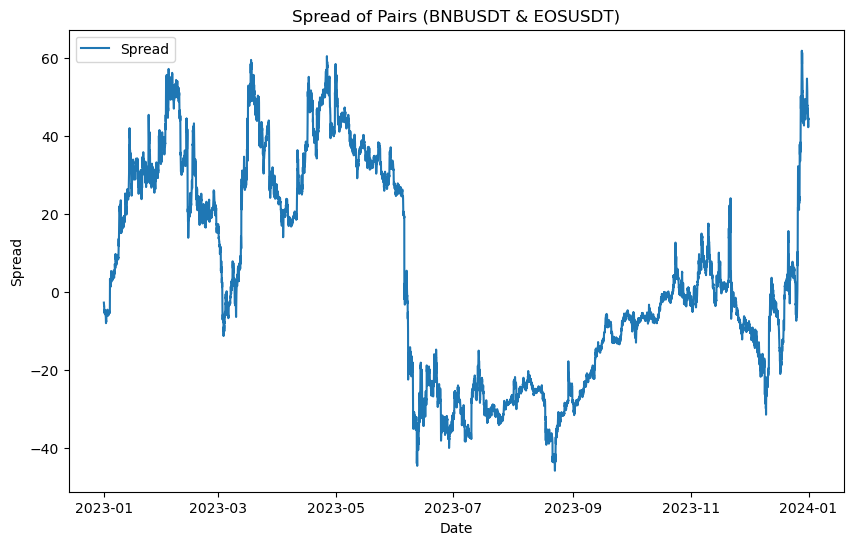

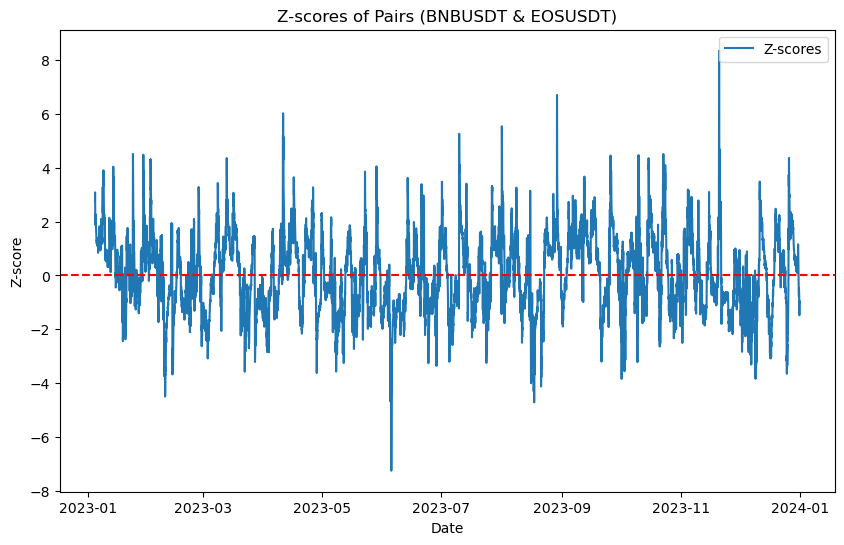

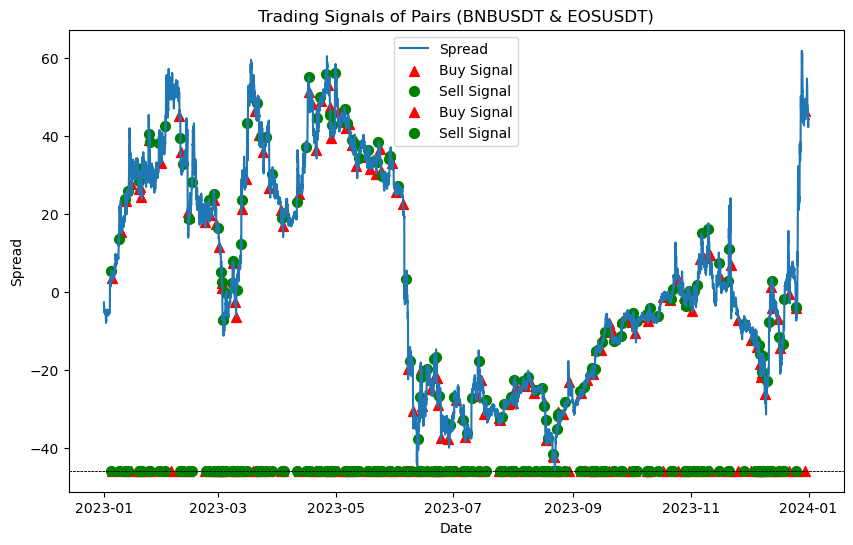

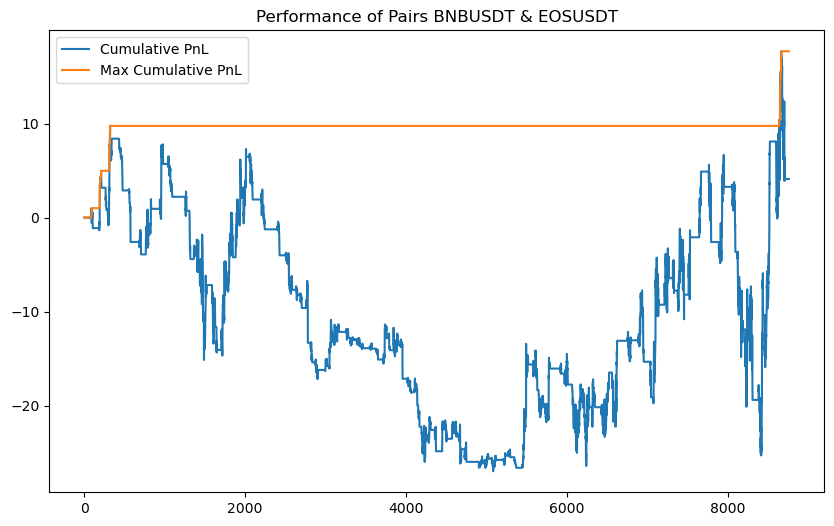

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2023,Strategy1,0.067376,283.573069,410.683947,-3674.439571,-212 days +05:00:00


In [71]:
stoploss1_pairs1_train_23 = stop_loss_strategy1(pairs1_train_23, 'BNBUSDT','EOSUSDT','BNBUSDT','EOSUSDT',num_consecutive_losses=4)
pairs1_train_23_stoploss1_performance = \
   pnlPerformance(stoploss1_pairs1_train_23['hourlypnl'].dropna(),
                  'BNBUSDT & EOSUSDT','Train','2023','Strategy1')
pairs1_train_23_stoploss1_performance

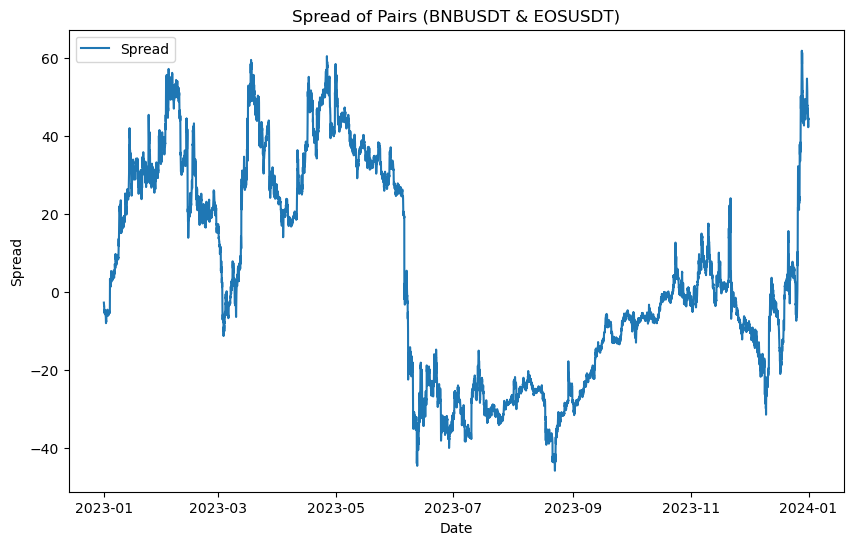

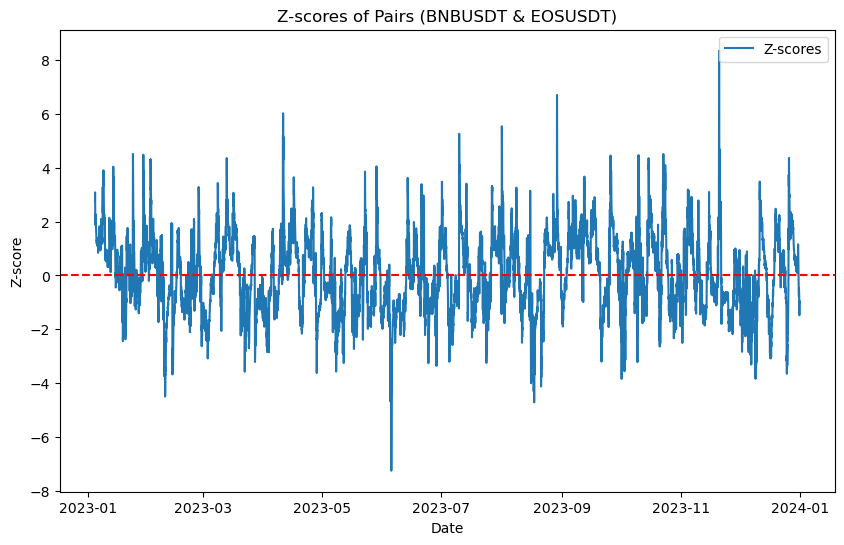

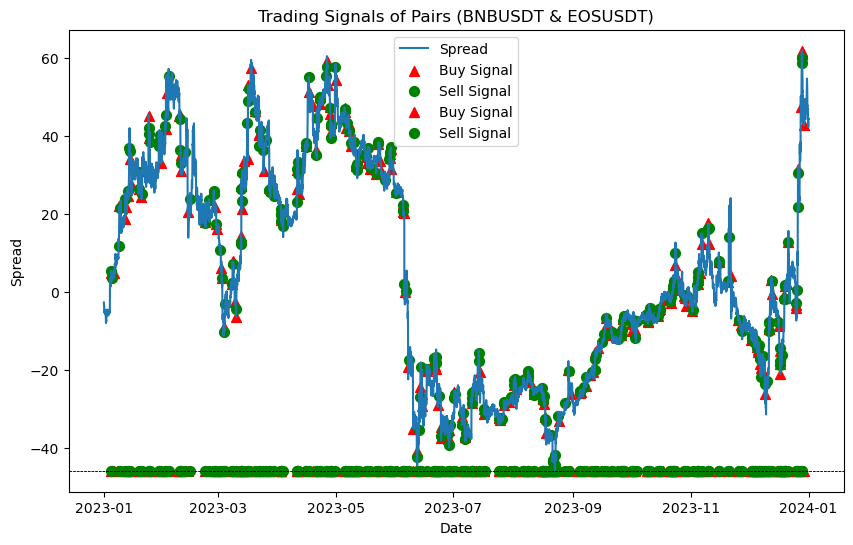

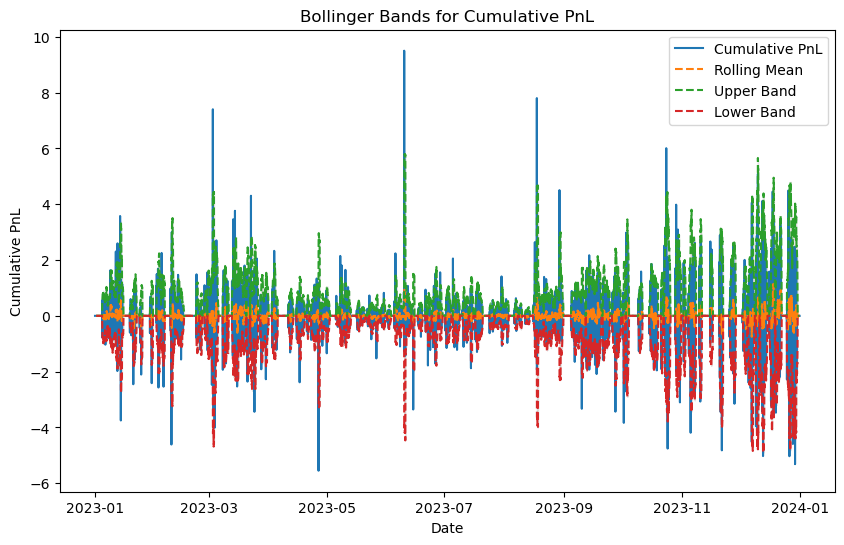

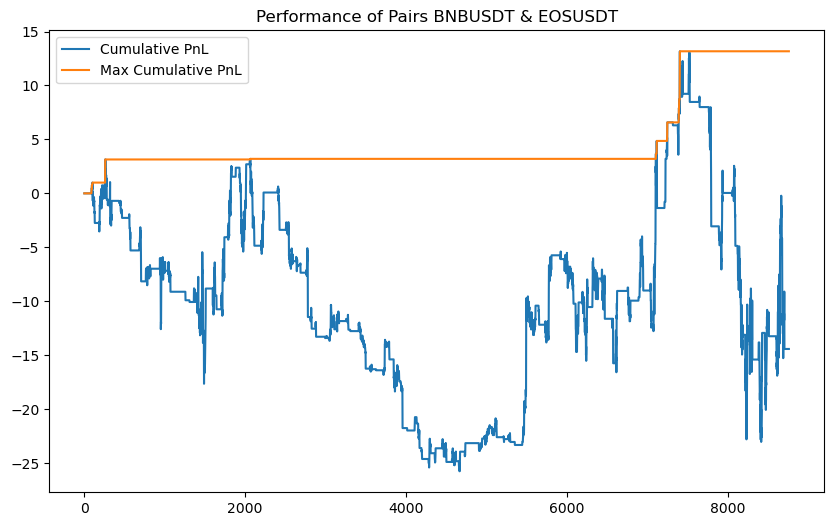

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2023,Strategy2,-0.272991,-995.762666,-1442.110647,-3620.09566,-351 days +09:00:00


In [72]:
stoploss2_pairs1_train_23 = \
   bollinger_band_stop_loss(pairs1_train_23, 'hourlypnl','BNBUSDT','EOSUSDT',boll_window,std_multiplier)
pairs1_train_23_stoploss2_performance = \
   pnlPerformance(stoploss2_pairs1_train_23['hourlypnl'].dropna(),
                  'BNBUSDT & EOSUSDT','Train','2023','Strategy2')
pairs1_train_23_stoploss2_performance

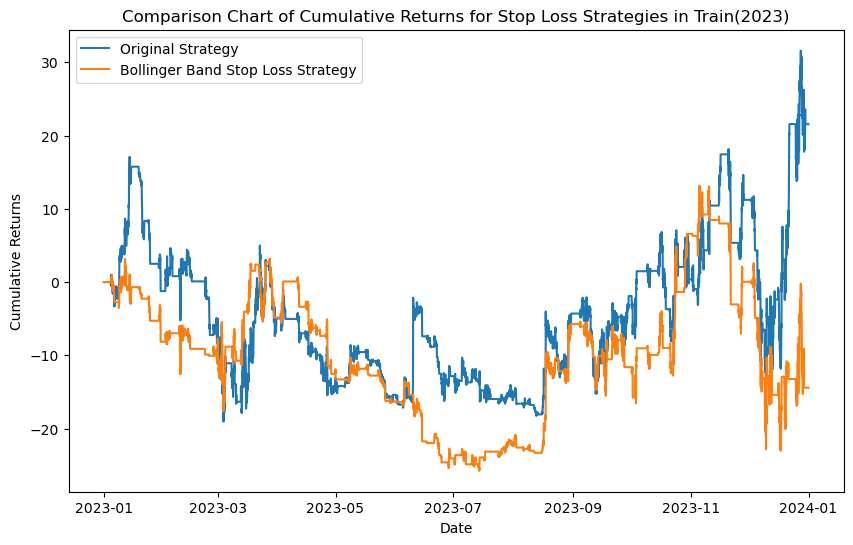

In [73]:
compare_stop_loss_strategies(pairs1_train_23, stoploss2_pairs1_train_23, 'cumpnl', 'Train(2023)')

In [74]:
pairs1_test = pairs_1.loc['2023-01-01':]
pairs1_test

Assets,BNBUSDT,EOSUSDT
Date,,
2023-01-01 00:00:00,245.7,0.8610
2023-01-01 01:00:00,245.8,0.8610
2023-01-01 02:00:00,245.3,0.8610
2023-01-01 03:00:00,245.3,0.8610
2023-01-01 04:00:00,243.8,0.8580
...,...,...
2024-05-30 20:00:00,594.0,0.8130
2024-05-30 21:00:00,595.3,0.8112
2024-05-30 22:00:00,595.0,0.8118


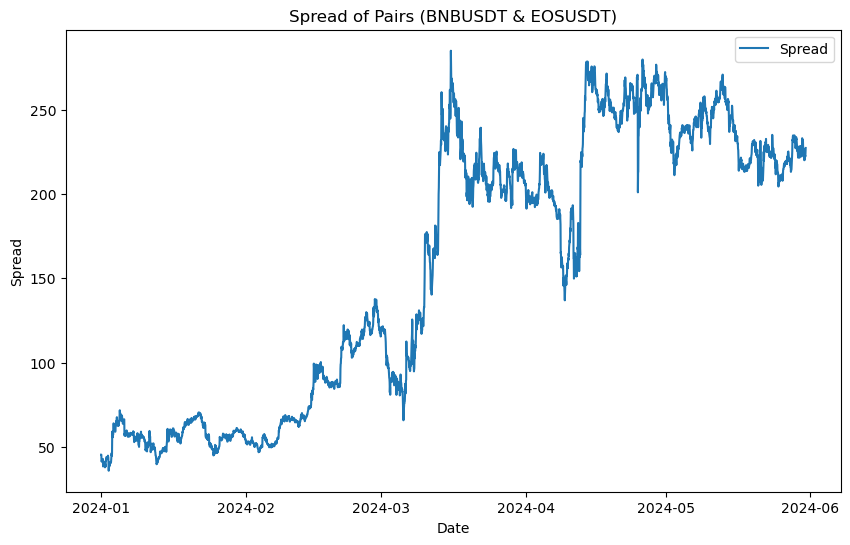

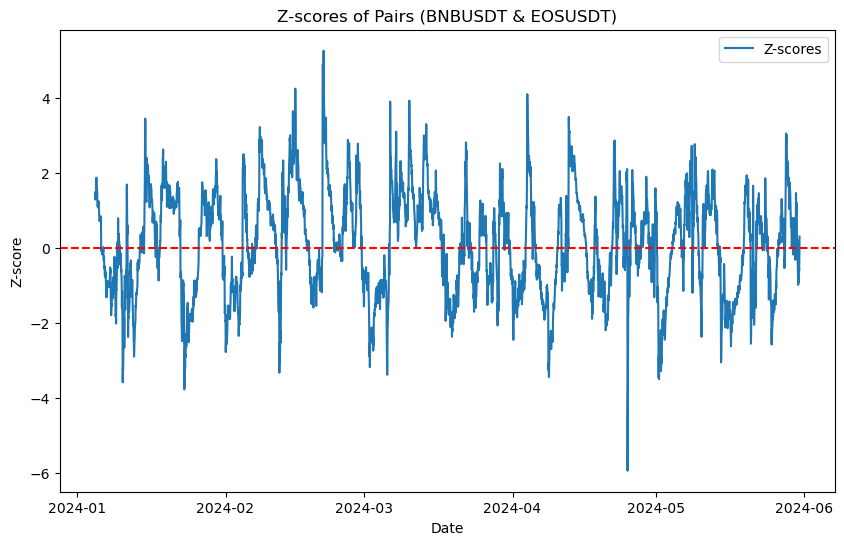

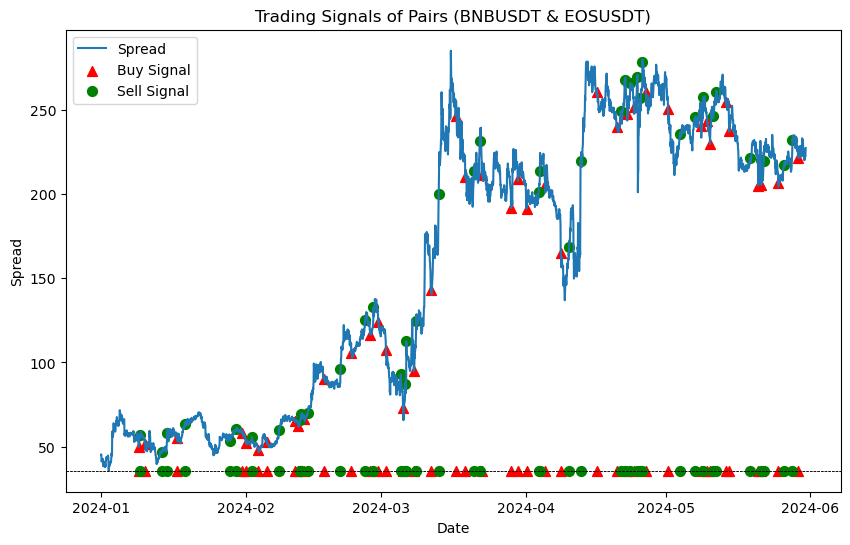

Assets,BNBUSDT,EOSUSDT,beta,intercept,spread,Spread_MA,Spread_Std,zscors,signal,position,return_Y,return_X,position_Y,position_X,hourlypnl,cumpnl,max_cumpnl
Date,,,,,,,,,,,,,,,,,
2024-01-01 00:00:00,314.4,0.8540,178.222151,116.838676,45.359607,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-01-01 01:00:00,315.3,0.8590,178.225598,116.843767,45.360444,NaN,NaN,NaN,NaN,0,0.002859,0.005838,0.0,-0.0,0.0,0.000000,0.000000
2024-01-01 02:00:00,310.9,0.8560,178.228547,116.848824,41.487540,NaN,NaN,NaN,NaN,0,-0.014053,-0.003499,0.0,-0.0,0.0,0.000000,0.000000
2024-01-01 03:00:00,309.2,0.8480,178.230697,116.854578,41.205792,NaN,NaN,NaN,NaN,0,-0.005483,-0.009390,0.0,-0.0,0.0,0.000000,0.000000
2024-01-01 04:00:00,309.2,0.8430,178.232344,116.860855,42.089279,NaN,NaN,NaN,NaN,0,0.000000,-0.005914,0.0,-0.0,0.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-30 20:00:00,594.0,0.8130,696.421635,-192.671998,220.481209,225.566238,5.528408,-0.919800,NaN,0,-0.005038,-0.004173,0.0,-0.0,0.0,62.992245,91.605692
2024-05-30 21:00:00,595.3,0.8112,696.574223,-192.748081,222.987071,225.588662,5.513624,-0.471848,NaN,0,0.002186,-0.002216,0.0,-0.0,0.0,62.992245,91.605692
2024-05-30 22:00:00,595.0,0.8118,696.730380,-192.826766,222.221044,225.600218,5.505366,-0.613797,NaN,0,-0.000504,0.000739,0.0,-0.0,-0.0,62.992245,91.605692


In [75]:
pairs1_test = \
   pairs_trading_strategy(pairs1_test,'BNBUSDT','EOSUSDT',
                          z_signal_in, z_signal_out, min_spread, MA_window, OLS_window
                         )
pairs1_test

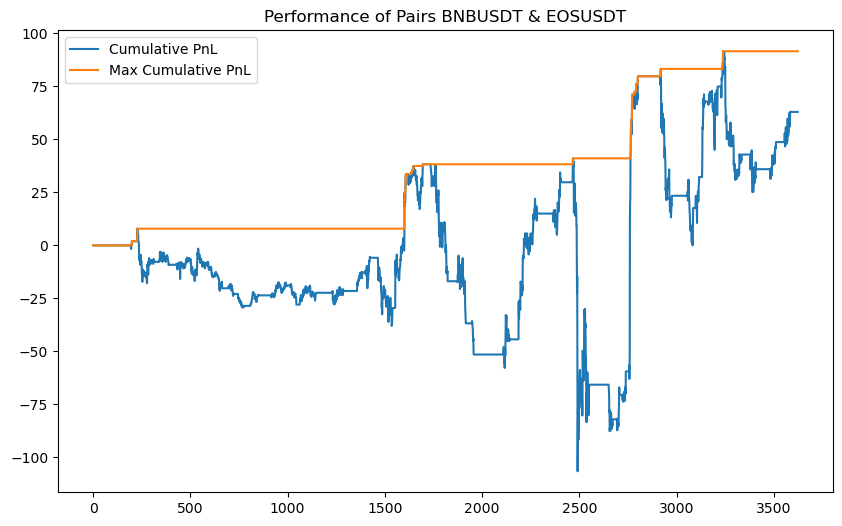

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Test,2024,No,0.480735,10512.613025,6299.224471,-14766.299397,-104 days +05:00:00


In [76]:
pairs1_test_performance = \
   pnlPerformance(pairs1_test['hourlypnl'].dropna(),'BNBUSDT & EOSUSDT','Test','2024','No')
pairs1_test_performance

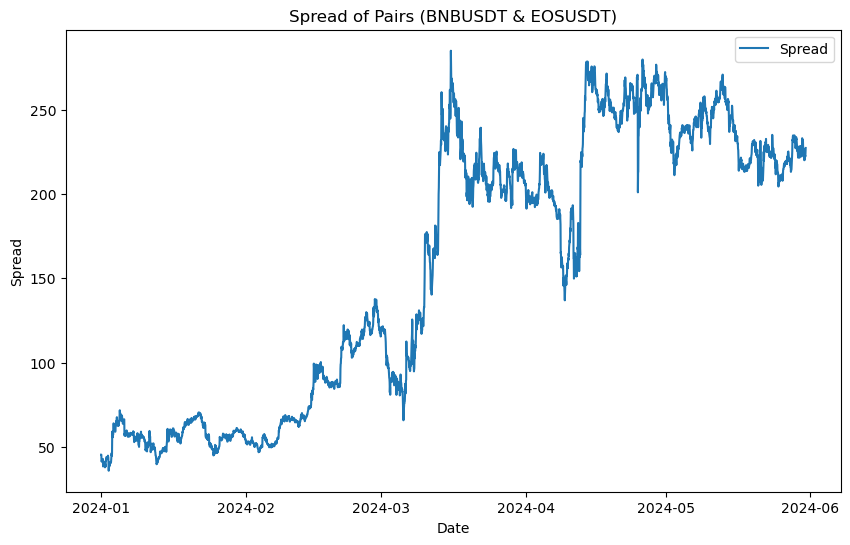

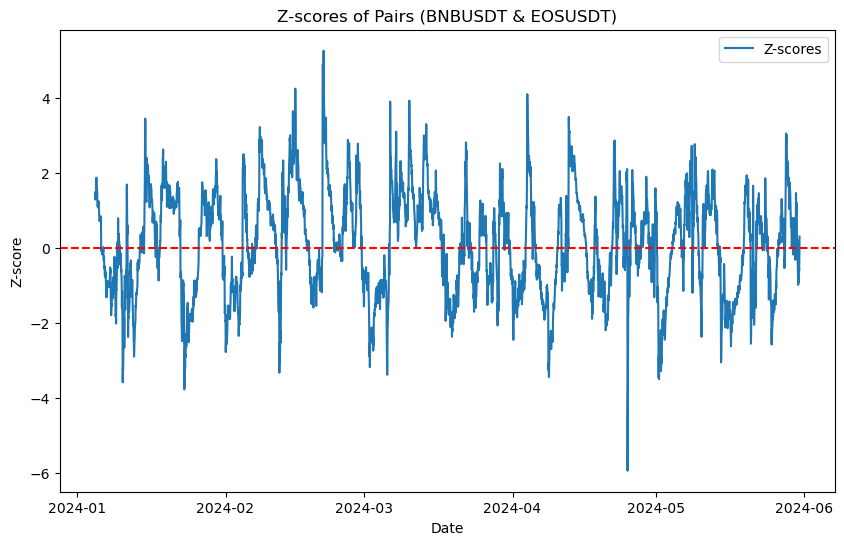

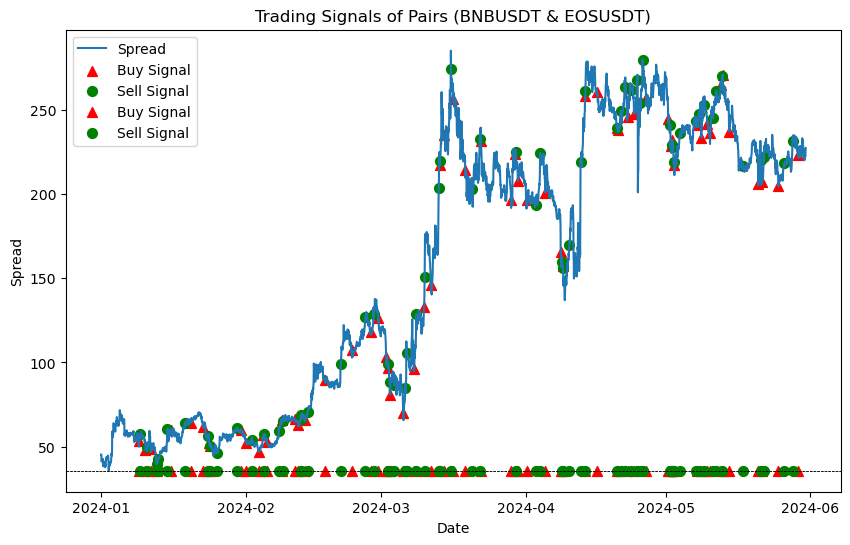

Assets,BNBUSDT,EOSUSDT,beta,intercept,spread,Spread_MA,Spread_Std,zscors,signal,position,...,return_X,position_Y,position_X,hourlypnl,cumpnl,max_cumpnl,return_crypto1,return_crypto2,crypto1position,crypto2position
Date,,,,,,,,,,,,,,,,,,,,,
2024-01-01 00:00:00,314.4,0.8540,178.222151,116.838676,45.359607,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-01-01 01:00:00,315.3,0.8590,178.225598,116.843767,45.360444,NaN,NaN,NaN,NaN,0.0,...,0.005838,0.0,-0.0,0.0,0.000000,0.00000,0.002859,0.005838,0.0,-0.0
2024-01-01 02:00:00,310.9,0.8560,178.228547,116.848824,41.487540,NaN,NaN,NaN,NaN,0.0,...,-0.003499,0.0,-0.0,0.0,0.000000,0.00000,-0.014053,-0.003499,0.0,-0.0
2024-01-01 03:00:00,309.2,0.8480,178.230697,116.854578,41.205792,NaN,NaN,NaN,NaN,0.0,...,-0.009390,0.0,-0.0,0.0,0.000000,0.00000,-0.005483,-0.009390,0.0,-0.0
2024-01-01 04:00:00,309.2,0.8430,178.232344,116.860855,42.089279,NaN,NaN,NaN,NaN,0.0,...,-0.005914,0.0,-0.0,0.0,0.000000,0.00000,0.000000,-0.005914,0.0,-0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-30 20:00:00,594.0,0.8130,696.421635,-192.671998,220.481209,225.566238,5.528408,-0.919800,NaN,0.0,...,-0.004173,0.0,-0.0,0.0,139.933002,187.02118,-0.005038,-0.004173,0.0,-0.0
2024-05-30 21:00:00,595.3,0.8112,696.574223,-192.748081,222.987071,225.588662,5.513624,-0.471848,NaN,0.0,...,-0.002216,0.0,-0.0,0.0,139.933002,187.02118,0.002186,-0.002216,0.0,-0.0
2024-05-30 22:00:00,595.0,0.8118,696.730380,-192.826766,222.221044,225.600218,5.505366,-0.613797,NaN,0.0,...,0.000739,0.0,-0.0,-0.0,139.933002,187.02118,-0.000504,0.000739,0.0,-0.0


In [77]:
stoploss1_pairs1_test = stop_loss_strategy1(pairs1_test, 'BNBUSDT','EOSUSDT','BNBUSDT','EOSUSDT',num_consecutive_losses=4)
stoploss1_pairs1_test

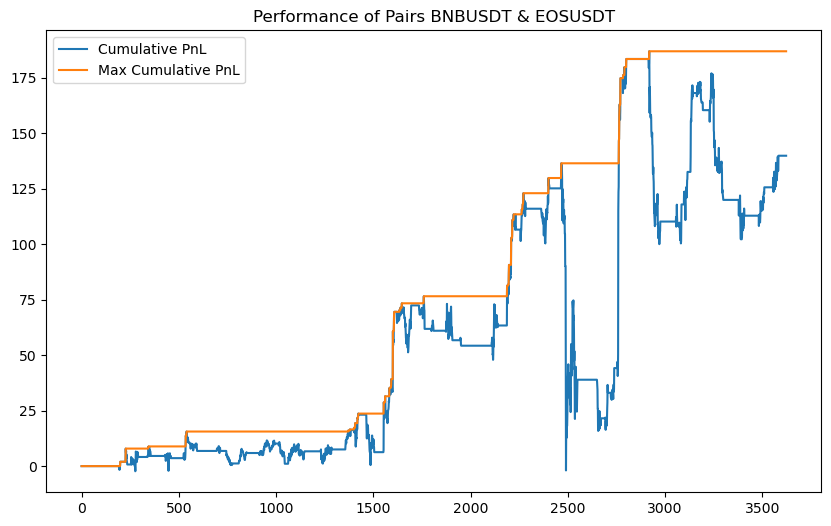

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Test,2024,Strategy1,1.132263,23353.057275,13993.300192,-13846.182818,-104 days +05:00:00


In [78]:
pairs1_test_stoploss1_performance = \
   pnlPerformance(stoploss1_pairs1_test['hourlypnl'].dropna(),'BNBUSDT & EOSUSDT','Test','2024','Strategy1')
pairs1_test_stoploss1_performance

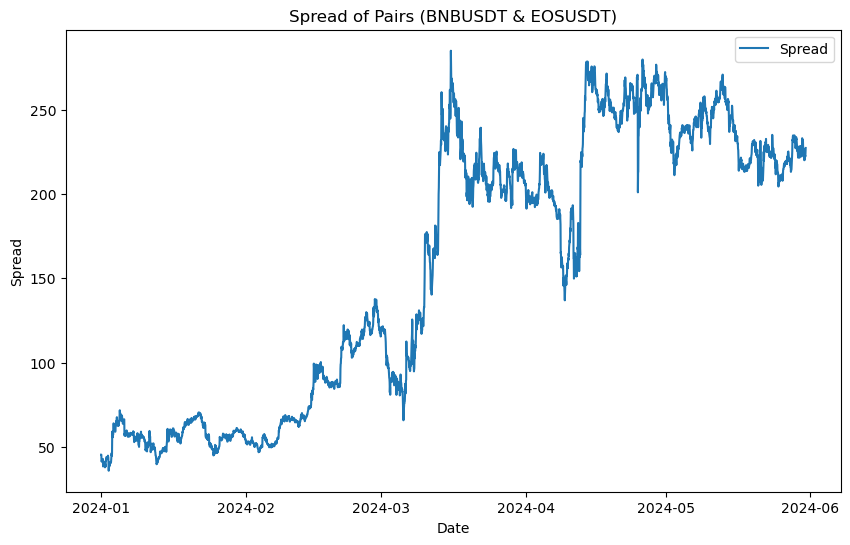

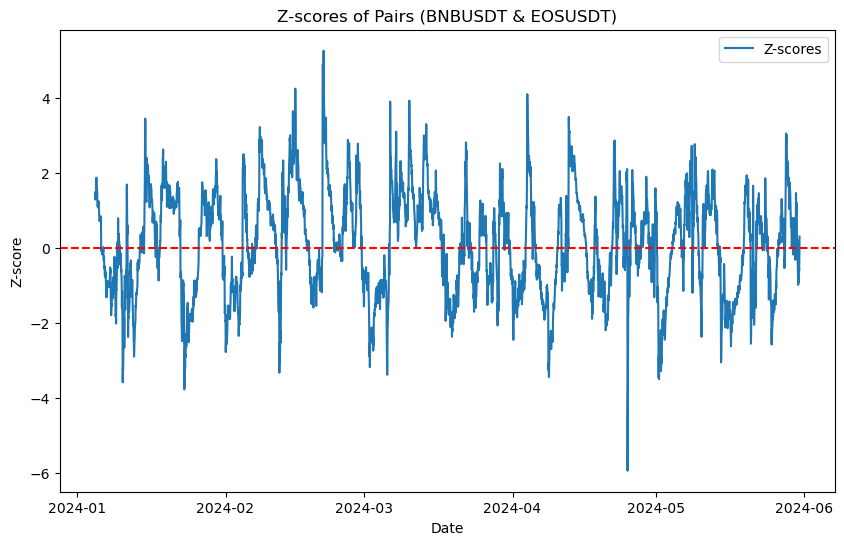

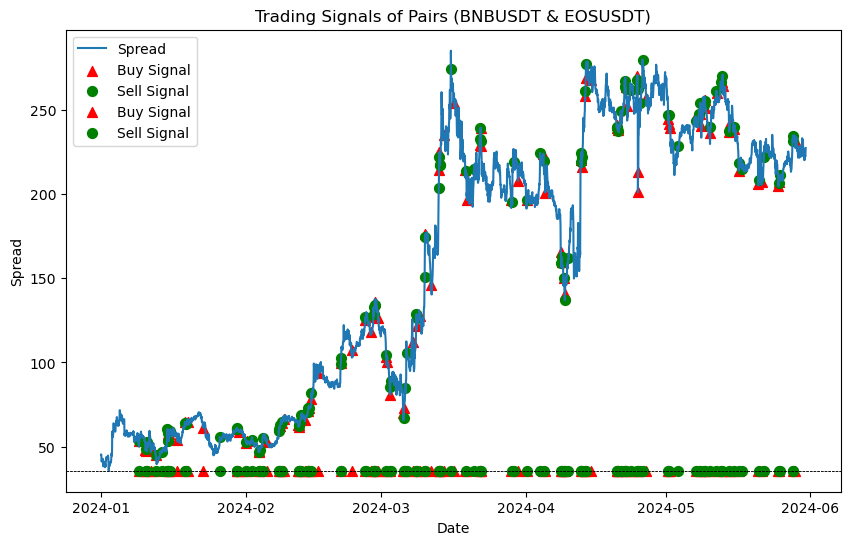

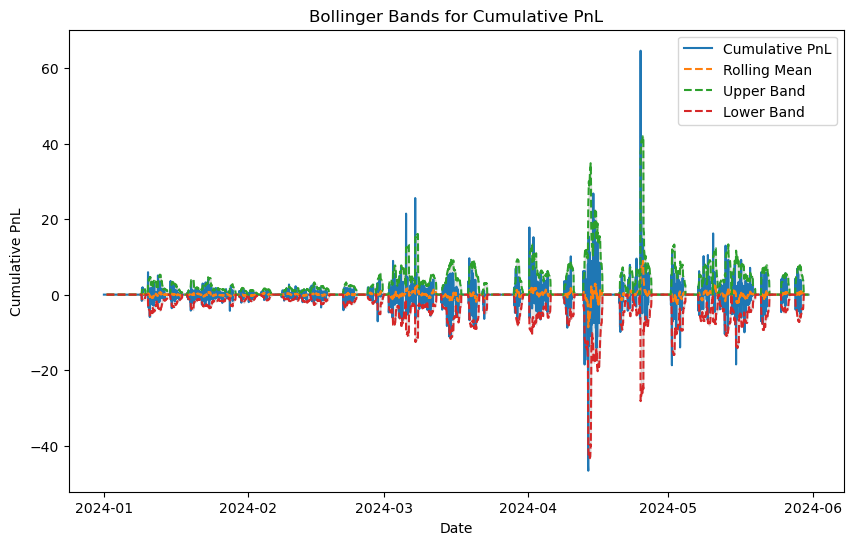

Assets,BNBUSDT,EOSUSDT,beta,intercept,spread,Spread_MA,Spread_Std,zscors,signal,position,return_Y,return_X,position_Y,position_X,hourlypnl,cumpnl,max_cumpnl,stop_loss_signal
Date,,,,,,,,,,,,,,,,,,
2024-01-01 00:00:00,314.4,0.8540,178.222151,116.838676,45.359607,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-01-01 01:00:00,315.3,0.8590,178.225598,116.843767,45.360444,NaN,NaN,NaN,NaN,0.0,0.002859,0.005838,0.0,-0.0,0.0,0.000000,0.000000,NaN
2024-01-01 02:00:00,310.9,0.8560,178.228547,116.848824,41.487540,NaN,NaN,NaN,NaN,0.0,-0.014053,-0.003499,0.0,-0.0,0.0,0.000000,0.000000,NaN
2024-01-01 03:00:00,309.2,0.8480,178.230697,116.854578,41.205792,NaN,NaN,NaN,NaN,0.0,-0.005483,-0.009390,0.0,-0.0,0.0,0.000000,0.000000,NaN
2024-01-01 04:00:00,309.2,0.8430,178.232344,116.860855,42.089279,NaN,NaN,NaN,NaN,0.0,0.000000,-0.005914,0.0,-0.0,0.0,0.000000,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-30 20:00:00,594.0,0.8130,696.421635,-192.671998,220.481209,225.566238,5.528408,-0.919800,NaN,0.0,-0.005038,-0.004173,0.0,-0.0,0.0,41.831044,96.701018,NaN
2024-05-30 21:00:00,595.3,0.8112,696.574223,-192.748081,222.987071,225.588662,5.513624,-0.471848,NaN,0.0,0.002186,-0.002216,0.0,-0.0,0.0,41.831044,96.701018,NaN
2024-05-30 22:00:00,595.0,0.8118,696.730380,-192.826766,222.221044,225.600218,5.505366,-0.613797,NaN,0.0,-0.000504,0.000739,0.0,-0.0,-0.0,41.831044,96.701018,NaN


In [79]:
stoploss2_pairs1_test = \
   bollinger_band_stop_loss(pairs1_test, 'hourlypnl','BNBUSDT','EOSUSDT',boll_window,std_multiplier)
stoploss2_pairs1_test

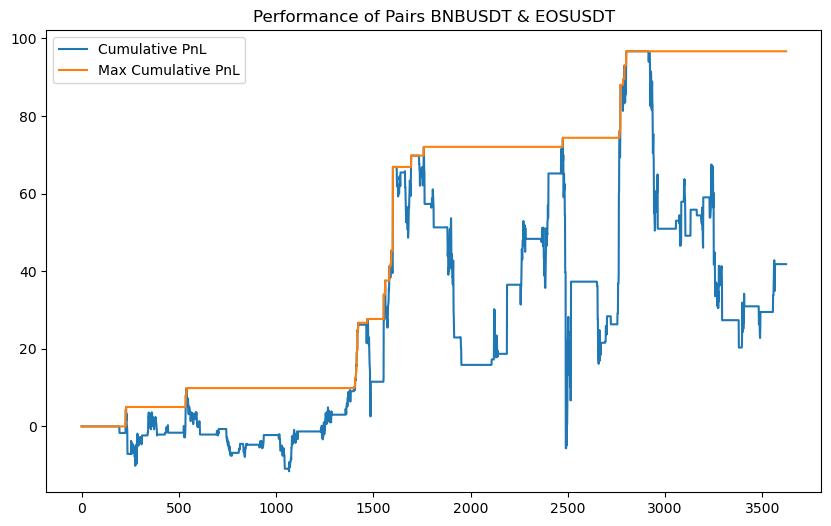

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Test,2024,Strategy2,0.472748,6981.07485,4183.104374,-8002.17974,-104 days +06:00:00


In [80]:
pairs1_test_stoploss2_performance = \
   pnlPerformance(stoploss2_pairs1_test['hourlypnl'].dropna(),'BNBUSDT & EOSUSDT','Test','2024','Strategy2')
pairs1_test_stoploss2_performance

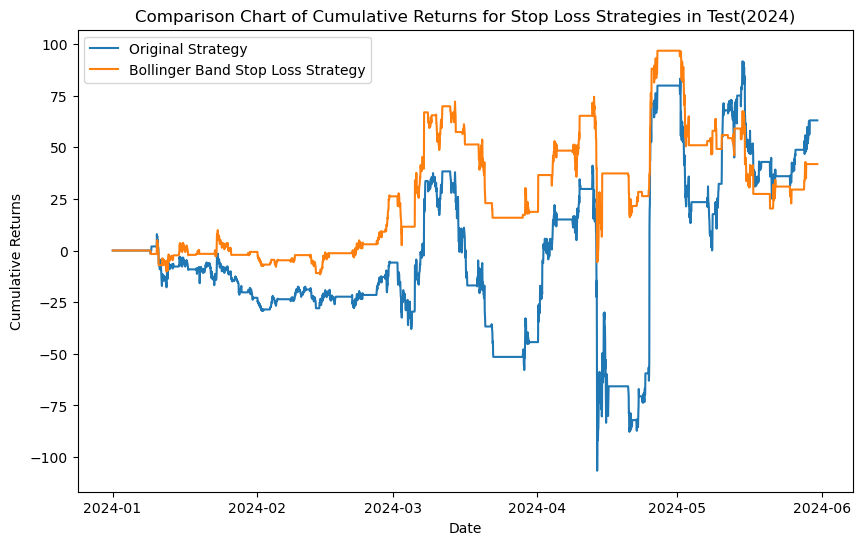

In [81]:
compare_stop_loss_strategies(pairs1_test, stoploss2_pairs1_test, 'cumpnl', 'Test(2024)')

In [82]:
conclu_performance_1 = pd.concat([pairs1_train_2123_performance,
                                pairs1_train_2123_stoploss1_performance,
                                pairs1_train_2123_stoploss2_performance,
                                pairs1_train_2223_performance,
                                pairs1_train_2223_stoploss1_performance,
                                pairs1_train_2223_stoploss2_performance,
                                pairs1_train_21_performance,
                                pairs1_train_21_stoploss1_performance,
                                pairs1_train_21_stoploss2_performance, 
                                pairs1_train_22_performance,
                                pairs1_train_22_stoploss1_performance,
                                pairs1_train_22_stoploss2_performance,
                                pairs1_train_23_performance,
                                pairs1_train_23_stoploss1_performance,
                                pairs1_train_23_stoploss2_performance,
                                pairs1_test_performance,
                                pairs1_test_stoploss1_performance,
                                pairs1_test_stoploss2_performance])
conclu_performance_1

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2021-2023,No,0.209421,1188.660107,5163.438876,-11038.562436,-173 days +05:00:00
Train,2021-2023,Strategy 1,0.028061,141.990455,616.794517,-9300.335334,-140 days +18:00:00
Train,2021-2023,Strategy 2,-0.169613,-776.727251,-3374.037424,-8138.166929,-143 days +02:00:00
Train,2022-2023,No,0.287830,1191.779632,3449.618757,-5217.006663,-427 days +14:00:00
Train,2022-2023,Strategy 1,0.027531,100.073529,289.663889,-6341.876305,-577 days +18:00:00
Train,2022-2023,Strategy 2,-0.285774,-919.258941,-2660.804733,-7121.122059,-559 days +04:00:00
Train,2021,No,0.146008,1152.968035,1668.639089,-11038.562436,-173 days +05:00:00
Train,2021,Strategy1,0.052639,373.678961,540.808853,-9300.335334,-140 days +18:00:00
Train,2021,Strategy2,-0.070757,-459.883276,-665.568505,-8138.166929,-143 days +02:00:00
Train,2022,No,0.261482,922.249543,1333.815601,-4383.895213,-347 days +23:00:00


### Version 3 : 2-year cointegration with drop 4-days stop-loss 'XRPUSDT & BCHUSDT'

In [83]:
pairs2_train_2123 = pairs_2.loc['2020-01-01':'2023-12-31']
pairs2_train_2123

Assets,XRPUSDT,BCHUSDT
Date,,
2020-01-01 00:00:00,0.19248,204.43
2020-01-01 01:00:00,0.19371,206.19
2020-01-01 02:00:00,0.19418,207.38
2020-01-01 03:00:00,0.19397,205.71
2020-01-01 04:00:00,0.19363,206.20
...,...,...
2023-12-31 19:00:00,0.62060,261.40
2023-12-31 20:00:00,0.61830,260.50
2023-12-31 21:00:00,0.61930,261.30


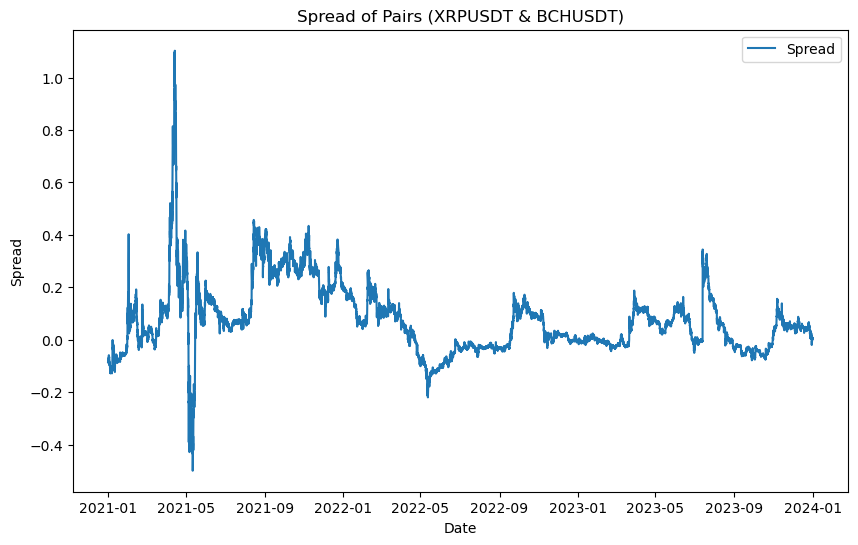

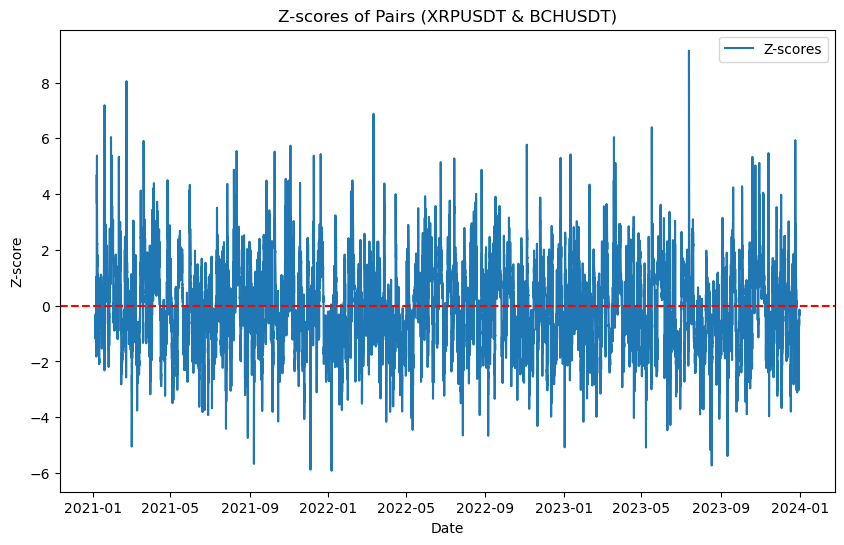

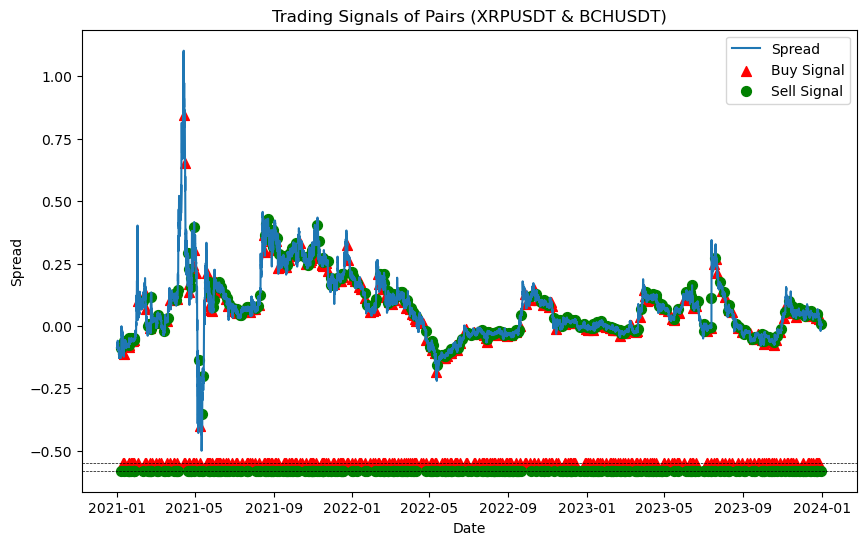

Assets,XRPUSDT,BCHUSDT,beta,intercept,spread,Spread_MA,Spread_Std,zscors,signal,position,return_Y,return_X,position_Y,position_X,hourlypnl,cumpnl,max_cumpnl
Date,,,,,,,,,,,,,,,,,
2020-12-31 17:00:00,0.21814,342.45,0.000648,0.082809,-0.086668,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-12-31 18:00:00,0.21825,342.90,0.000648,0.082877,-0.086822,NaN,NaN,NaN,NaN,0,0.000504,0.001313,0.0,-0.0,0.0,0.000000,0.000000
2020-12-31 19:00:00,0.21910,342.39,0.000648,0.082944,-0.085614,NaN,NaN,NaN,NaN,0,0.003887,-0.001488,0.0,-0.0,0.0,0.000000,0.000000
2020-12-31 20:00:00,0.22109,341.34,0.000647,0.083009,-0.082918,NaN,NaN,NaN,NaN,0,0.009042,-0.003071,0.0,-0.0,0.0,0.000000,0.000000
2020-12-31 21:00:00,0.22448,342.86,0.000647,0.083073,-0.080487,NaN,NaN,NaN,NaN,0,0.015217,0.004443,0.0,-0.0,0.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 19:00:00,0.62060,261.40,0.001241,0.288718,0.007459,0.009135,0.011676,-0.143558,0.0,0,-0.000805,-0.007242,0.0,-0.0,0.0,-0.232487,0.057049
2023-12-31 20:00:00,0.61830,260.50,0.001241,0.288757,0.006281,0.008829,0.011378,-0.223871,0.0,0,-0.003713,-0.003449,0.0,-0.0,0.0,-0.232487,0.057049
2023-12-31 21:00:00,0.61930,261.30,0.001241,0.288796,0.006294,0.008610,0.011232,-0.206135,0.0,0,0.001616,0.003066,0.0,-0.0,0.0,-0.232487,0.057049


In [84]:
pairs2_train_2123 = pairs_trading_strategy(pairs2_train_2123,'XRPUSDT','BCHUSDT',z_signal_in, 
                                           z_signal_out, min_spread, MA_window, OLS_window
                                          )
pairs2_train_2123

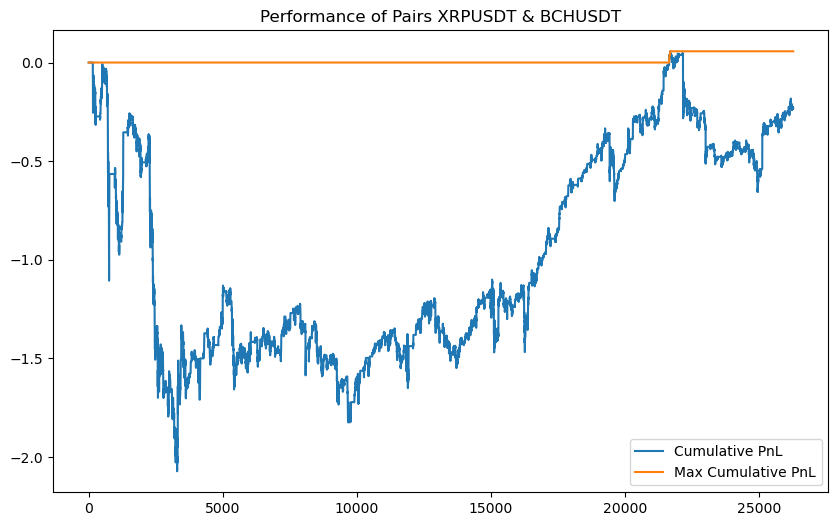

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2021-2023,No,-0.072397,-5.352018,-23.248711,-207.200261,-138 days +07:00:00


In [85]:
pairs2_train_2123_performance = \
   pnlPerformance(pairs2_train_2123['hourlypnl'].dropna(),'XRPUSDT & BCHUSDT','Train','2021-2023','No')
pairs2_train_2123_performance

In [86]:
pairs2_train_2223 = pairs_2.loc['2021-01-01':'2023-12-31']
pairs2_train_2223

Assets,XRPUSDT,BCHUSDT
Date,,
2021-01-01 00:00:00,0.22162,341.44
2021-01-01 01:00:00,0.22382,349.71
2021-01-01 02:00:00,0.22361,354.37
2021-01-01 03:00:00,0.22730,350.95
2021-01-01 04:00:00,0.23898,348.21
...,...,...
2023-12-31 19:00:00,0.62060,261.40
2023-12-31 20:00:00,0.61830,260.50
2023-12-31 21:00:00,0.61930,261.30


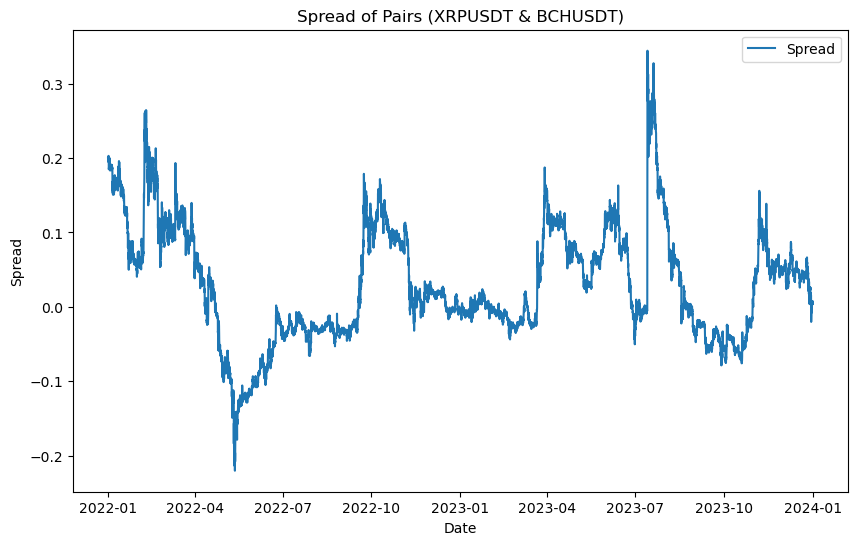

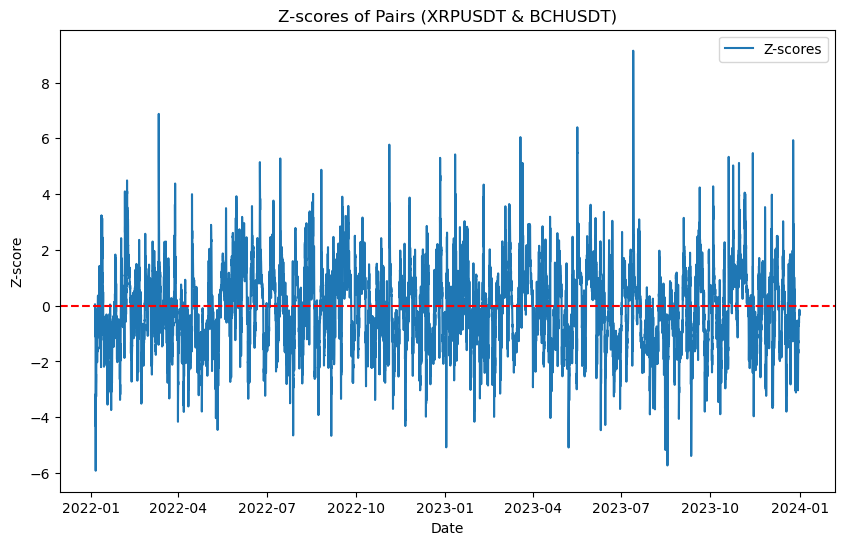

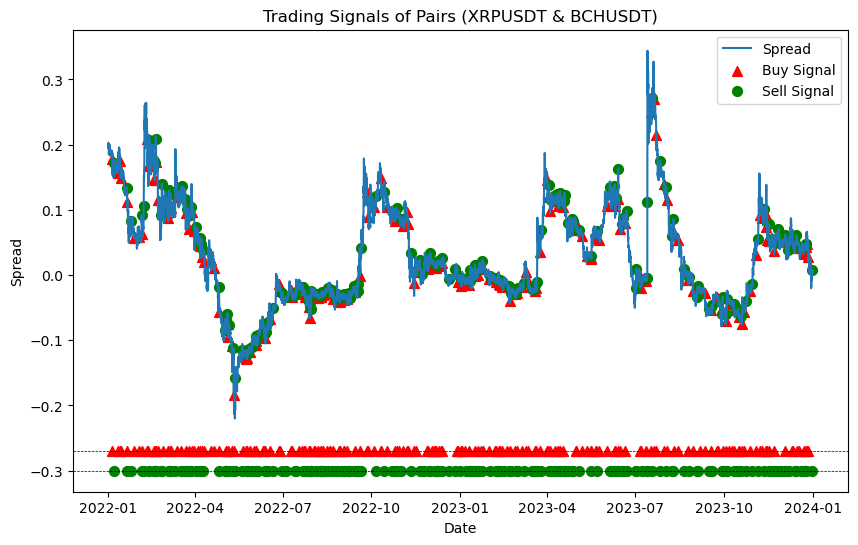

Assets,XRPUSDT,BCHUSDT,beta,intercept,spread,Spread_MA,Spread_Std,zscors,signal,position,return_Y,return_X,position_Y,position_X,hourlypnl,cumpnl,max_cumpnl
Date,,,,,,,,,,,,,,,,,
2022-01-01 12:00:00,0.8425,438.5,0.001344,0.053213,0.199841,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-01-01 13:00:00,0.8409,437.2,0.001344,0.053485,0.199873,NaN,NaN,NaN,NaN,0,-0.001901,-0.002969,0.0,-0.0,0.0,0.000000,0.000000
2022-01-01 14:00:00,0.8399,440.1,0.001344,0.053755,0.194861,NaN,NaN,NaN,NaN,0,-0.001190,0.006611,0.0,-0.0,-0.0,0.000000,0.000000
2022-01-01 15:00:00,0.8425,441.4,0.001343,0.054026,0.195600,NaN,NaN,NaN,NaN,0,0.003091,0.002950,0.0,-0.0,0.0,0.000000,0.000000
2022-01-01 16:00:00,0.8448,442.7,0.001343,0.054293,0.196041,NaN,NaN,NaN,NaN,0,0.002726,0.002941,0.0,-0.0,0.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 19:00:00,0.6206,261.4,0.001241,0.288718,0.007459,0.009135,0.011676,-0.143558,0.0,0,-0.000805,-0.007242,0.0,-0.0,0.0,1.251415,1.540951
2023-12-31 20:00:00,0.6183,260.5,0.001241,0.288757,0.006281,0.008829,0.011378,-0.223871,0.0,0,-0.003713,-0.003449,0.0,-0.0,0.0,1.251415,1.540951
2023-12-31 21:00:00,0.6193,261.3,0.001241,0.288796,0.006294,0.008610,0.011232,-0.206135,0.0,0,0.001616,0.003066,0.0,-0.0,0.0,1.251415,1.540951


In [87]:
pairs2_train_2223 = \
   pairs_trading_strategy(pairs2_train_2223,'XRPUSDT','BCHUSDT',z_signal_in, 
                          z_signal_out, min_spread, MA_window, OLS_window
                         )
pairs2_train_2223

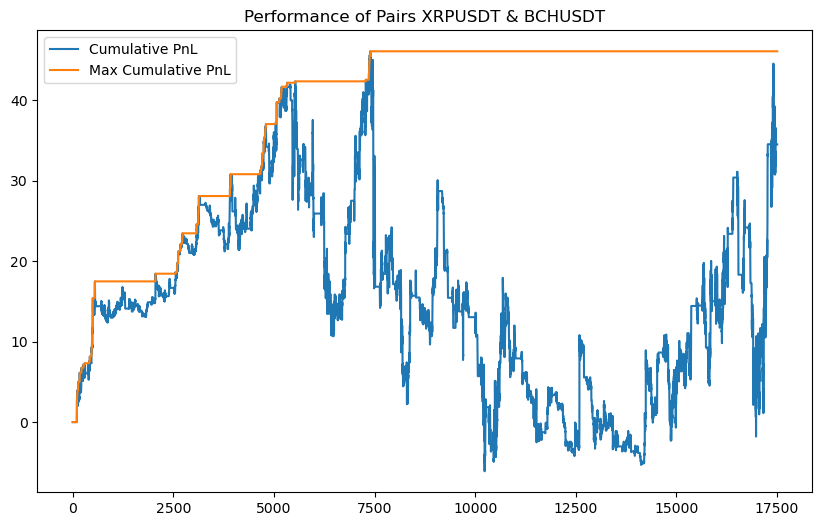

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2022-2023,No,0.28783,1191.779632,3449.618757,-5217.006663,-427 days +14:00:00


In [88]:
pairs2_train_2223_performance = \
   pnlPerformance(pairs1_train_2223['hourlypnl'].dropna(),'XRPUSDT & BCHUSDT','Train','2022-2023','No')

pairs2_train_2223_performance

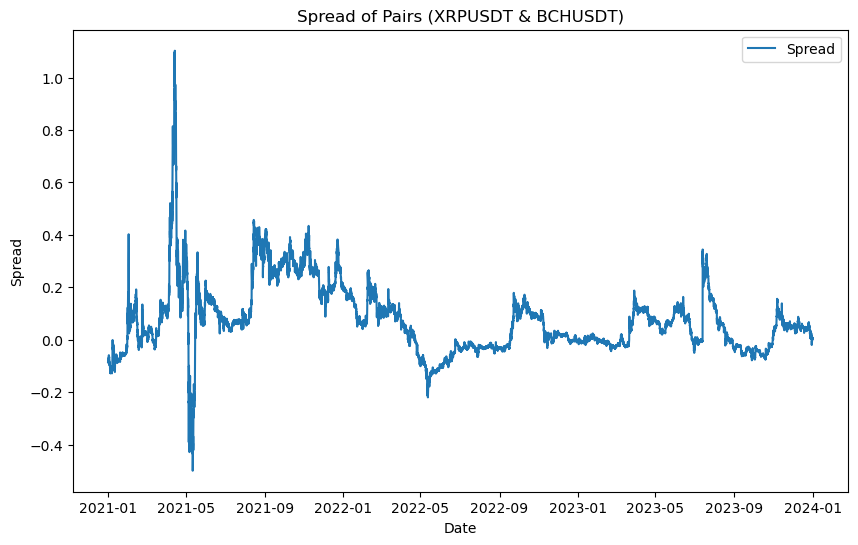

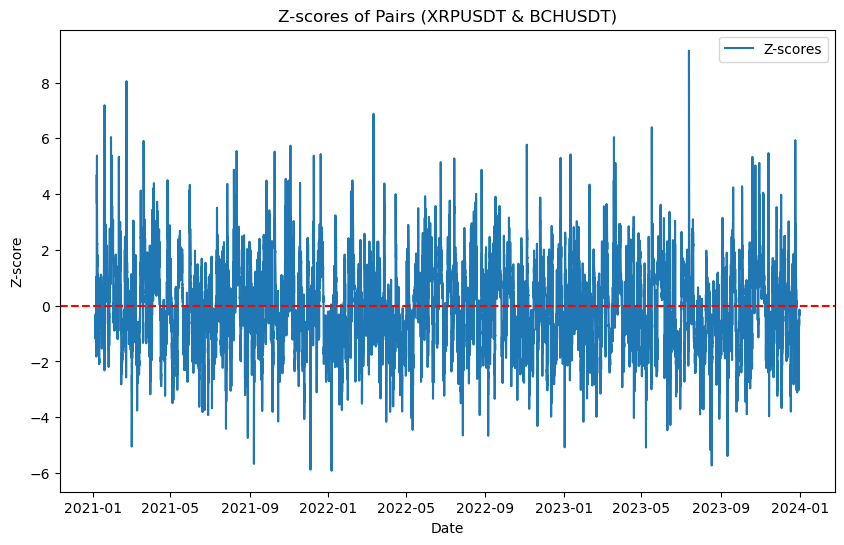

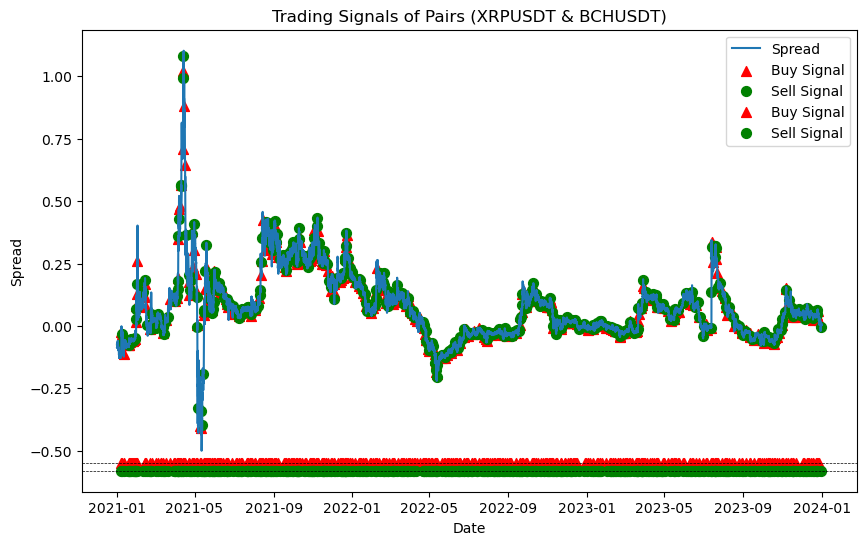

Assets,XRPUSDT,BCHUSDT,beta,intercept,spread,Spread_MA,Spread_Std,zscors,signal,position,...,return_X,position_Y,position_X,hourlypnl,cumpnl,max_cumpnl,return_crypto1,return_crypto2,crypto1position,crypto2position
Date,,,,,,,,,,,,,,,,,,,,,
2020-12-31 17:00:00,0.21814,342.45,0.000648,0.082809,-0.086668,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-12-31 18:00:00,0.21825,342.90,0.000648,0.082877,-0.086822,NaN,NaN,NaN,NaN,0.0,...,0.001313,0.0,-0.0,0.0,0.000000,0.0,0.000504,0.001313,0.0,-0.0
2020-12-31 19:00:00,0.21910,342.39,0.000648,0.082944,-0.085614,NaN,NaN,NaN,NaN,0.0,...,-0.001488,0.0,-0.0,0.0,0.000000,0.0,0.003887,-0.001488,0.0,-0.0
2020-12-31 20:00:00,0.22109,341.34,0.000647,0.083009,-0.082918,NaN,NaN,NaN,NaN,0.0,...,-0.003071,0.0,-0.0,0.0,0.000000,0.0,0.009042,-0.003071,0.0,-0.0
2020-12-31 21:00:00,0.22448,342.86,0.000647,0.083073,-0.080487,NaN,NaN,NaN,NaN,0.0,...,0.004443,0.0,-0.0,0.0,0.000000,0.0,0.015217,0.004443,0.0,-0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 19:00:00,0.62060,261.40,0.001241,0.288718,0.007459,0.009135,0.011676,-0.143558,0.0,0.0,...,-0.007242,0.0,-0.0,0.0,-0.771619,0.0,-0.000805,-0.007242,0.0,-0.0
2023-12-31 20:00:00,0.61830,260.50,0.001241,0.288757,0.006281,0.008829,0.011378,-0.223871,0.0,0.0,...,-0.003449,0.0,-0.0,0.0,-0.771619,0.0,-0.003713,-0.003449,0.0,-0.0
2023-12-31 21:00:00,0.61930,261.30,0.001241,0.288796,0.006294,0.008610,0.011232,-0.206135,0.0,0.0,...,0.003066,0.0,-0.0,0.0,-0.771619,0.0,0.001616,0.003066,0.0,-0.0


In [89]:
stoploss1_pairs2_train_2123 = \
   stop_loss_strategy1(pairs2_train_2123, 'XRPUSDT','BCHUSDT','XRPUSDT','BCHUSDT',num_consecutive_losses=4)
stoploss1_pairs2_train_2123

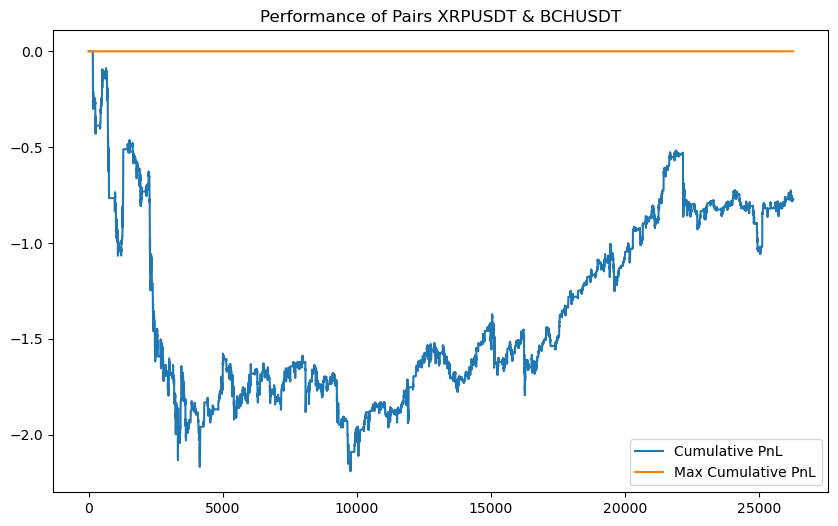

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2021-2023,Strategy 1,-0.280951,-17.763218,-77.161916,-219.061716,-408 days +20:00:00


In [90]:
pairs2_train_2123_stoploss1_performance = \
   pnlPerformance(stoploss1_pairs2_train_2123['hourlypnl'].dropna(),
                  'XRPUSDT & BCHUSDT','Train','2021-2023','Strategy 1')
pairs2_train_2123_stoploss1_performance

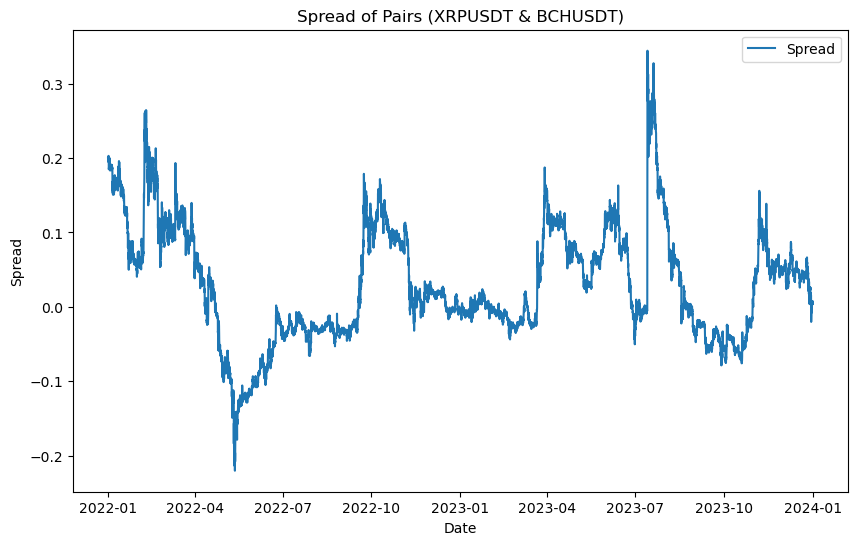

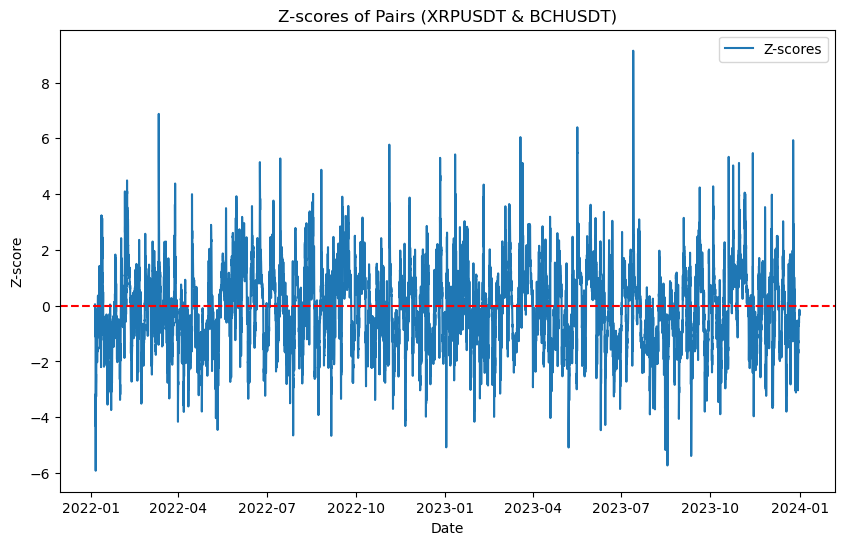

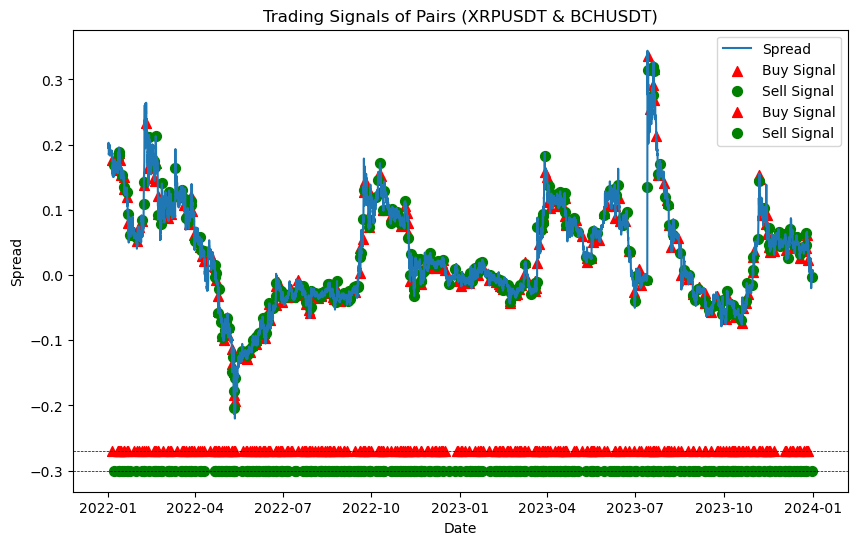

Assets,XRPUSDT,BCHUSDT,beta,intercept,spread,Spread_MA,Spread_Std,zscors,signal,position,...,return_X,position_Y,position_X,hourlypnl,cumpnl,max_cumpnl,return_crypto1,return_crypto2,crypto1position,crypto2position
Date,,,,,,,,,,,,,,,,,,,,,
2022-01-01 12:00:00,0.8425,438.5,0.001344,0.053213,0.199841,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-01-01 13:00:00,0.8409,437.2,0.001344,0.053485,0.199873,NaN,NaN,NaN,NaN,0.0,...,-0.002969,0.0,-0.0,0.0,0.000000,0.000000,-0.001901,-0.002969,0.0,-0.0
2022-01-01 14:00:00,0.8399,440.1,0.001344,0.053755,0.194861,NaN,NaN,NaN,NaN,0.0,...,0.006611,0.0,-0.0,-0.0,0.000000,0.000000,-0.001190,0.006611,0.0,-0.0
2022-01-01 15:00:00,0.8425,441.4,0.001343,0.054026,0.195600,NaN,NaN,NaN,NaN,0.0,...,0.002950,0.0,-0.0,0.0,0.000000,0.000000,0.003091,0.002950,0.0,-0.0
2022-01-01 16:00:00,0.8448,442.7,0.001343,0.054293,0.196041,NaN,NaN,NaN,NaN,0.0,...,0.002941,0.0,-0.0,0.0,0.000000,0.000000,0.002726,0.002941,0.0,-0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 19:00:00,0.6206,261.4,0.001241,0.288718,0.007459,0.009135,0.011676,-0.143558,0.0,0.0,...,-0.007242,0.0,-0.0,0.0,0.926484,1.180971,-0.000805,-0.007242,0.0,-0.0
2023-12-31 20:00:00,0.6183,260.5,0.001241,0.288757,0.006281,0.008829,0.011378,-0.223871,0.0,0.0,...,-0.003449,0.0,-0.0,0.0,0.926484,1.180971,-0.003713,-0.003449,0.0,-0.0
2023-12-31 21:00:00,0.6193,261.3,0.001241,0.288796,0.006294,0.008610,0.011232,-0.206135,0.0,0.0,...,0.003066,0.0,-0.0,0.0,0.926484,1.180971,0.001616,0.003066,0.0,-0.0


In [91]:
stoploss1_pairs2_train_2223 = \
   stop_loss_strategy1(pairs2_train_2223, 'XRPUSDT','BCHUSDT','XRPUSDT','BCHUSDT',num_consecutive_losses=4)
stoploss1_pairs2_train_2223

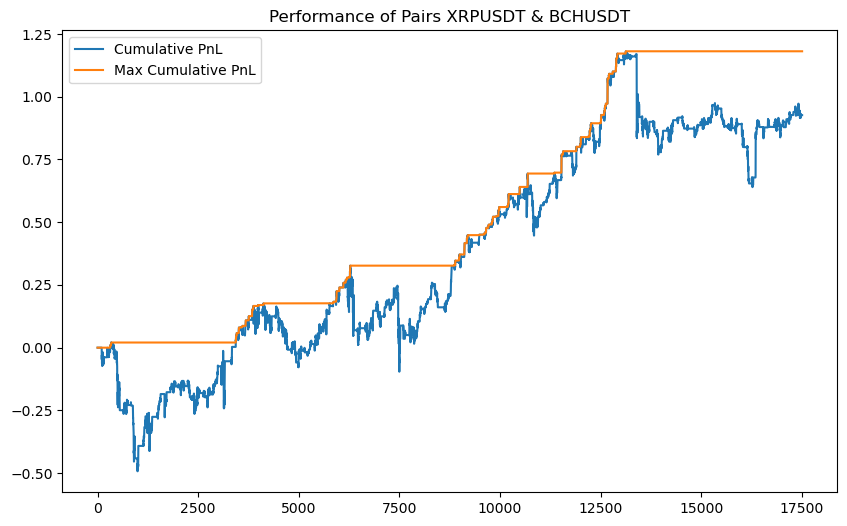

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2022-2023,Strategy 1,0.682684,32.008314,92.648404,-54.134008,-679 days +23:00:00


In [92]:
pairs2_train_2223_stoploss1_performance = \
   pnlPerformance(stoploss1_pairs2_train_2223['hourlypnl'].dropna(),
                  'XRPUSDT & BCHUSDT','Train','2022-2023','Strategy 1'
                 )
pairs2_train_2223_stoploss1_performance

### Version 4: 2-year cointegration with bollinger band stop-loss 'XRPUSDT & BCHUSDT'

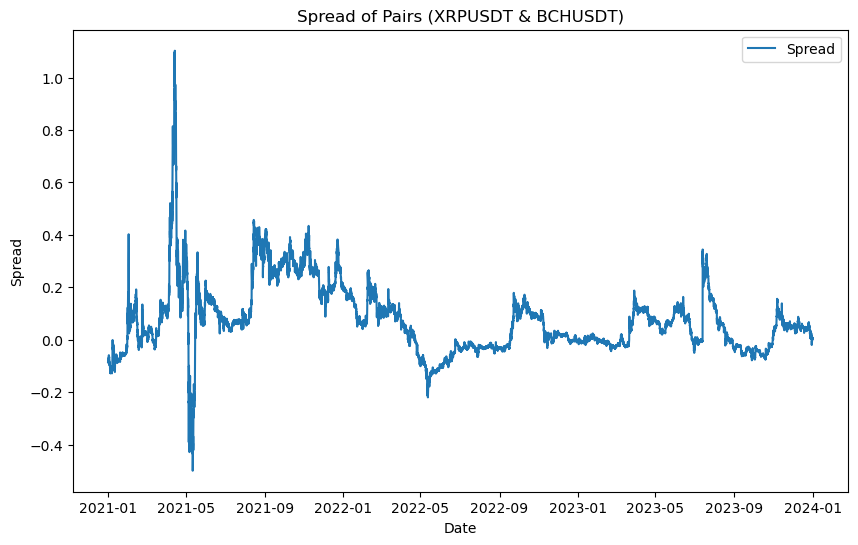

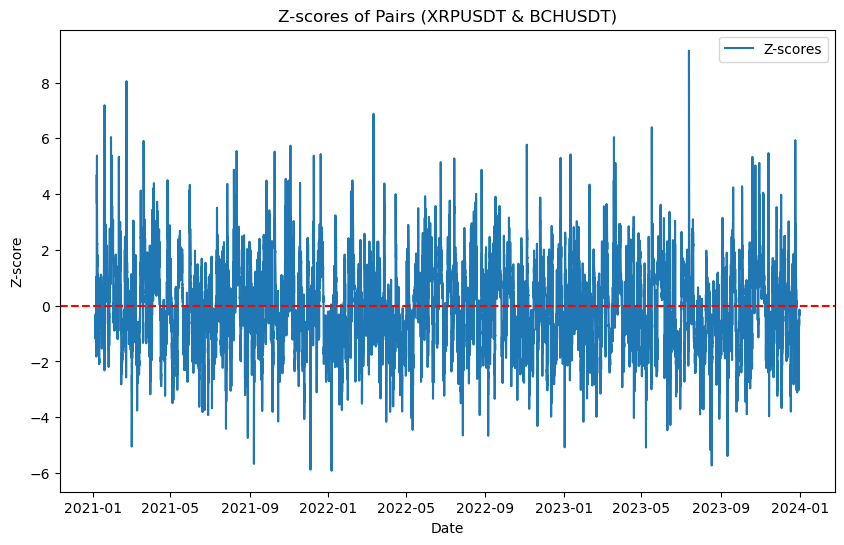

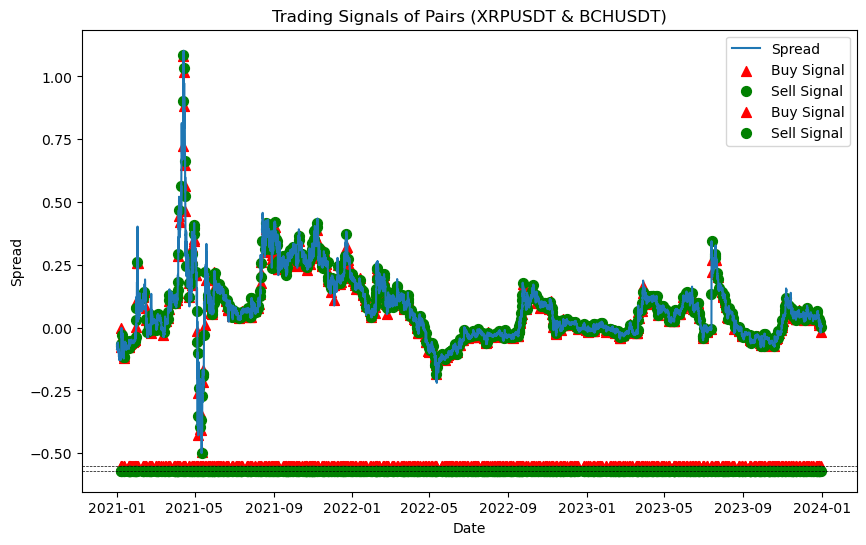

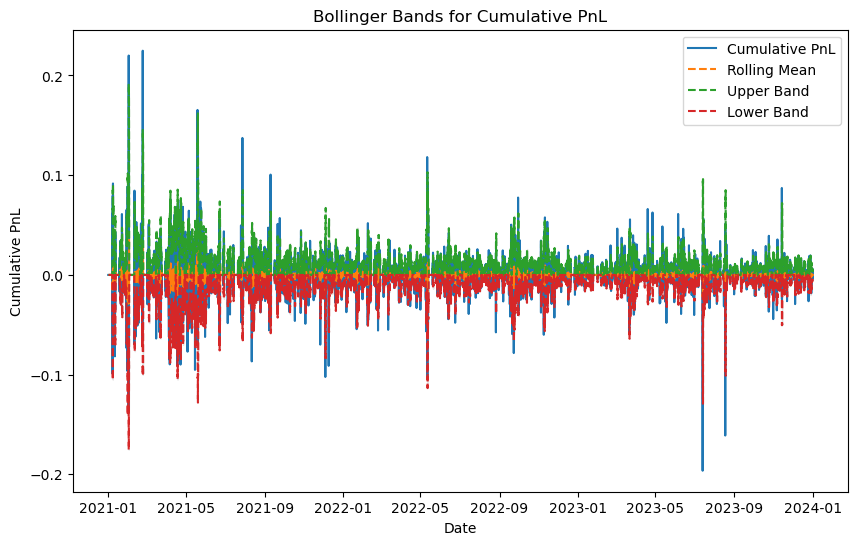

Assets,XRPUSDT,BCHUSDT,beta,intercept,spread,Spread_MA,Spread_Std,zscors,signal,position,return_Y,return_X,position_Y,position_X,hourlypnl,cumpnl,max_cumpnl,stop_loss_signal
Date,,,,,,,,,,,,,,,,,,
2020-12-31 17:00:00,0.21814,342.45,0.000648,0.082809,-0.086668,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-12-31 18:00:00,0.21825,342.90,0.000648,0.082877,-0.086822,NaN,NaN,NaN,NaN,0.0,0.000504,0.001313,0.0,-0.0,0.0,0.000000,0.000000,NaN
2020-12-31 19:00:00,0.21910,342.39,0.000648,0.082944,-0.085614,NaN,NaN,NaN,NaN,0.0,0.003887,-0.001488,0.0,-0.0,0.0,0.000000,0.000000,NaN
2020-12-31 20:00:00,0.22109,341.34,0.000647,0.083009,-0.082918,NaN,NaN,NaN,NaN,0.0,0.009042,-0.003071,0.0,-0.0,0.0,0.000000,0.000000,NaN
2020-12-31 21:00:00,0.22448,342.86,0.000647,0.083073,-0.080487,NaN,NaN,NaN,NaN,0.0,0.015217,0.004443,0.0,-0.0,0.0,0.000000,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 19:00:00,0.62060,261.40,0.001241,0.288718,0.007459,0.009135,0.011676,-0.143558,0.0,0.0,-0.000805,-0.007242,0.0,-0.0,0.0,1.629239,1.659833,NaN
2023-12-31 20:00:00,0.61830,260.50,0.001241,0.288757,0.006281,0.008829,0.011378,-0.223871,0.0,0.0,-0.003713,-0.003449,0.0,-0.0,0.0,1.629239,1.659833,NaN
2023-12-31 21:00:00,0.61930,261.30,0.001241,0.288796,0.006294,0.008610,0.011232,-0.206135,0.0,0.0,0.001616,0.003066,0.0,-0.0,0.0,1.629239,1.659833,NaN


In [93]:
stoploss2_pairs2_train_2123 = \
   bollinger_band_stop_loss(pairs2_train_2123, 'hourlypnl','XRPUSDT','BCHUSDT',boll_window,std_multiplier)
stoploss2_pairs2_train_2123

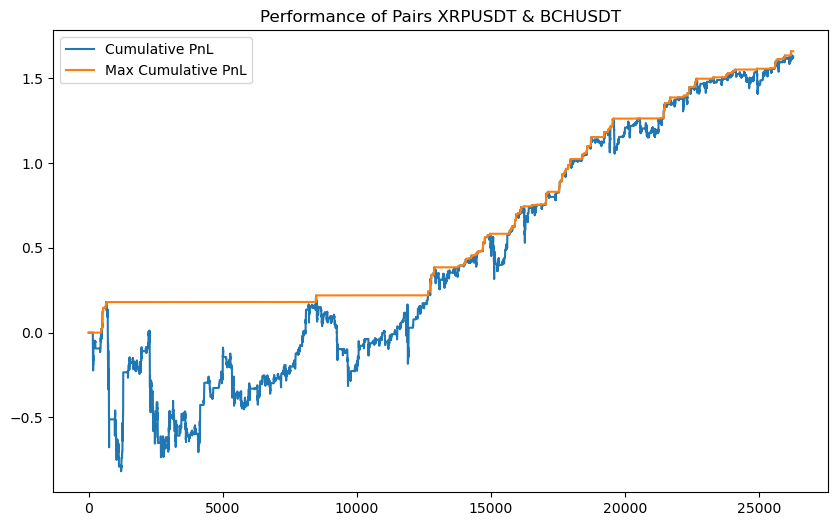

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2021-2023,Strategy 2,0.684103,37.506237,162.92392,-99.834676,-51 days +12:00:00


In [94]:
pairs2_train_2123_stoploss2_performance = \
   pnlPerformance(stoploss2_pairs2_train_2123['hourlypnl'].dropna(),
                 'XRPUSDT & BCHUSDT','Train','2021-2023','Strategy 2')

pairs2_train_2123_stoploss2_performance

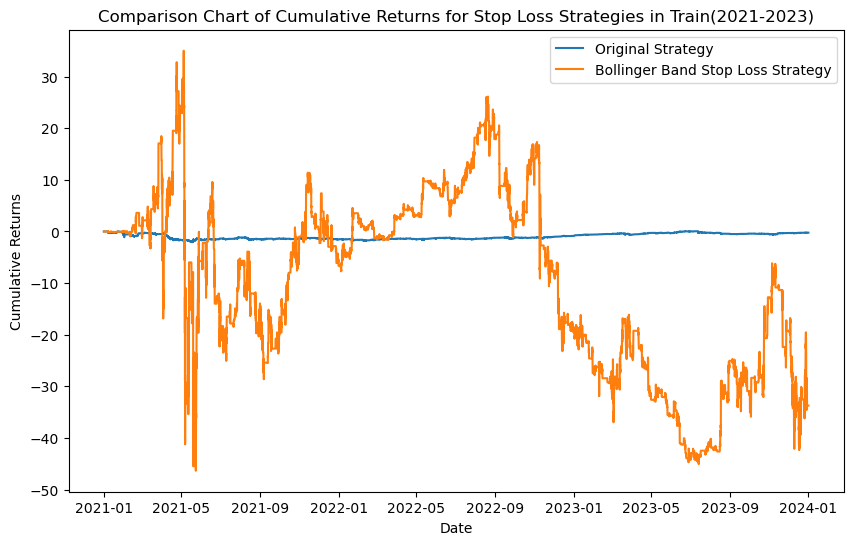

In [95]:
compare_stop_loss_strategies(pairs2_train_2123, stoploss2_pairs1_train_2123, 'cumpnl', 'Train(2021-2023)')

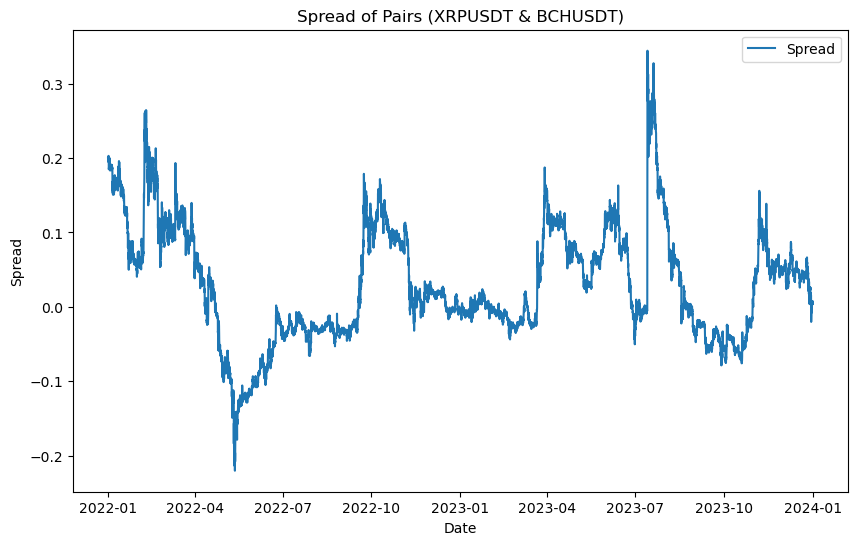

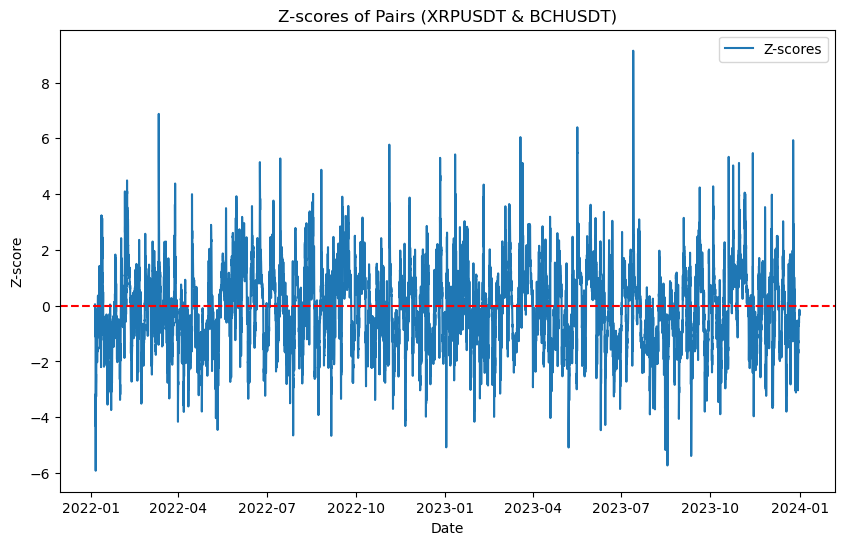

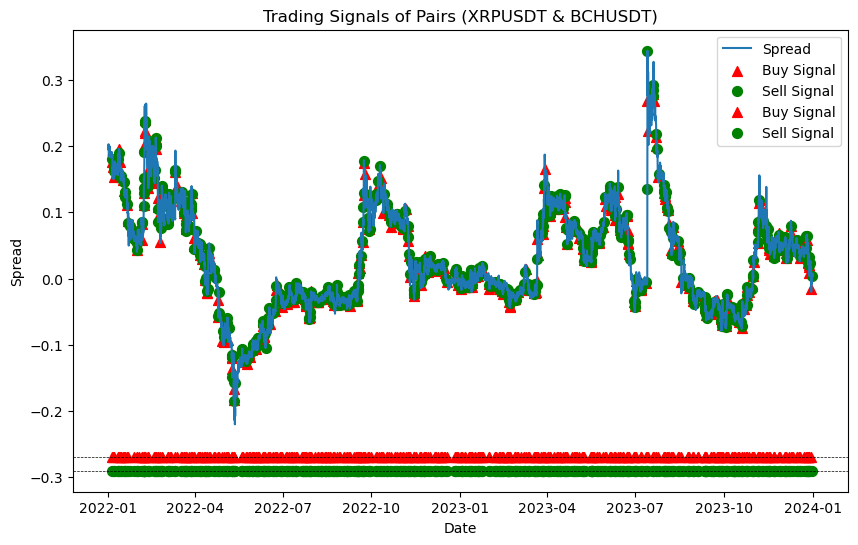

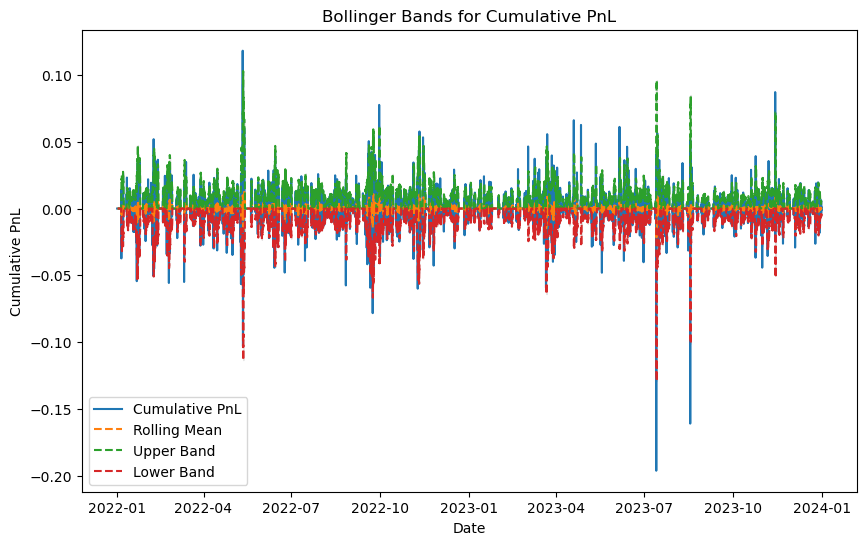

Assets,XRPUSDT,BCHUSDT,beta,intercept,spread,Spread_MA,Spread_Std,zscors,signal,position,return_Y,return_X,position_Y,position_X,hourlypnl,cumpnl,max_cumpnl,stop_loss_signal
Date,,,,,,,,,,,,,,,,,,
2022-01-01 12:00:00,0.8425,438.5,0.001344,0.053213,0.199841,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-01-01 13:00:00,0.8409,437.2,0.001344,0.053485,0.199873,NaN,NaN,NaN,NaN,0.0,-0.001901,-0.002969,0.0,-0.0,0.0,0.000000,0.000000,NaN
2022-01-01 14:00:00,0.8399,440.1,0.001344,0.053755,0.194861,NaN,NaN,NaN,NaN,0.0,-0.001190,0.006611,0.0,-0.0,-0.0,0.000000,0.000000,NaN
2022-01-01 15:00:00,0.8425,441.4,0.001343,0.054026,0.195600,NaN,NaN,NaN,NaN,0.0,0.003091,0.002950,0.0,-0.0,0.0,0.000000,0.000000,NaN
2022-01-01 16:00:00,0.8448,442.7,0.001343,0.054293,0.196041,NaN,NaN,NaN,NaN,0.0,0.002726,0.002941,0.0,-0.0,0.0,0.000000,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 19:00:00,0.6206,261.4,0.001241,0.288718,0.007459,0.009135,0.011676,-0.143558,0.0,0.0,-0.000805,-0.007242,0.0,-0.0,0.0,1.509078,1.539672,NaN
2023-12-31 20:00:00,0.6183,260.5,0.001241,0.288757,0.006281,0.008829,0.011378,-0.223871,0.0,0.0,-0.003713,-0.003449,0.0,-0.0,0.0,1.509078,1.539672,NaN
2023-12-31 21:00:00,0.6193,261.3,0.001241,0.288796,0.006294,0.008610,0.011232,-0.206135,0.0,0.0,0.001616,0.003066,0.0,-0.0,0.0,1.509078,1.539672,NaN


In [96]:
stoploss2_pairs2_train_2223 = \
   bollinger_band_stop_loss(pairs2_train_2223, 'hourlypnl','XRPUSDT','BCHUSDT',boll_window,std_multiplier)
stoploss2_pairs2_train_2223

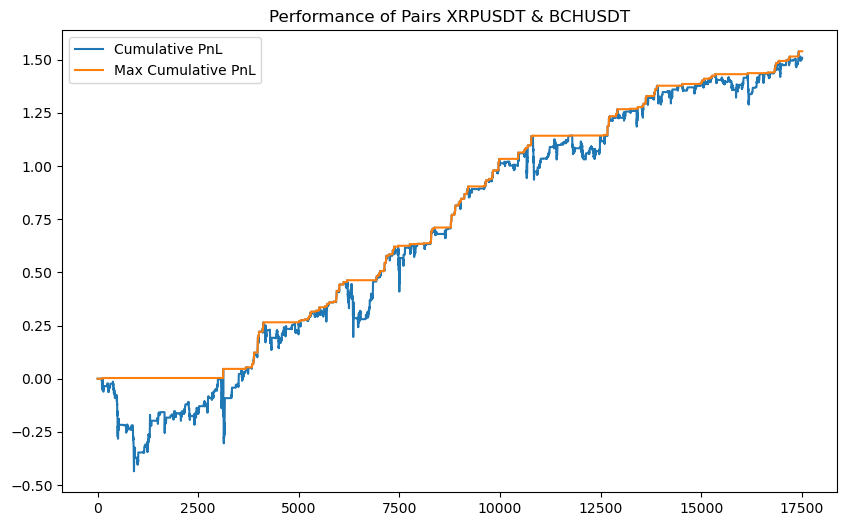

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2022-2023,Strategy 2,1.352549,52.135847,150.907761,-43.863347,-38 days +08:00:00


In [97]:
pairs2_train_2223_stoploss2_performance = \
   pnlPerformance(stoploss2_pairs2_train_2223['hourlypnl'].dropna(),
                 'XRPUSDT & BCHUSDT','Train','2022-2023','Strategy 2')

pairs2_train_2223_stoploss2_performance

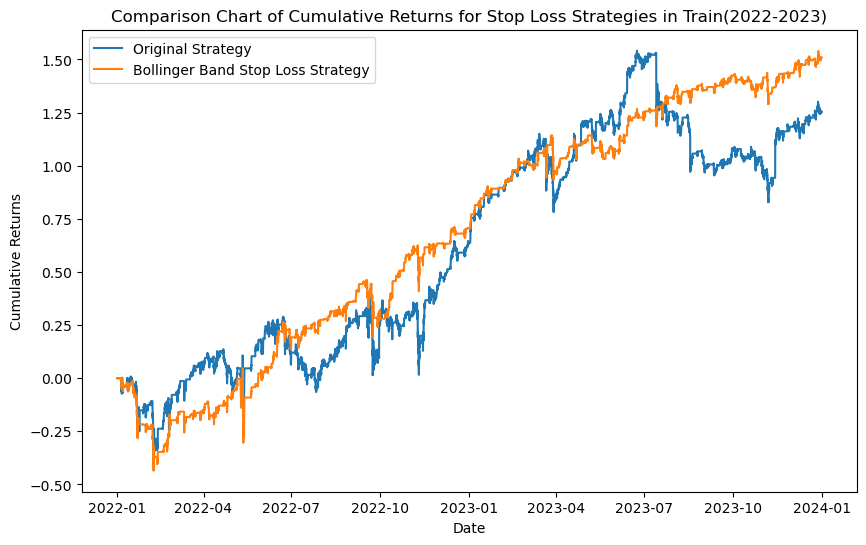

In [98]:
compare_stop_loss_strategies(pairs2_train_2223, stoploss2_pairs2_train_2223, 'cumpnl', 'Train(2022-2023)')

In [99]:
pairs2_train_21 = pairs_2.loc['2020-01-01':'2021-12-31']
pairs2_train_22 = pairs_2.loc['2021-01-01':'2022-12-31']
pairs2_train_23 = pairs_2.loc['2022-01-01':'2023-12-31']

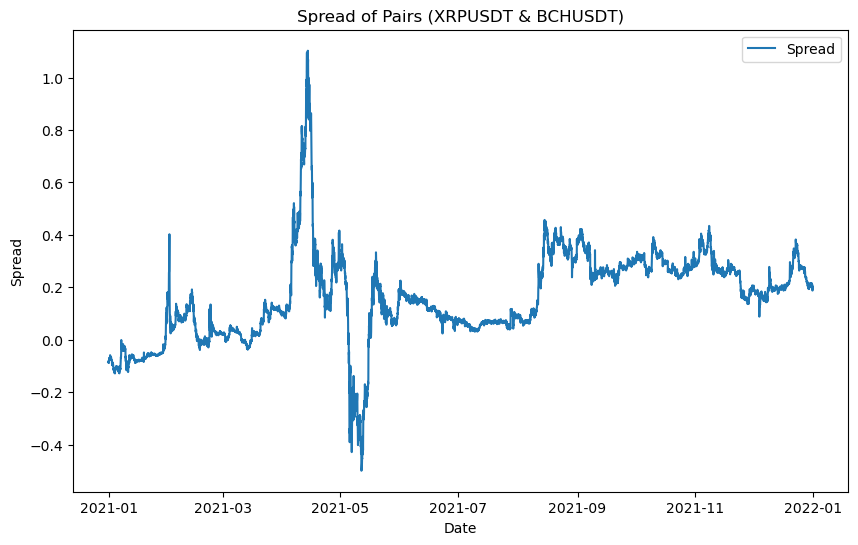

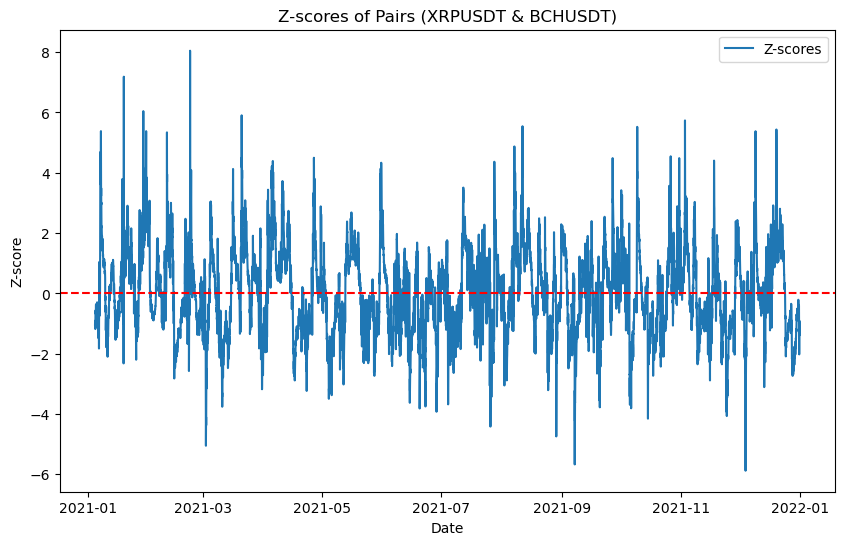

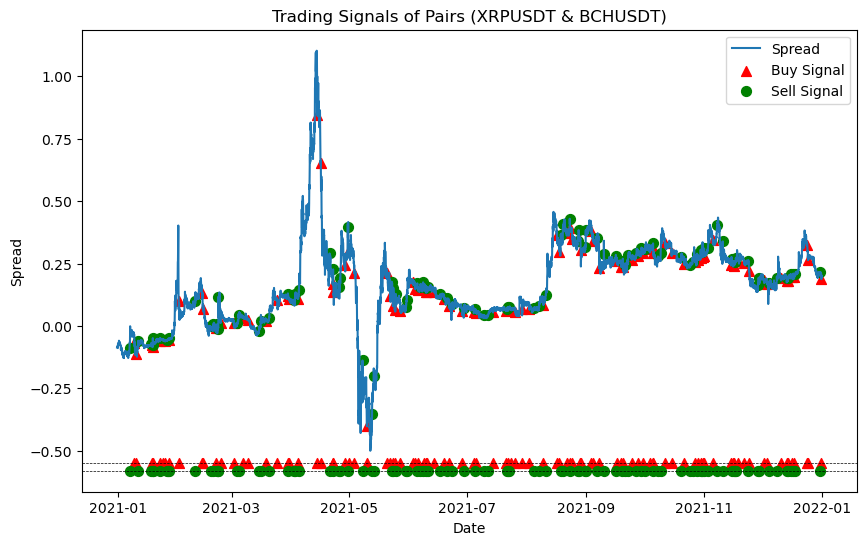

Assets,XRPUSDT,BCHUSDT,beta,intercept,spread,Spread_MA,Spread_Std,zscors,signal,position,return_Y,return_X,position_Y,position_X,hourlypnl,cumpnl,max_cumpnl
Date,,,,,,,,,,,,,,,,,
2020-12-31 17:00:00,0.21814,342.45,0.000648,0.082809,-0.086668,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-12-31 18:00:00,0.21825,342.90,0.000648,0.082877,-0.086822,NaN,NaN,NaN,NaN,0,0.000504,0.001313,0.0,-0.000000,0.000000,0.000000,0.0
2020-12-31 19:00:00,0.21910,342.39,0.000648,0.082944,-0.085614,NaN,NaN,NaN,NaN,0,0.003887,-0.001488,0.0,-0.000000,0.000000,0.000000,0.0
2020-12-31 20:00:00,0.22109,341.34,0.000647,0.083009,-0.082918,NaN,NaN,NaN,NaN,0,0.009042,-0.003071,0.0,-0.000000,0.000000,0.000000,0.0
2020-12-31 21:00:00,0.22448,342.86,0.000647,0.083073,-0.080487,NaN,NaN,NaN,NaN,0,0.015217,0.004443,0.0,-0.000000,0.000000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-31 19:00:00,0.80340,420.20,0.001350,0.048521,0.187443,0.213440,0.012853,-2.022594,1.0,1,-0.024589,-0.023287,0.0,-0.000000,0.000000,-1.550267,0.0
2021-12-31 20:00:00,0.81320,420.50,0.001350,0.048802,0.196712,0.212930,0.012591,-1.288108,NaN,1,0.012124,0.000714,1.0,-0.001350,0.012123,-1.538144,0.0
2021-12-31 21:00:00,0.82820,428.10,0.001350,0.049083,0.201329,0.212492,0.012295,-0.907967,NaN,1,0.018278,0.017912,1.0,-0.001350,0.018253,-1.519890,0.0


In [100]:
pairs2_train_21 = \
   pairs_trading_strategy(pairs2_train_21,'XRPUSDT','BCHUSDT',
                          z_signal_in, z_signal_out, min_spread, MA_window, OLS_window
                         )
pairs2_train_21

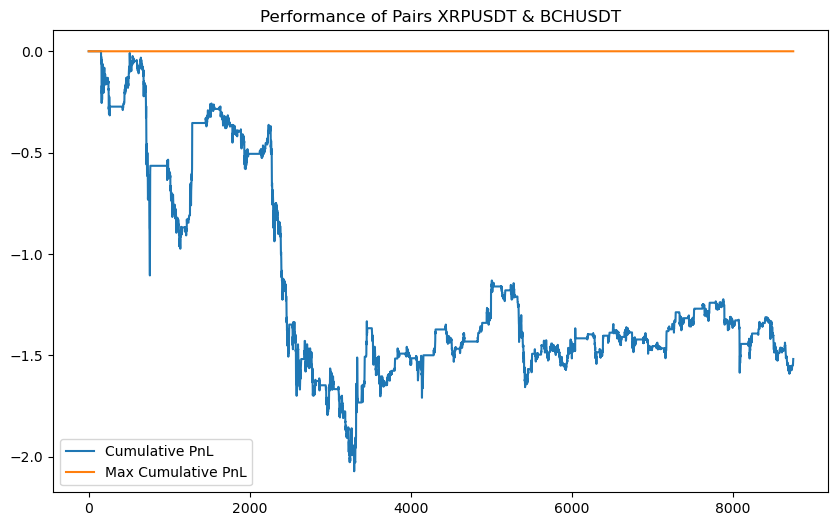

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2021,No,-1.017756,-104.894237,-151.80874,-207.200261,-138 days +07:00:00


In [101]:
pairs2_train_21_performance = \
   pnlPerformance(pairs2_train_21['hourlypnl'].dropna(),
                  'XRPUSDT & BCHUSDT','Train','2021','No')
pairs2_train_21_performance

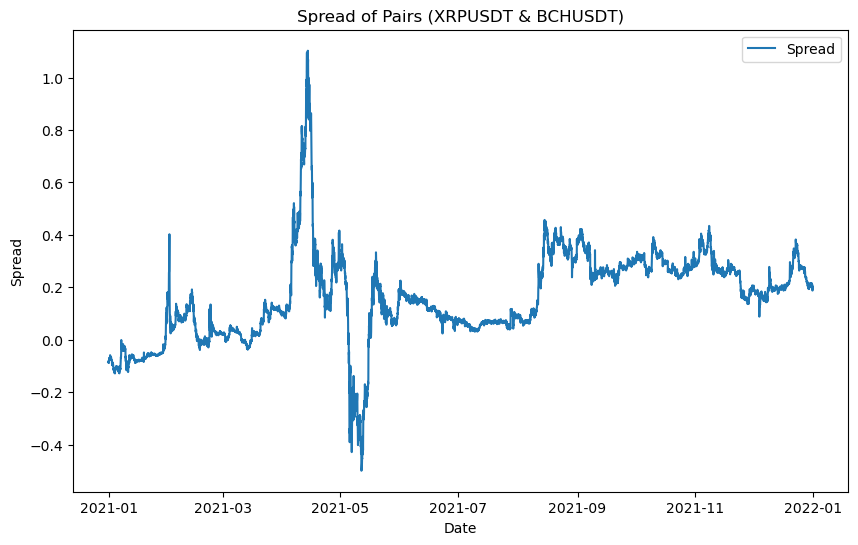

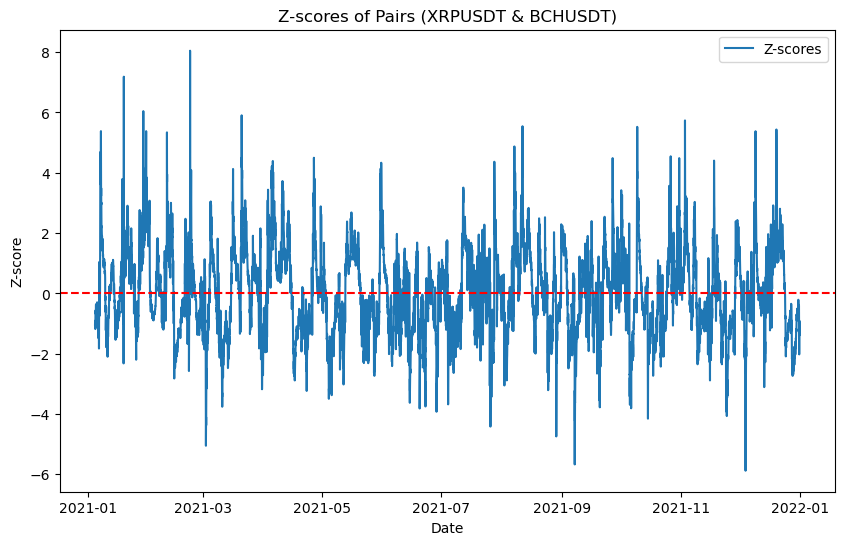

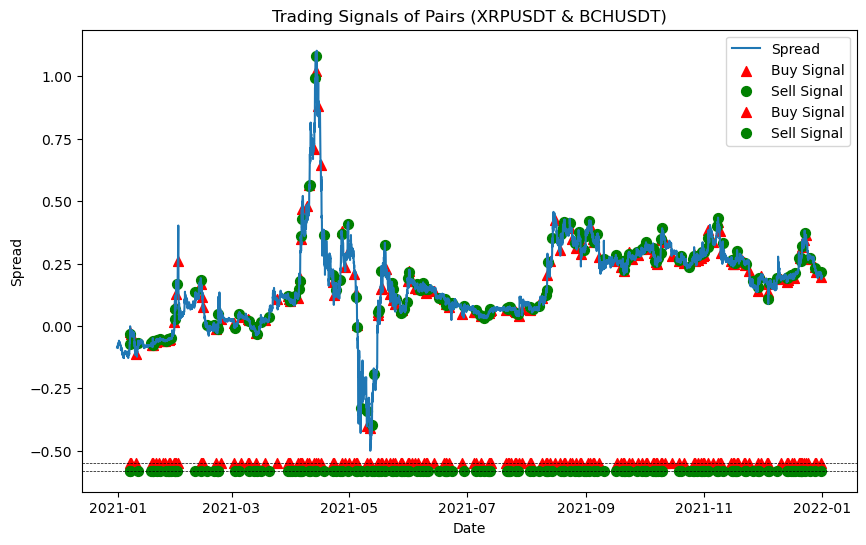

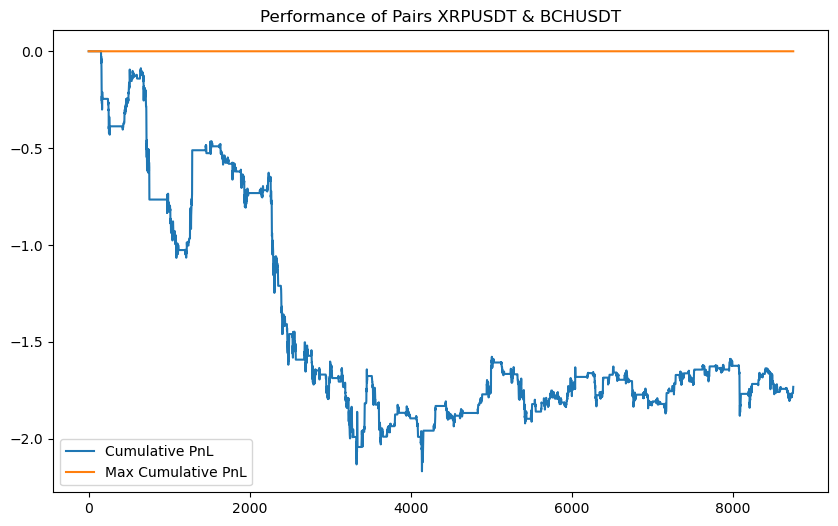

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2021,Strategy1,-1.373676,-119.694748,-173.228858,-216.807407,-173 days +05:00:00


In [102]:
stoploss1_pairs2_train_21 = stop_loss_strategy1(pairs2_train_21, 'XRPUSDT','BCHUSDT','XRPUSDT','BCHUSDT',num_consecutive_losses=4)
pairs2_train_21_stoploss1_performance = \
   pnlPerformance(stoploss1_pairs2_train_21['hourlypnl'].dropna(),
                  'XRPUSDT & BCHUSDT','Train','2021','Strategy1')
pairs2_train_21_stoploss1_performance

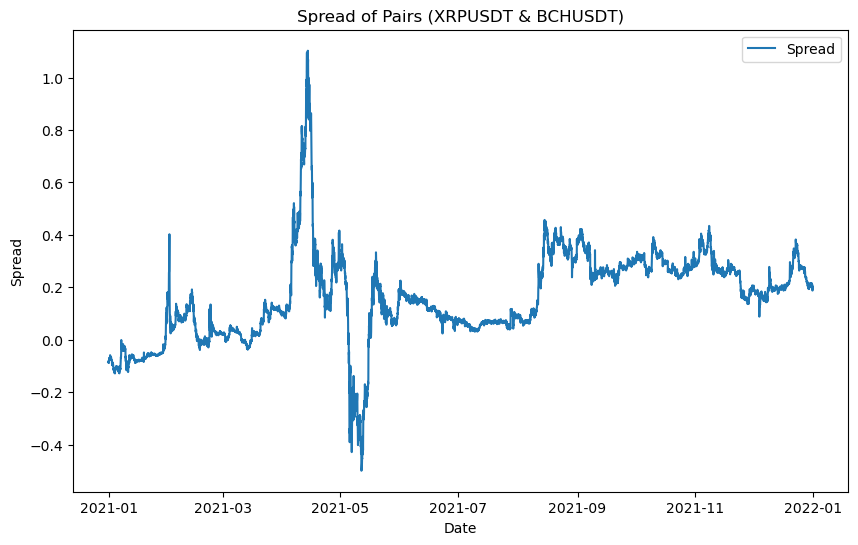

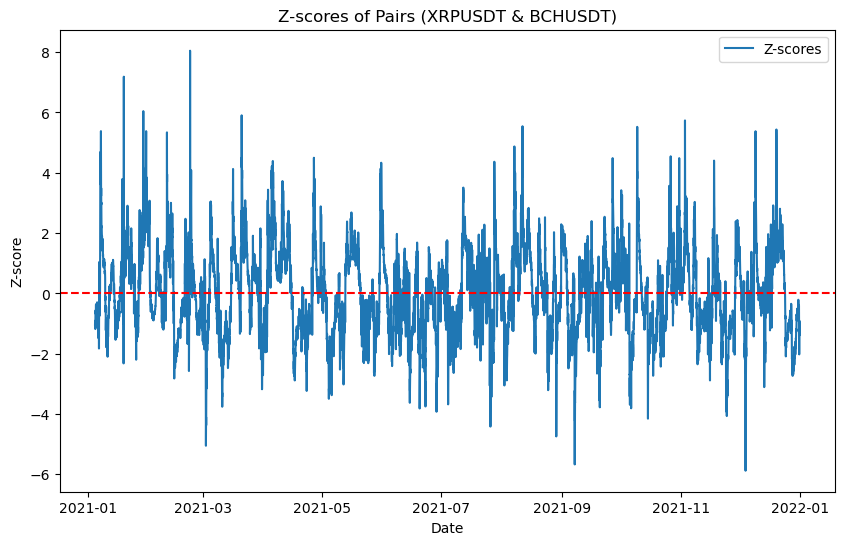

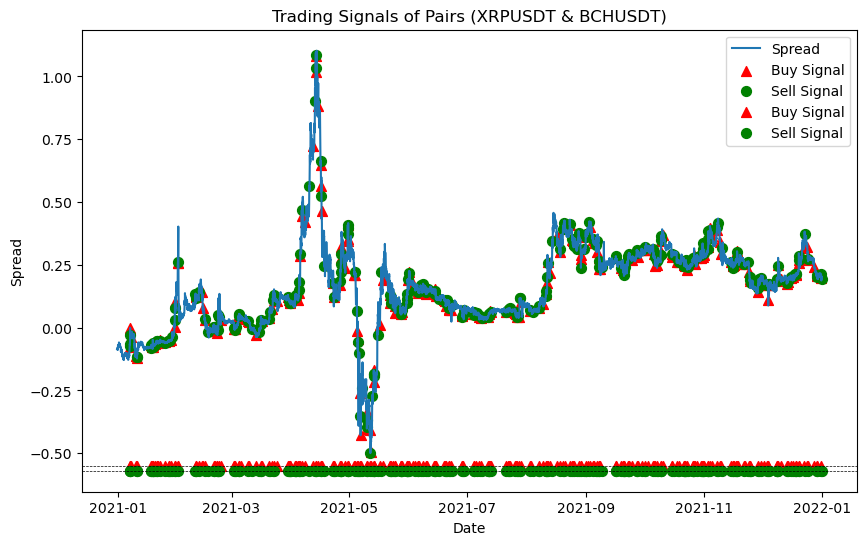

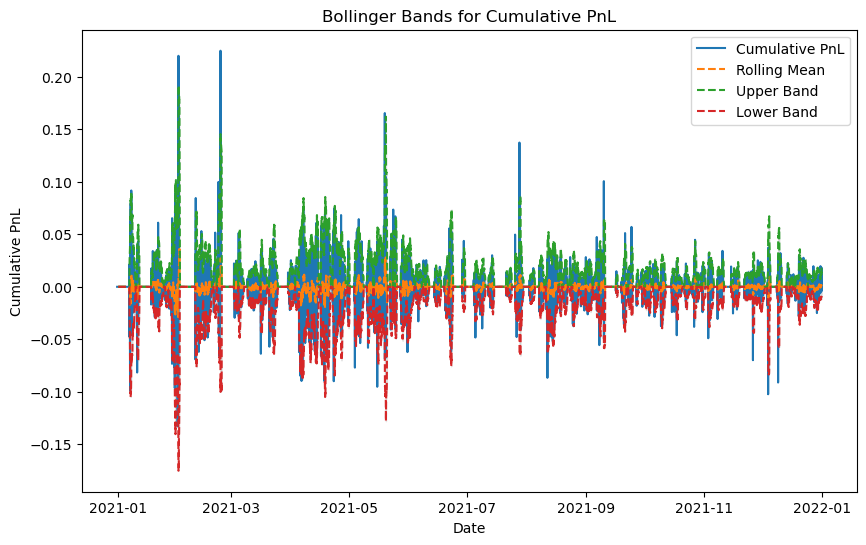

Assets,XRPUSDT,BCHUSDT,beta,intercept,spread,Spread_MA,Spread_Std,zscors,signal,position,return_Y,return_X,position_Y,position_X,hourlypnl,cumpnl,max_cumpnl,stop_loss_signal
Date,,,,,,,,,,,,,,,,,,
2020-12-31 17:00:00,0.21814,342.45,0.000648,0.082809,-0.086668,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-12-31 18:00:00,0.21825,342.90,0.000648,0.082877,-0.086822,NaN,NaN,NaN,NaN,0.0,0.000504,0.001313,0.0,-0.00000,0.000000,0.000000,0.000000,NaN
2020-12-31 19:00:00,0.21910,342.39,0.000648,0.082944,-0.085614,NaN,NaN,NaN,NaN,0.0,0.003887,-0.001488,0.0,-0.00000,0.000000,0.000000,0.000000,NaN
2020-12-31 20:00:00,0.22109,341.34,0.000647,0.083009,-0.082918,NaN,NaN,NaN,NaN,0.0,0.009042,-0.003071,0.0,-0.00000,0.000000,0.000000,0.000000,NaN
2020-12-31 21:00:00,0.22448,342.86,0.000647,0.083073,-0.080487,NaN,NaN,NaN,NaN,0.0,0.015217,0.004443,0.0,-0.00000,0.000000,0.000000,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-31 19:00:00,0.80340,420.20,0.001350,0.048521,0.187443,0.213440,0.012853,-2.022594,1.0,0.0,-0.024589,-0.023287,0.0,-0.00000,0.000000,0.078503,0.219637,NaN
2021-12-31 20:00:00,0.81320,420.50,0.001350,0.048802,0.196712,0.212930,0.012591,-1.288108,NaN,1.0,0.012124,0.000714,1.0,-0.00135,0.012123,0.090626,0.219637,NaN
2021-12-31 21:00:00,0.82820,428.10,0.001350,0.049083,0.201329,0.212492,0.012295,-0.907967,0.0,1.0,0.018278,0.017912,1.0,-0.00135,0.018253,0.108879,0.219637,0.0


In [103]:
stoploss2_pairs2_train_21 = \
   bollinger_band_stop_loss(pairs2_train_21, 'hourlypnl','XRPUSDT','BCHUSDT',boll_window,std_multiplier)
stoploss2_pairs2_train_21

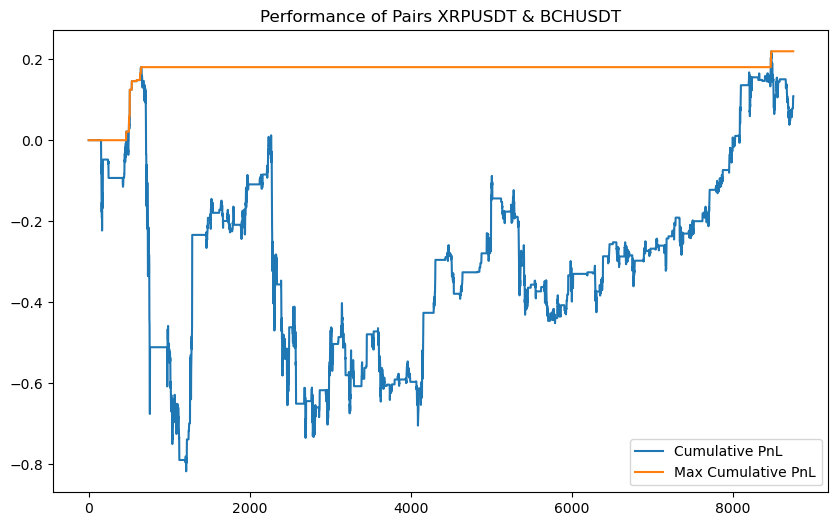

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2021,Strategy2,0.096735,7.523169,10.887946,-99.834676,-51 days +12:00:00


In [104]:
pairs2_train_21_stoploss2_performance = \
   pnlPerformance(stoploss2_pairs2_train_21['hourlypnl'].dropna(),
                 'XRPUSDT & BCHUSDT','Train','2021','Strategy2')
pairs2_train_21_stoploss2_performance

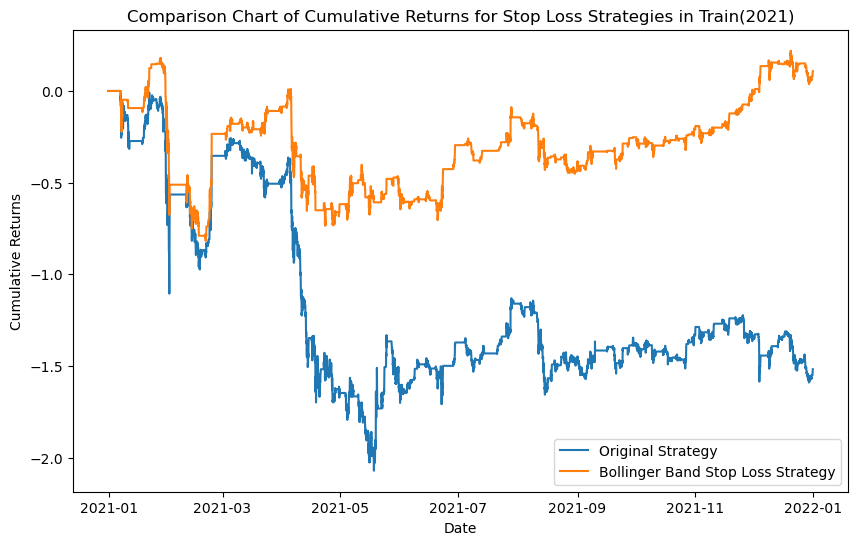

In [105]:
compare_stop_loss_strategies(pairs2_train_21, stoploss2_pairs2_train_21, 'cumpnl', 'Train(2021)')

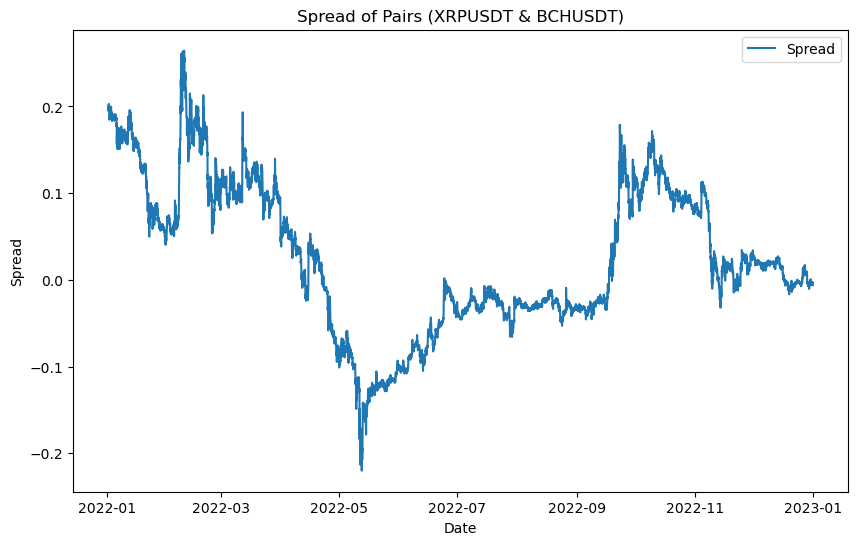

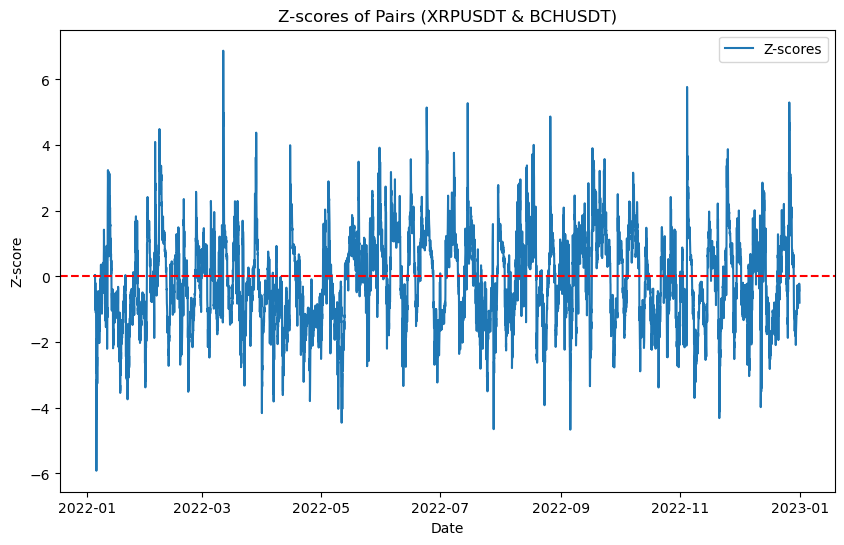

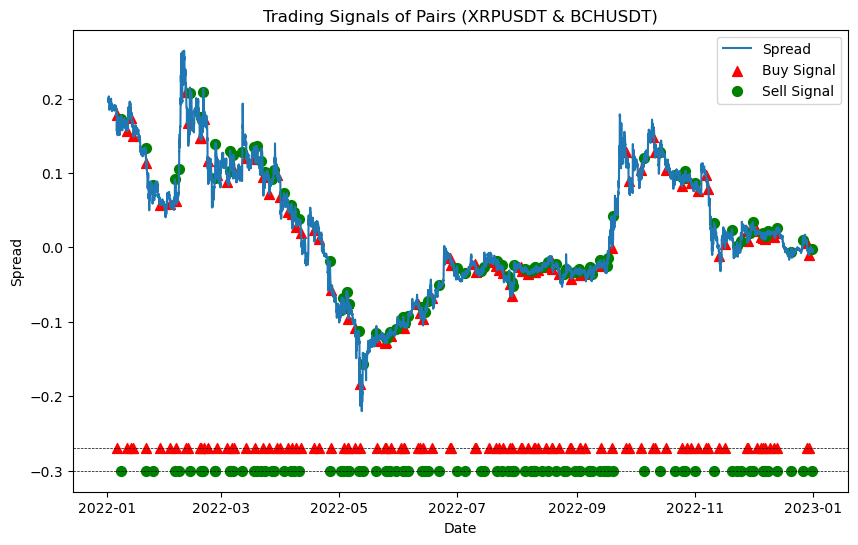

Assets,XRPUSDT,BCHUSDT,beta,intercept,spread,Spread_MA,Spread_Std,zscors,signal,position,return_Y,return_X,position_Y,position_X,hourlypnl,cumpnl,max_cumpnl
Date,,,,,,,,,,,,,,,,,
2022-01-01 12:00:00,0.8425,438.5,0.001344,0.053213,0.199841,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-01-01 13:00:00,0.8409,437.2,0.001344,0.053485,0.199873,NaN,NaN,NaN,NaN,0,-0.001901,-0.002969,0.0,-0.000000,0.000000,0.000000,0.000000
2022-01-01 14:00:00,0.8399,440.1,0.001344,0.053755,0.194861,NaN,NaN,NaN,NaN,0,-0.001190,0.006611,0.0,-0.000000,-0.000000,0.000000,0.000000
2022-01-01 15:00:00,0.8425,441.4,0.001343,0.054026,0.195600,NaN,NaN,NaN,NaN,0,0.003091,0.002950,0.0,-0.000000,0.000000,0.000000,0.000000
2022-01-01 16:00:00,0.8448,442.7,0.001343,0.054293,0.196041,NaN,NaN,NaN,NaN,0,0.002726,0.002941,0.0,-0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31 19:00:00,0.3427,97.2,0.001660,0.183983,-0.002589,-0.001375,0.005496,-0.220870,0.0,0,0.003508,0.000000,1.0,-0.001659,0.003508,0.637024,0.645134
2022-12-31 20:00:00,0.3429,97.6,0.001660,0.183957,-0.003043,-0.001509,0.005385,-0.284798,NaN,0,0.000583,0.004107,0.0,-0.000000,0.000000,0.637024,0.645134
2022-12-31 21:00:00,0.3420,97.2,0.001660,0.183930,-0.003269,-0.001620,0.005317,-0.310191,NaN,0,-0.002628,-0.004107,0.0,-0.000000,0.000000,0.637024,0.645134


In [106]:
pairs2_train_22 = \
   pairs_trading_strategy(pairs2_train_22,'XRPUSDT','BCHUSDT',
                          z_signal_in, z_signal_out, min_spread, MA_window, OLS_window
                         )
pairs2_train_22

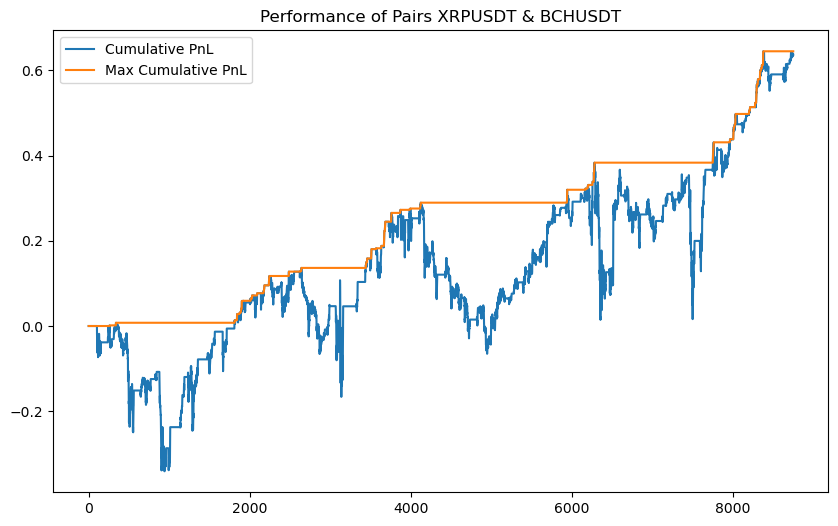

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2022,No,0.756918,44.046209,63.702412,-36.886213,-265 days +07:00:00


In [107]:
pairs2_train_22_performance = \
   pnlPerformance(pairs2_train_22['hourlypnl'].dropna(),'XRPUSDT & BCHUSDT','Train','2022','No')
pairs2_train_22_performance

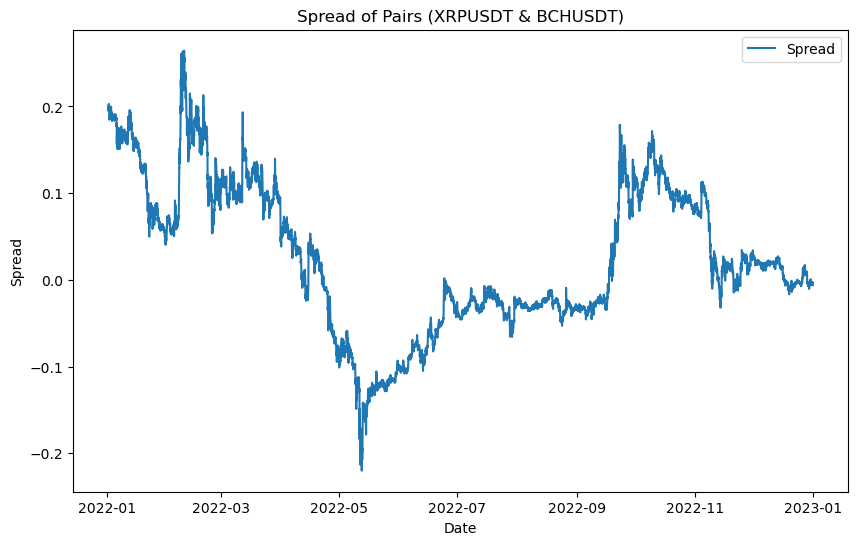

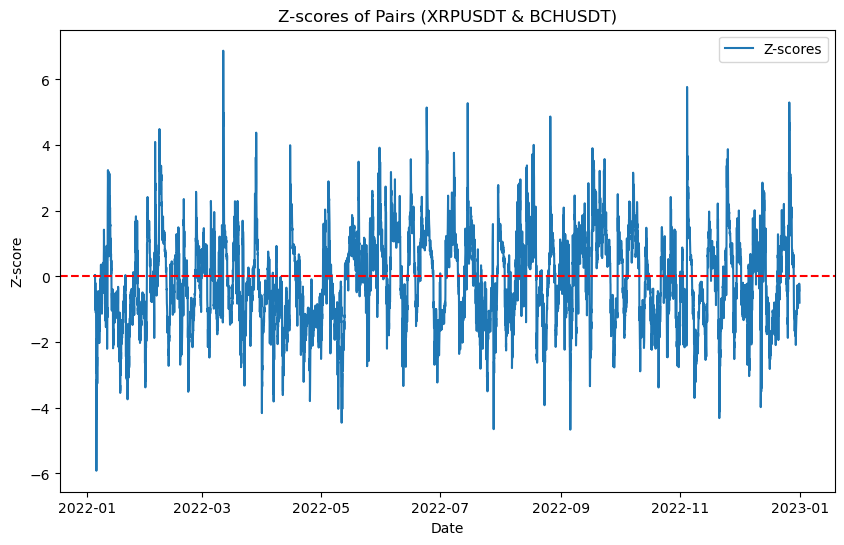

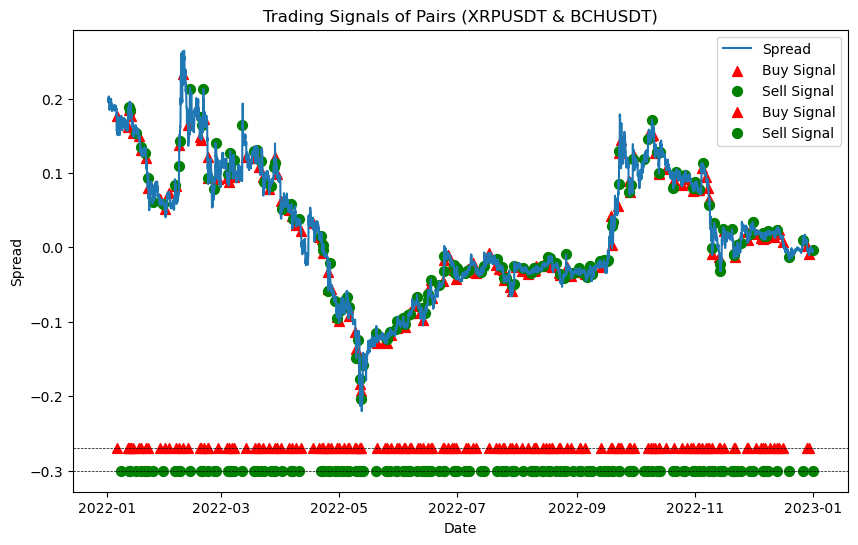

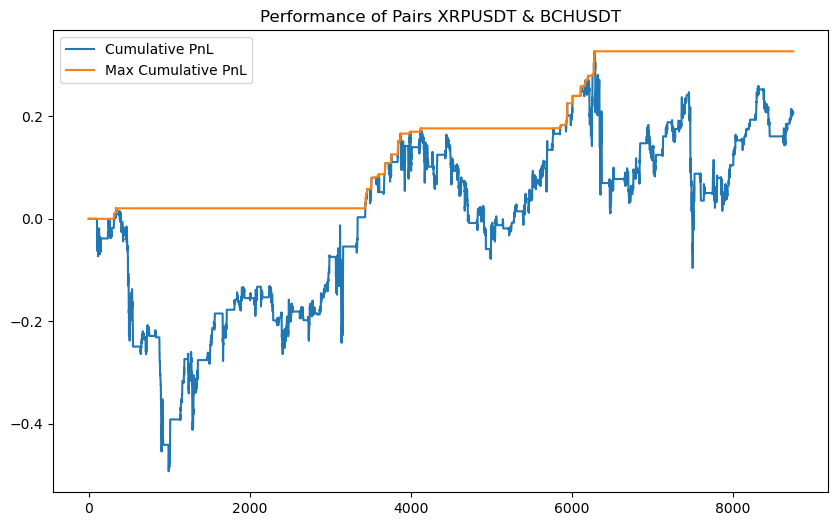

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2022,Strategy1,0.2807,14.310007,20.696036,-51.30478,-42 days +15:00:00


In [108]:
stoploss1_pairs2_train_22 = stop_loss_strategy1(pairs2_train_22, 'XRPUSDT','BCHUSDT','XRPUSDT','BCHUSDT',num_consecutive_losses=4)
pairs2_train_22_stoploss1_performance = \
   pnlPerformance(stoploss1_pairs2_train_22['hourlypnl'].dropna(),
                  'XRPUSDT & BCHUSDT','Train','2022','Strategy1')
pairs2_train_22_stoploss1_performance

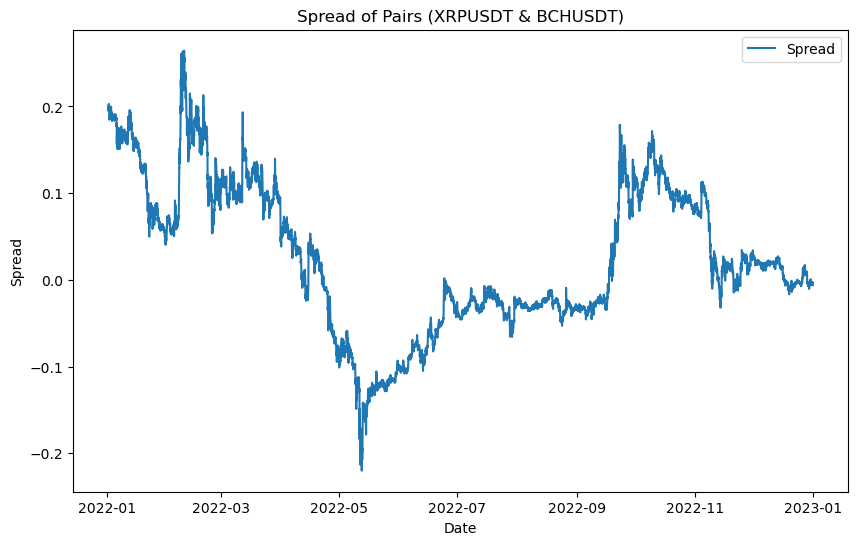

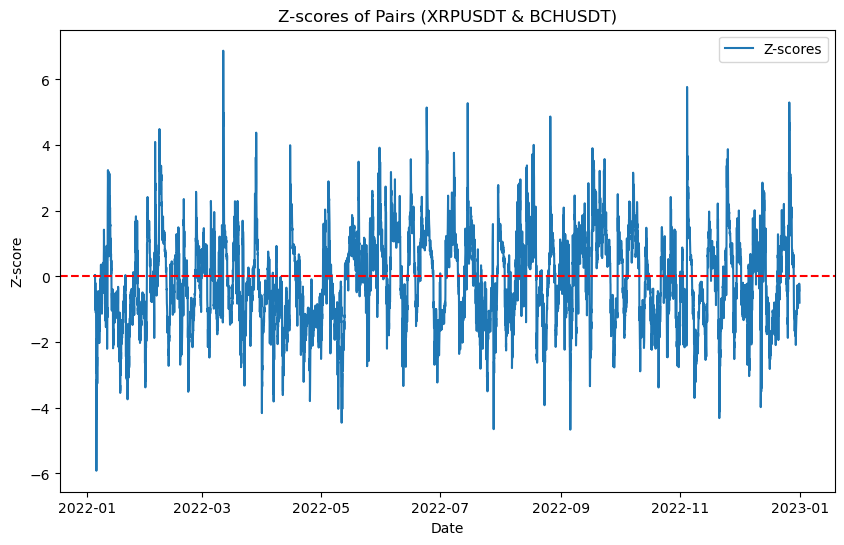

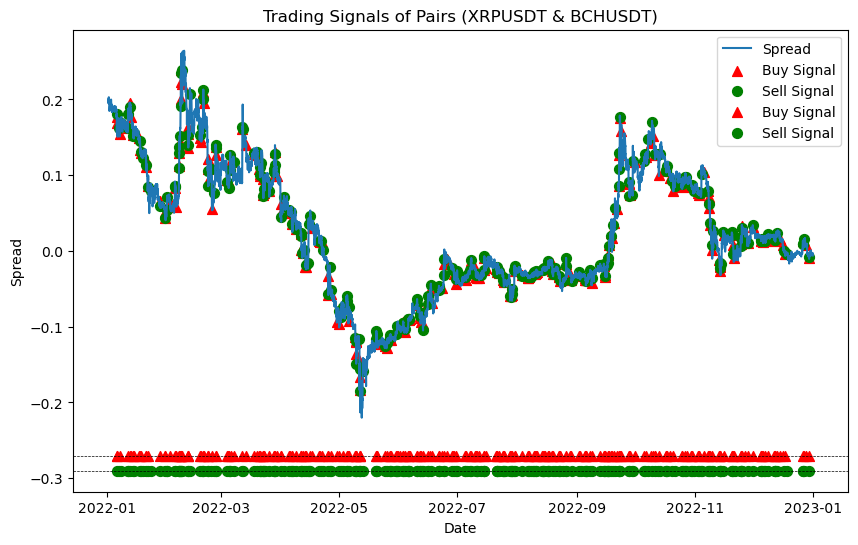

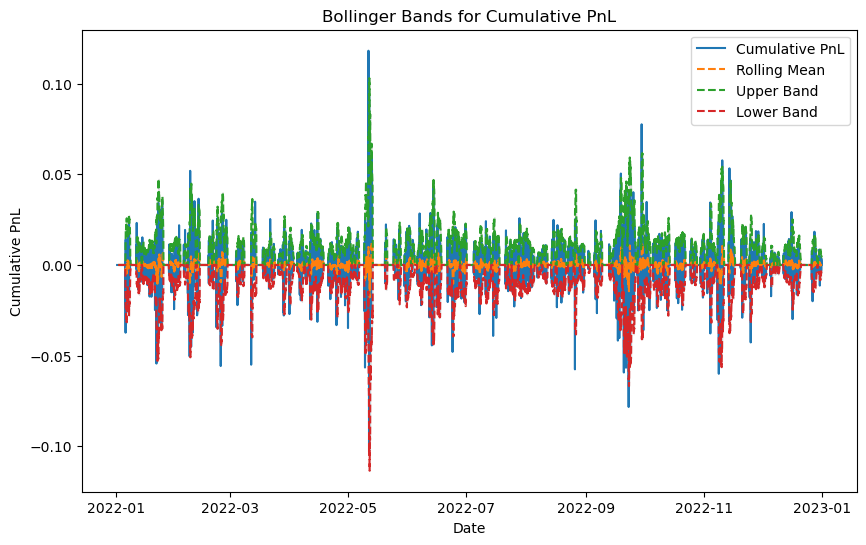

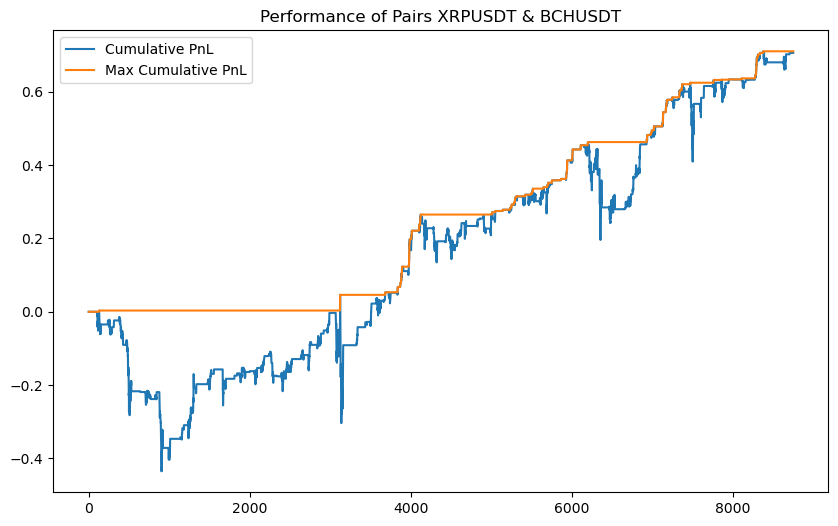

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2022,Strategy2,1.100226,48.84769,70.646618,-43.863347,-38 days +08:00:00


In [109]:
stoploss2_pairs2_train_22 = \
   bollinger_band_stop_loss(pairs2_train_22, 'hourlypnl','XRPUSDT','BCHUSDT',boll_window,std_multiplier)
pairs2_train_22_stoploss2_performance = \
   pnlPerformance(stoploss2_pairs2_train_22['hourlypnl'].dropna(),
                  'XRPUSDT & BCHUSDT','Train','2022','Strategy2')
pairs2_train_22_stoploss2_performance

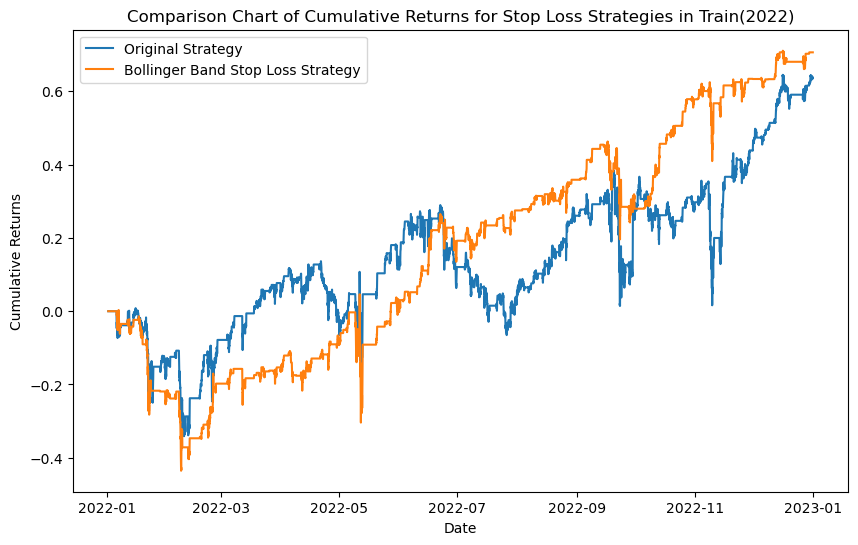

In [110]:
compare_stop_loss_strategies(pairs2_train_22, stoploss2_pairs2_train_22, 'cumpnl', 'Train(2022)')

In [111]:
pairs2_train_23

Assets,XRPUSDT,BCHUSDT
Date,,
2022-01-01 00:00:00,0.8395,434.8
2022-01-01 01:00:00,0.8396,435.3
2022-01-01 02:00:00,0.8425,434.9
2022-01-01 03:00:00,0.8410,435.2
2022-01-01 04:00:00,0.8346,432.8
...,...,...
2023-12-31 19:00:00,0.6206,261.4
2023-12-31 20:00:00,0.6183,260.5
2023-12-31 21:00:00,0.6193,261.3


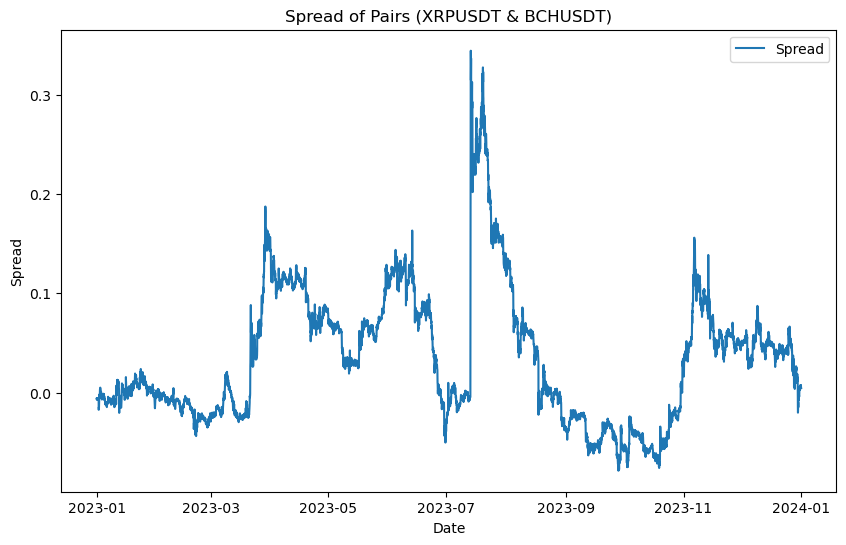

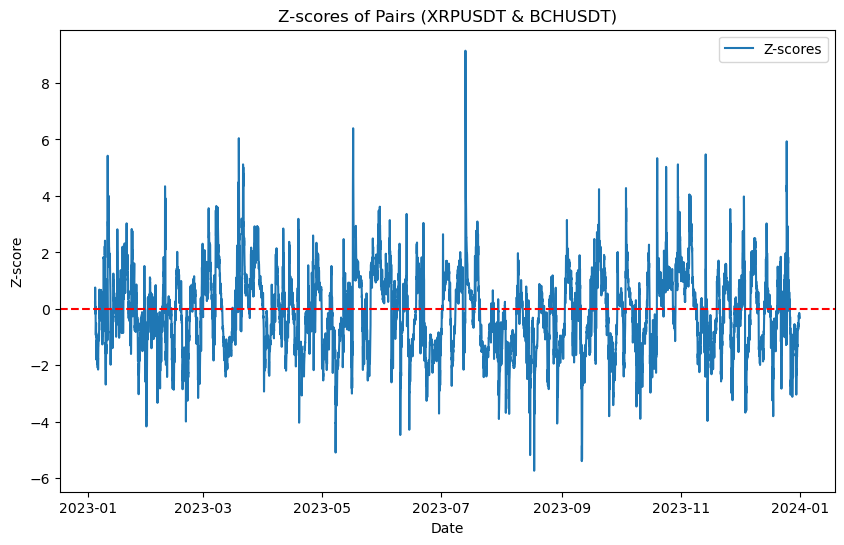

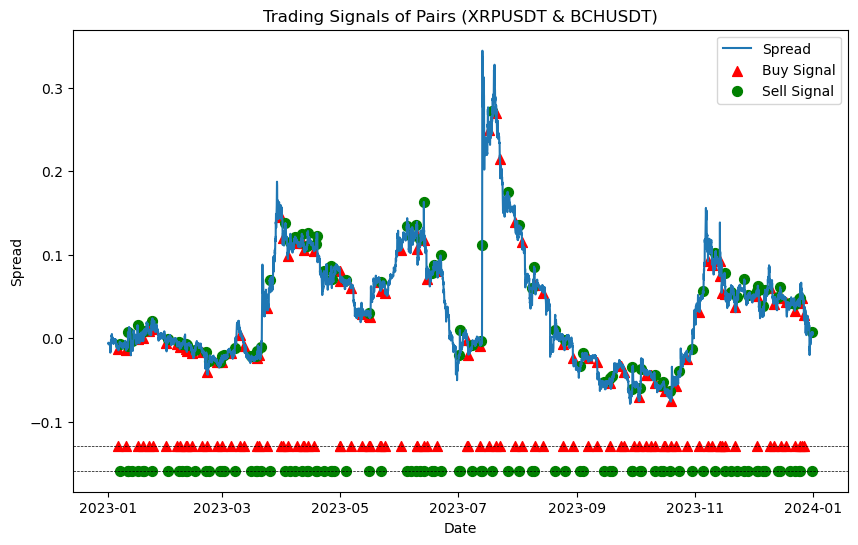

Assets,XRPUSDT,BCHUSDT,beta,intercept,spread,Spread_MA,Spread_Std,zscors,signal,position,return_Y,return_X,position_Y,position_X,hourlypnl,cumpnl,max_cumpnl
Date,,,,,,,,,,,,,,,,,
2022-12-31 23:00:00,0.3389,97.0,0.001660,0.183872,-0.006015,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-01 00:00:00,0.3385,96.4,0.001660,0.183843,-0.005408,NaN,NaN,NaN,NaN,0,-0.001181,-0.006205,0.0,-0.0,0.0,0.000000,0.000000
2023-01-01 01:00:00,0.3387,96.5,0.001661,0.183815,-0.005362,NaN,NaN,NaN,NaN,0,0.000591,0.001037,0.0,-0.0,0.0,0.000000,0.000000
2023-01-01 02:00:00,0.3380,96.6,0.001661,0.183787,-0.006218,NaN,NaN,NaN,NaN,0,-0.002069,0.001036,0.0,-0.0,-0.0,0.000000,0.000000
2023-01-01 03:00:00,0.3381,96.5,0.001661,0.183759,-0.005940,NaN,NaN,NaN,NaN,0,0.000296,-0.001036,0.0,-0.0,0.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 19:00:00,0.6206,261.4,0.001241,0.288718,0.007459,0.009135,0.011676,-0.143558,0.0,0,-0.000805,-0.007242,0.0,-0.0,0.0,0.497774,0.787309
2023-12-31 20:00:00,0.6183,260.5,0.001241,0.288757,0.006281,0.008829,0.011378,-0.223871,0.0,0,-0.003713,-0.003449,0.0,-0.0,0.0,0.497774,0.787309
2023-12-31 21:00:00,0.6193,261.3,0.001241,0.288796,0.006294,0.008610,0.011232,-0.206135,0.0,0,0.001616,0.003066,0.0,-0.0,0.0,0.497774,0.787309


In [112]:
pairs2_train_23 = \
   pairs_trading_strategy(pairs2_train_23,'XRPUSDT','BCHUSDT',
                          z_signal_in, z_signal_out, min_spread, MA_window, OLS_window
                         )
pairs2_train_23

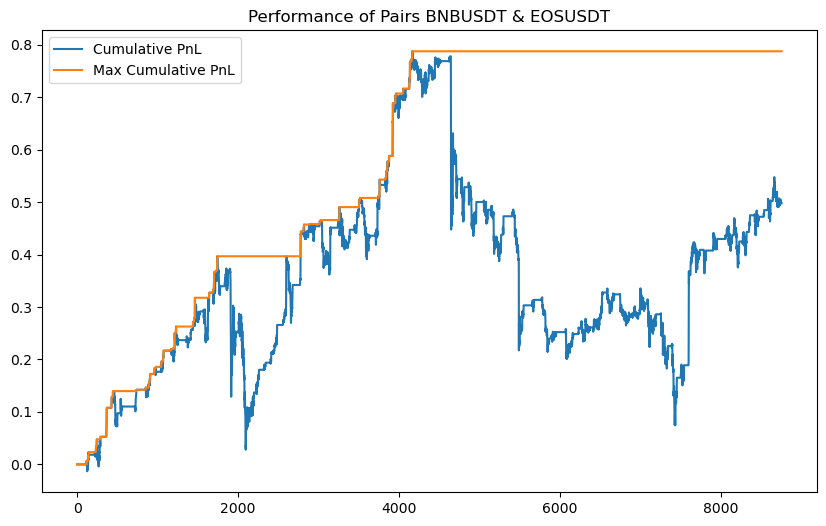

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2023,No,0.705125,34.370759,49.777361,-71.267322,-310 days +03:00:00


In [113]:
pairs2_train_23_performance = \
   pnlPerformance(pairs2_train_23['hourlypnl'].dropna(),'BNBUSDT & EOSUSDT','Train','2023','No')
pairs2_train_23_performance

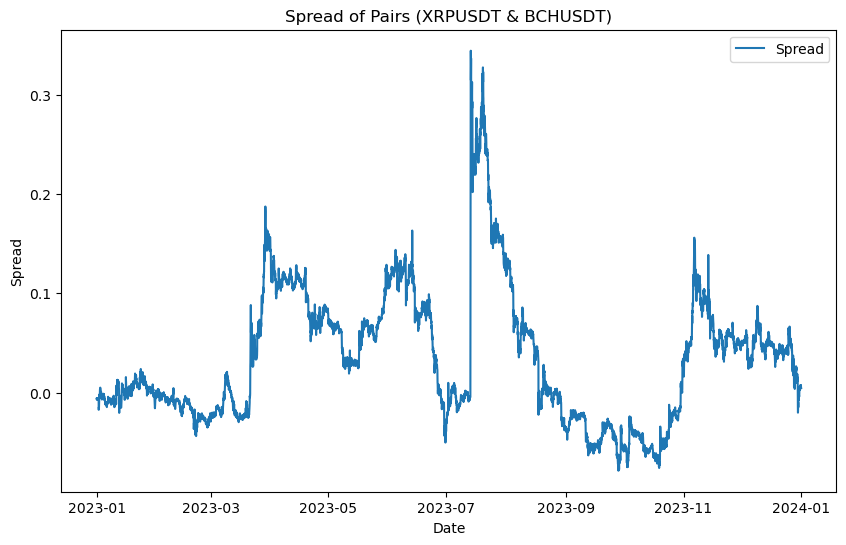

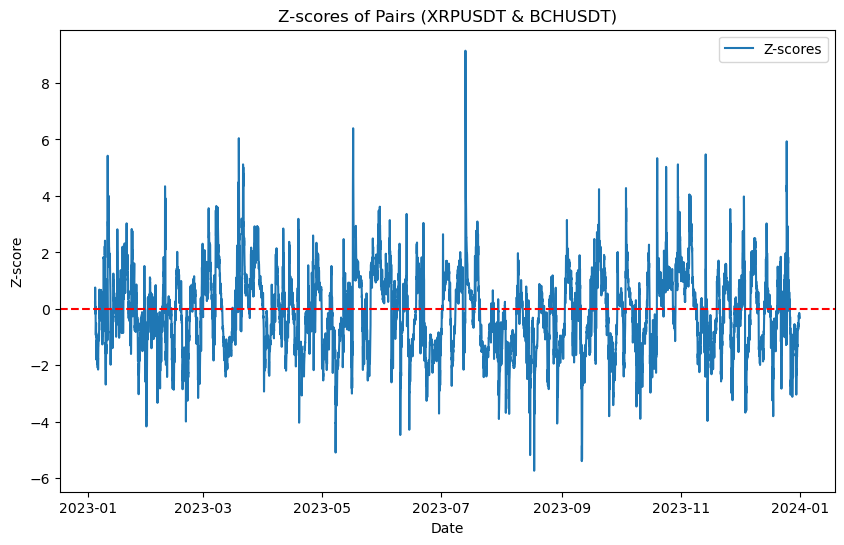

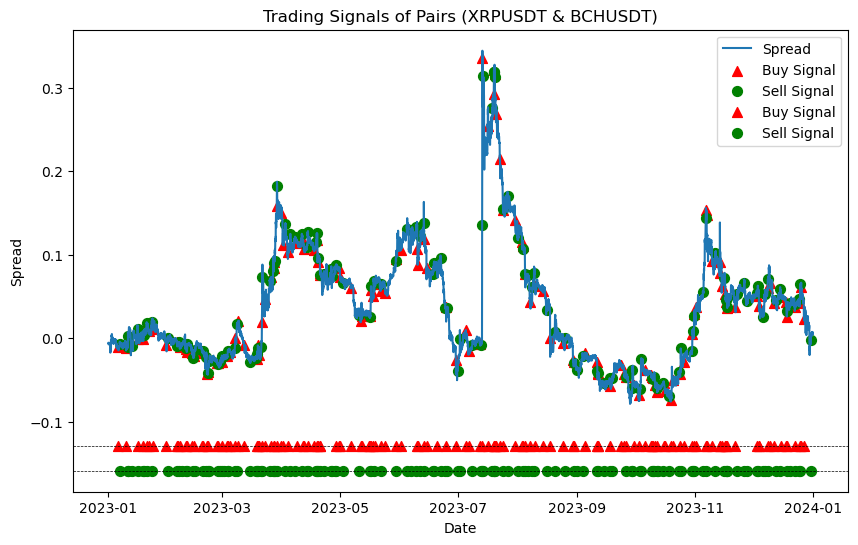

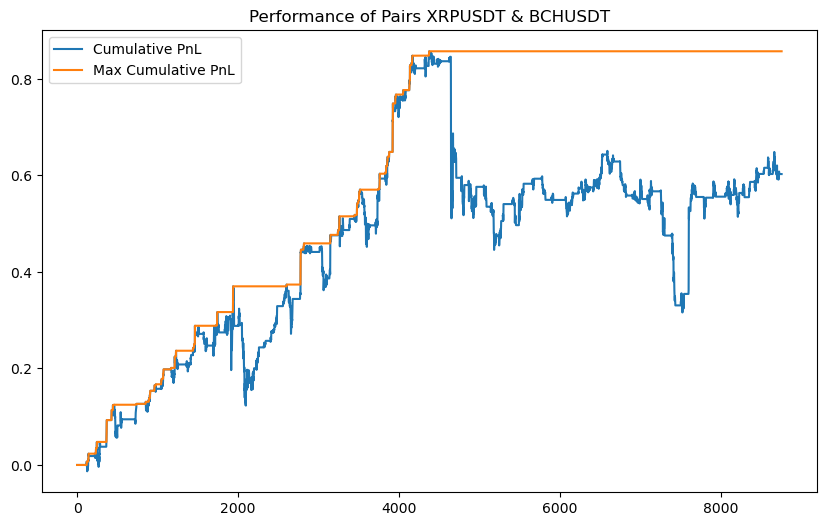

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2023,Strategy1,0.984536,41.630078,60.29065,-54.134008,-314 days +10:00:00


In [114]:
stoploss1_pairs2_train_23 = stop_loss_strategy1(pairs2_train_23, 'XRPUSDT','BCHUSDT','XRPUSDT','BCHUSDT',num_consecutive_losses=4)
pairs2_train_23_stoploss1_performance = \
   pnlPerformance(stoploss1_pairs2_train_23['hourlypnl'].dropna(),
                 'XRPUSDT & BCHUSDT','Train','2023','Strategy1')
pairs2_train_23_stoploss1_performance

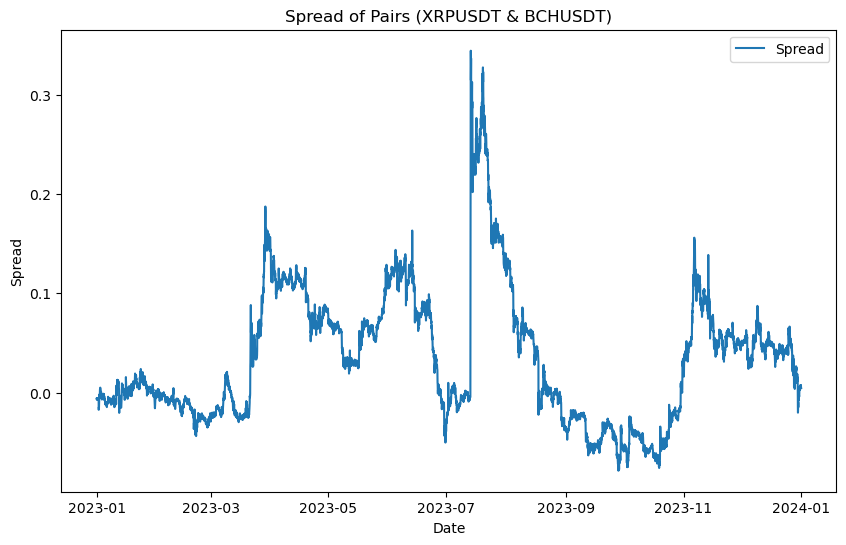

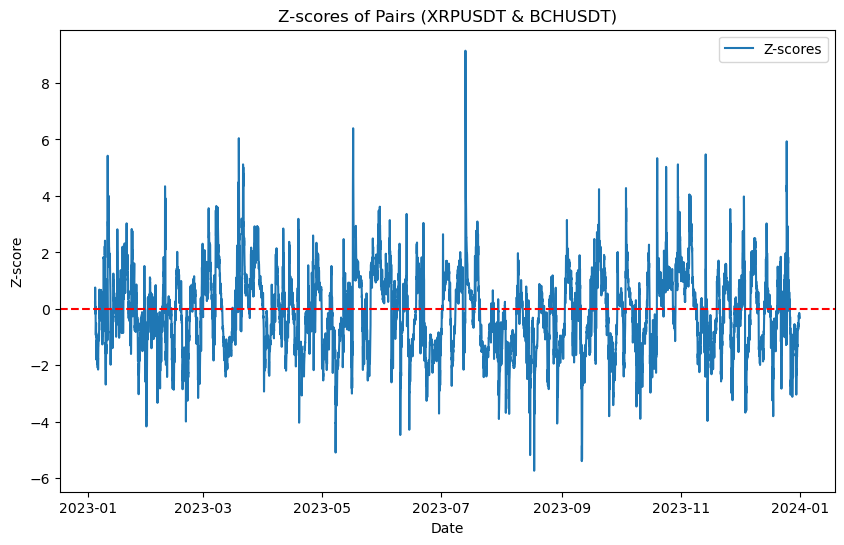

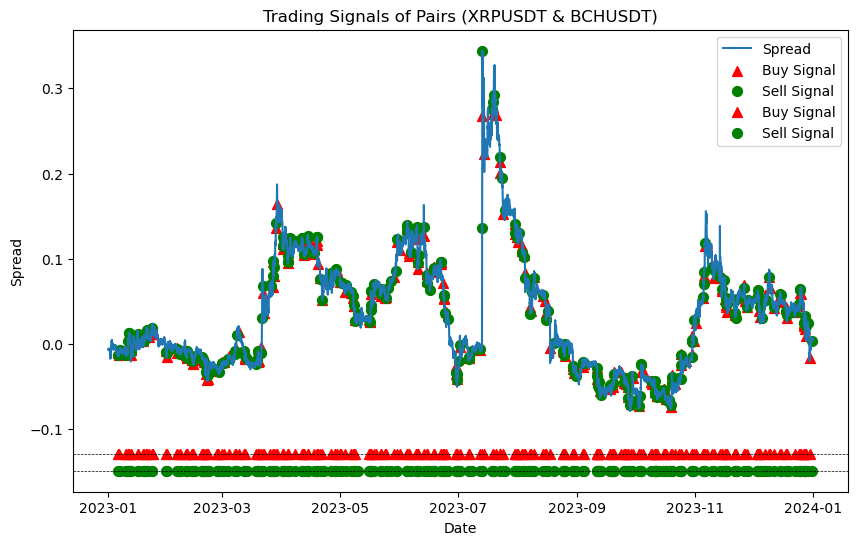

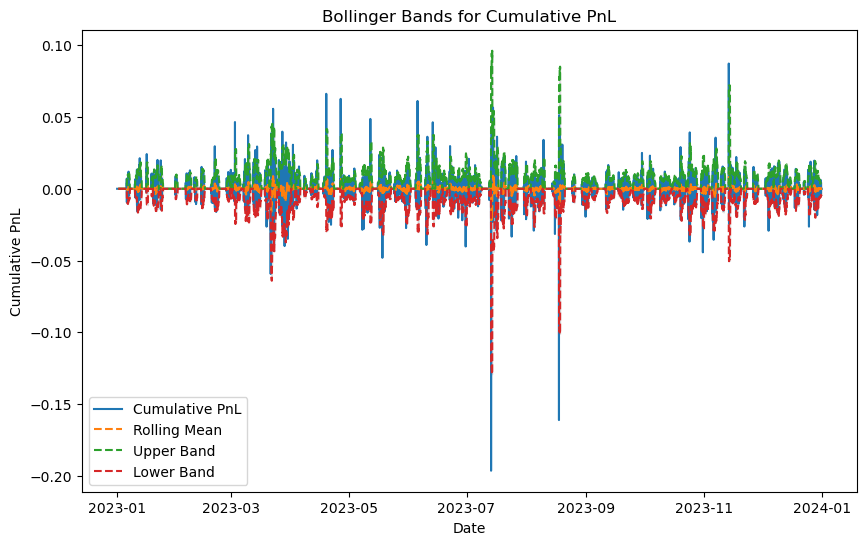

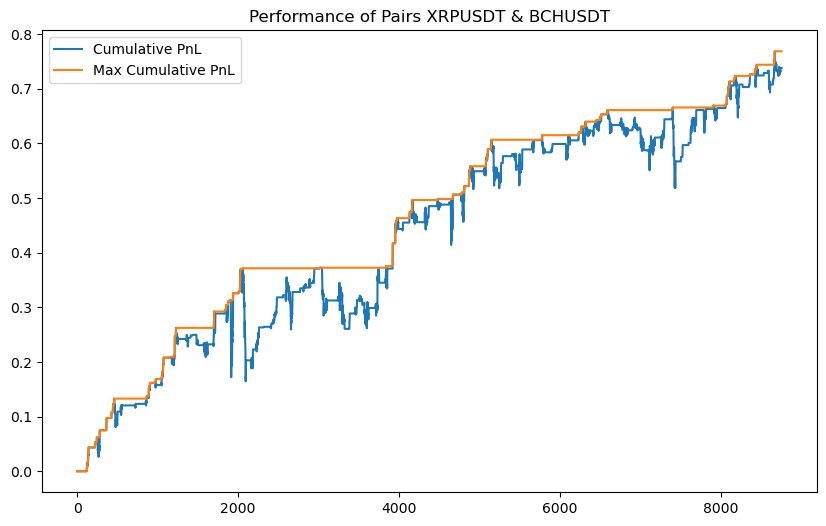

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2023,Strategy2,1.614497,50.956881,73.798168,-20.683336,-88 days +15:00:00


In [115]:
stoploss2_pairs2_train_23 = \
   bollinger_band_stop_loss(pairs2_train_23, 'hourlypnl','XRPUSDT','BCHUSDT',boll_window,std_multiplier)
pairs2_train_23_stoploss2_performance = \
   pnlPerformance(stoploss2_pairs2_train_23['hourlypnl'].dropna(),
                  'XRPUSDT & BCHUSDT','Train','2023','Strategy2')
pairs2_train_23_stoploss2_performance

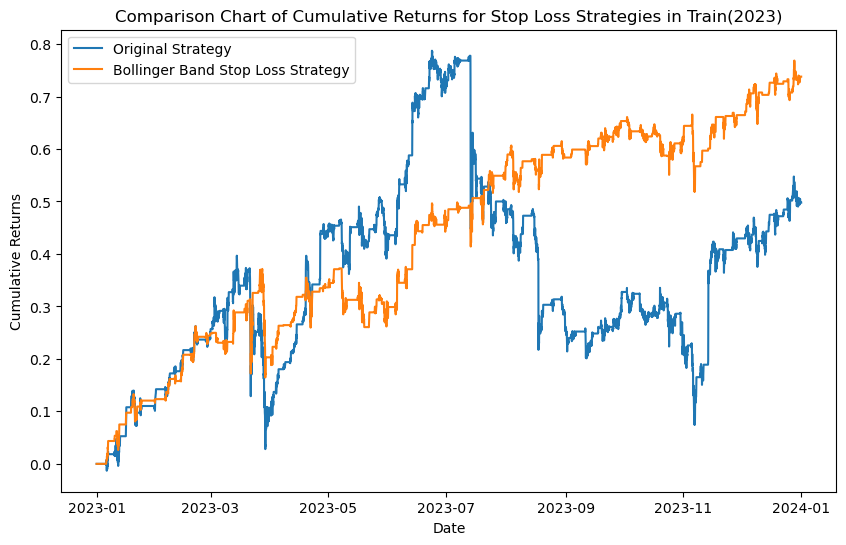

In [116]:
compare_stop_loss_strategies(pairs2_train_23, stoploss2_pairs2_train_23, 'cumpnl', 'Train(2023)')

In [117]:
pairs2_test = pairs_2.loc['2023-01-01':]
pairs2_test

Assets,XRPUSDT,BCHUSDT
Date,,
2023-01-01 00:00:00,0.3385,96.4
2023-01-01 01:00:00,0.3387,96.5
2023-01-01 02:00:00,0.3380,96.6
2023-01-01 03:00:00,0.3381,96.5
2023-01-01 04:00:00,0.3361,96.2
...,...,...
2024-05-30 20:00:00,0.5188,467.3
2024-05-30 21:00:00,0.5202,467.7
2024-05-30 22:00:00,0.5197,466.5


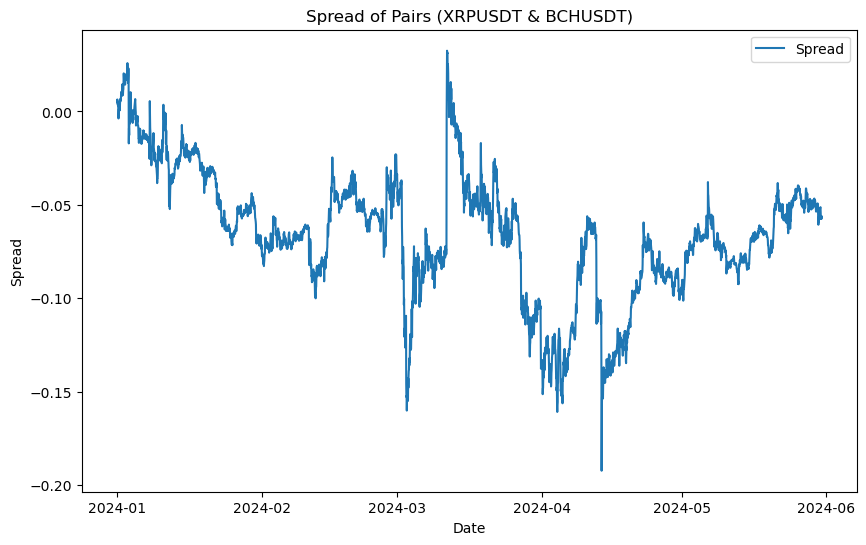

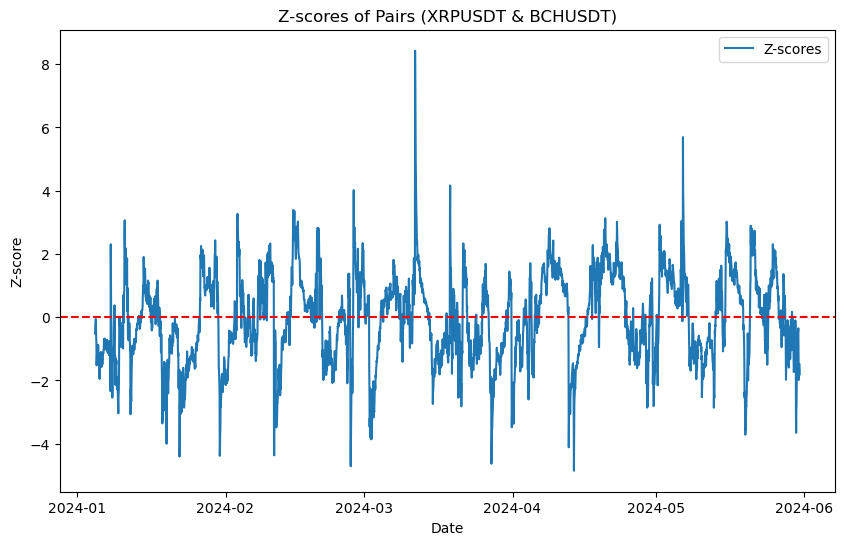

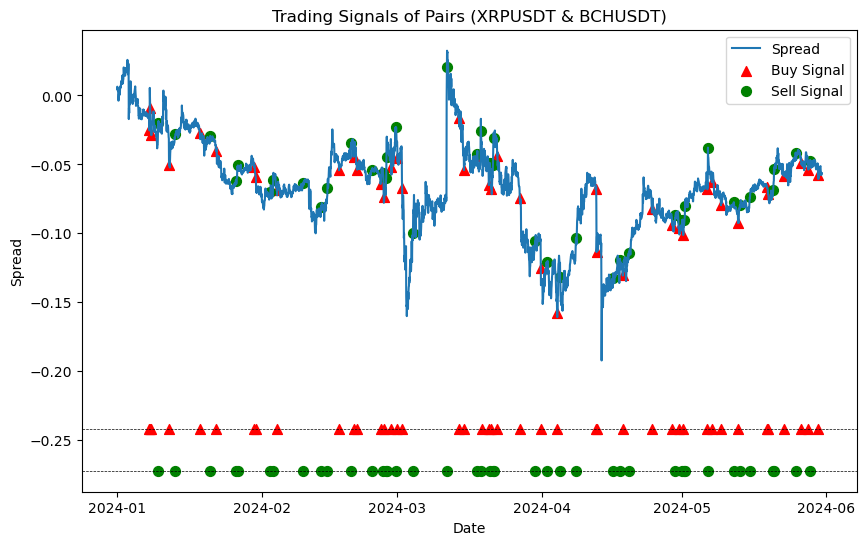

Assets,XRPUSDT,BCHUSDT,beta,intercept,spread,Spread_MA,Spread_Std,zscors,signal,position,return_Y,return_X,position_Y,position_X,hourlypnl,cumpnl,max_cumpnl
Date,,,,,,,,,,,,,,,,,
2024-01-01 00:00:00,0.6162,259.9,0.001240,0.288918,0.004950,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-01-01 01:00:00,0.6185,260.6,0.001240,0.288959,0.006388,NaN,NaN,NaN,NaN,0,0.003726,0.002690,0.0,-0.000000,0.000000,0.000000,0.000000
2024-01-01 02:00:00,0.6154,260.0,0.001240,0.289001,0.004039,NaN,NaN,NaN,NaN,0,-0.005025,-0.002305,0.0,-0.000000,0.000000,0.000000,0.000000
2024-01-01 03:00:00,0.6130,258.3,0.001240,0.289044,0.003753,NaN,NaN,NaN,NaN,0,-0.003908,-0.006560,0.0,-0.000000,0.000000,0.000000,0.000000
2024-01-01 04:00:00,0.6116,257.2,0.001239,0.289087,0.003723,NaN,NaN,NaN,NaN,0,-0.002286,-0.004268,0.0,-0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-30 20:00:00,0.5188,467.3,0.000057,0.549651,-0.057494,-0.050137,0.003706,-1.985317,1.0,1,-0.006149,-0.003845,1.0,-0.000057,-0.006149,0.489155,0.529506
2024-05-30 21:00:00,0.5202,467.7,0.000057,0.549687,-0.056093,-0.050225,0.003752,-1.563783,NaN,1,0.002695,0.000856,1.0,-0.000057,0.002695,0.491850,0.529506
2024-05-30 22:00:00,0.5197,466.5,0.000057,0.549720,-0.056501,-0.050307,0.003808,-1.626658,NaN,1,-0.000962,-0.002569,1.0,-0.000057,-0.000961,0.490889,0.529506


In [118]:
pairs2_test = \
   pairs_trading_strategy(pairs2_test,'XRPUSDT','BCHUSDT',
                          z_signal_in, z_signal_out, min_spread, MA_window, OLS_window
                         )
pairs2_test

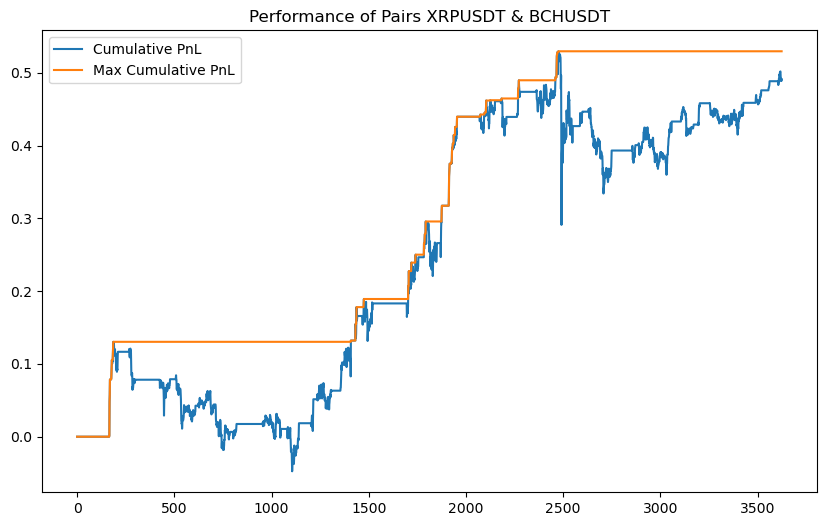

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Test,2024,No,1.931665,81.955289,49.108129,-23.850902,-104 days +05:00:00


In [119]:
pairs2_test_performance = \
   pnlPerformance(pairs2_test['hourlypnl'].dropna(),'XRPUSDT & BCHUSDT','Test','2024','No')
pairs2_test_performance

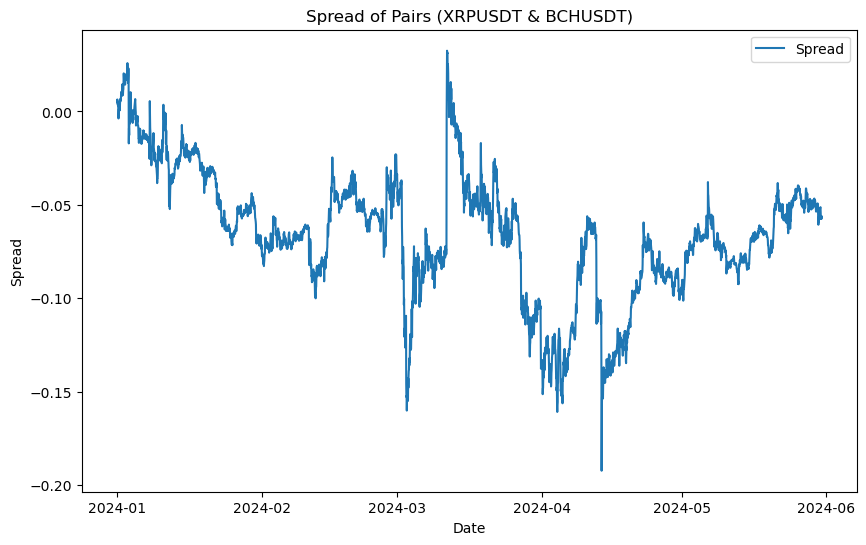

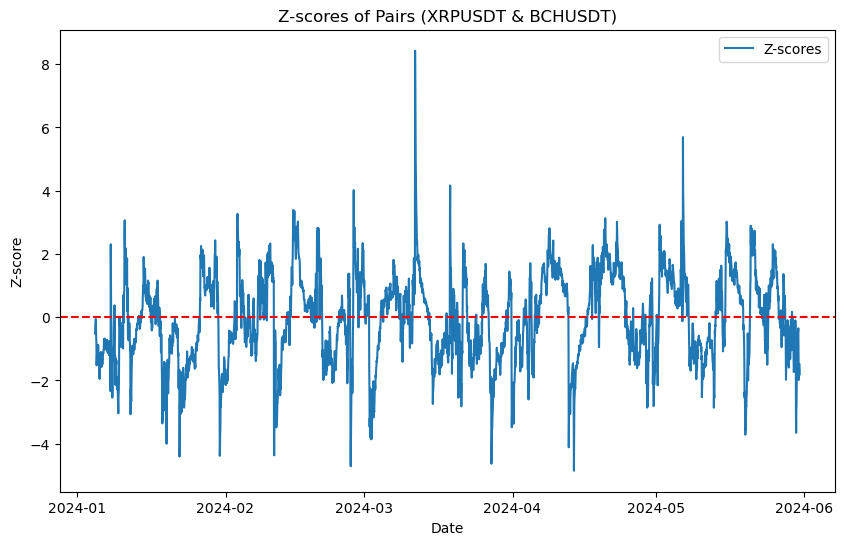

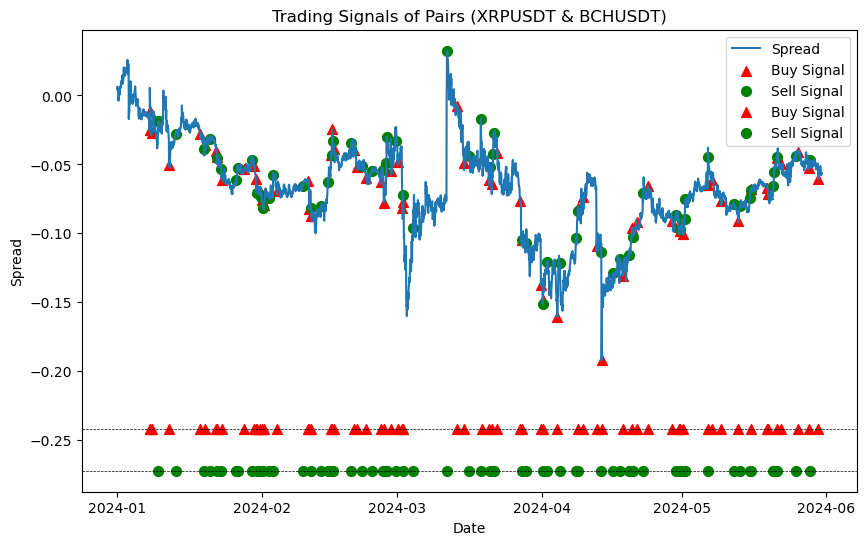

Assets,XRPUSDT,BCHUSDT,beta,intercept,spread,Spread_MA,Spread_Std,zscors,signal,position,...,return_X,position_Y,position_X,hourlypnl,cumpnl,max_cumpnl,return_crypto1,return_crypto2,crypto1position,crypto2position
Date,,,,,,,,,,,,,,,,,,,,,
2024-01-01 00:00:00,0.6162,259.9,0.001240,0.288918,0.004950,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-01-01 01:00:00,0.6185,260.6,0.001240,0.288959,0.006388,NaN,NaN,NaN,NaN,0.0,...,0.002690,0.0,-0.000000,0.000000,0.000000,0.00000,0.003726,0.002690,0.0,-0.000000
2024-01-01 02:00:00,0.6154,260.0,0.001240,0.289001,0.004039,NaN,NaN,NaN,NaN,0.0,...,-0.002305,0.0,-0.000000,0.000000,0.000000,0.00000,-0.005025,-0.002305,0.0,-0.000000
2024-01-01 03:00:00,0.6130,258.3,0.001240,0.289044,0.003753,NaN,NaN,NaN,NaN,0.0,...,-0.006560,0.0,-0.000000,0.000000,0.000000,0.00000,-0.003908,-0.006560,0.0,-0.000000
2024-01-01 04:00:00,0.6116,257.2,0.001239,0.289087,0.003723,NaN,NaN,NaN,NaN,0.0,...,-0.004268,0.0,-0.000000,0.000000,0.000000,0.00000,-0.002286,-0.004268,0.0,-0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-30 20:00:00,0.5188,467.3,0.000057,0.549651,-0.057494,-0.050137,0.003706,-1.985317,1.0,1.0,...,-0.003845,1.0,-0.000057,-0.006149,0.436832,0.47115,-0.006149,-0.003845,1.0,-0.000057
2024-05-30 21:00:00,0.5202,467.7,0.000057,0.549687,-0.056093,-0.050225,0.003752,-1.563783,NaN,1.0,...,0.000856,1.0,-0.000057,0.002695,0.439527,0.47115,0.002695,0.000856,1.0,-0.000057
2024-05-30 22:00:00,0.5197,466.5,0.000057,0.549720,-0.056501,-0.050307,0.003808,-1.626658,NaN,1.0,...,-0.002569,1.0,-0.000057,-0.000961,0.438566,0.47115,-0.000962,-0.002569,1.0,-0.000057


In [120]:
stoploss1_pairs2_test = stop_loss_strategy1(pairs2_test, 'XRPUSDT','BCHUSDT','XRPUSDT','BCHUSDT',num_consecutive_losses=4)
stoploss1_pairs2_test

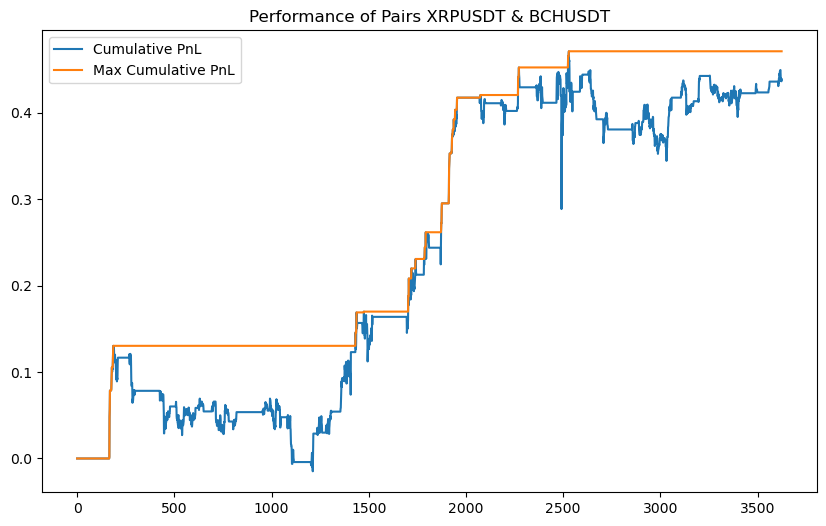

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Test,2024,Strategy1,1.928425,73.223252,43.875837,-16.383913,-104 days +05:00:00


In [121]:
pairs2_test_stoploss1_performance = \
   pnlPerformance(stoploss1_pairs2_test['hourlypnl'].dropna(),'XRPUSDT & BCHUSDT','Test','2024','Strategy1')
pairs2_test_stoploss1_performance

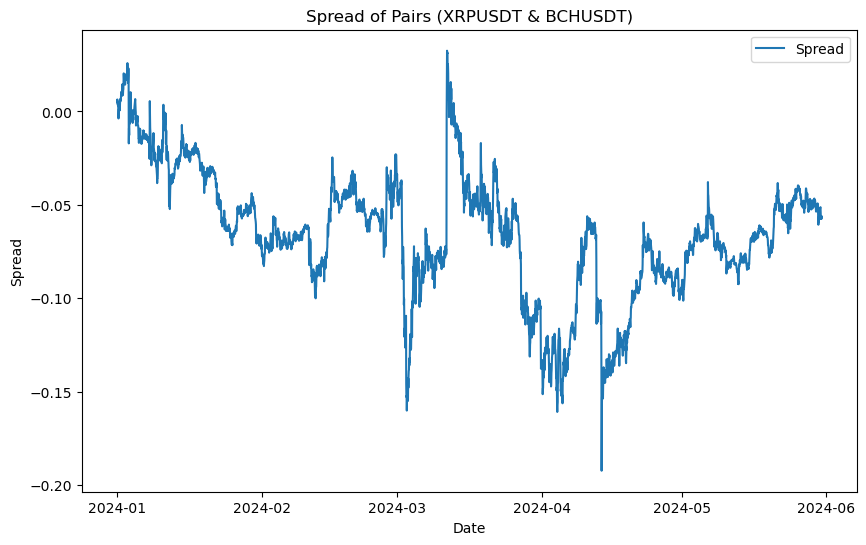

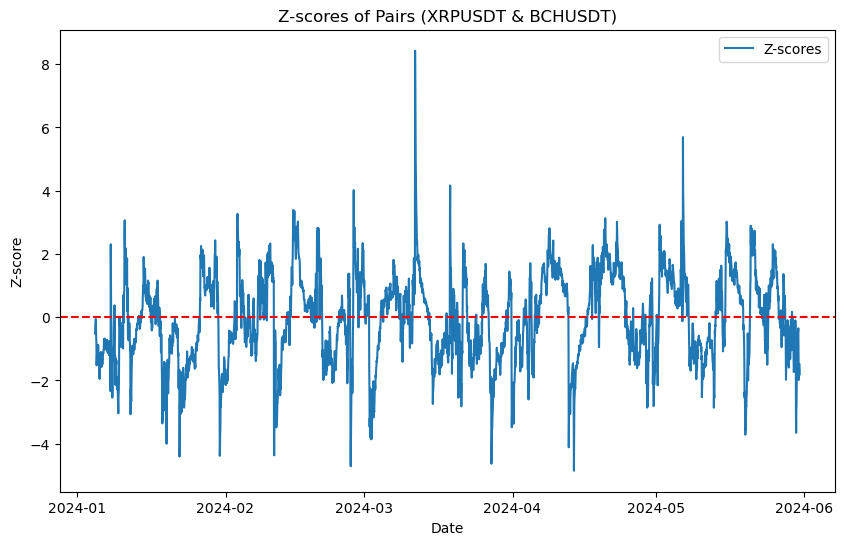

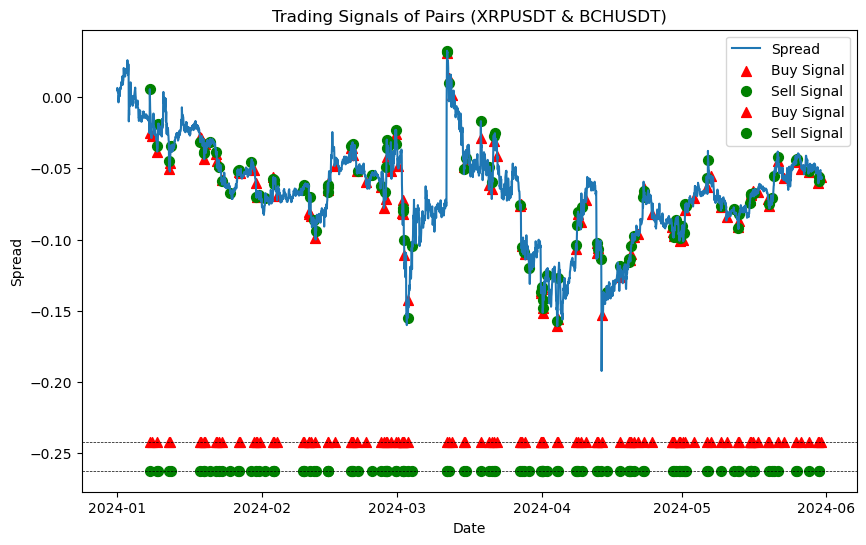

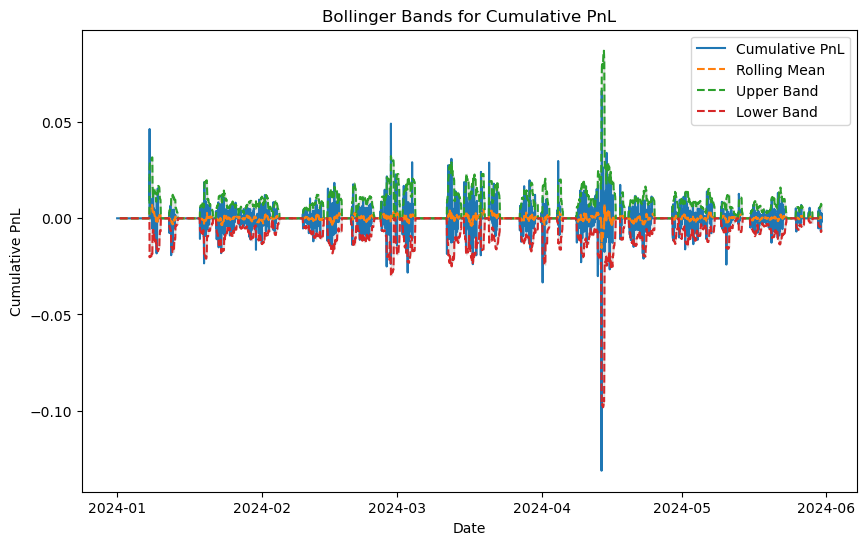

Assets,XRPUSDT,BCHUSDT,beta,intercept,spread,Spread_MA,Spread_Std,zscors,signal,position,return_Y,return_X,position_Y,position_X,hourlypnl,cumpnl,max_cumpnl,stop_loss_signal
Date,,,,,,,,,,,,,,,,,,
2024-01-01 00:00:00,0.6162,259.9,0.001240,0.288918,0.004950,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-01-01 01:00:00,0.6185,260.6,0.001240,0.288959,0.006388,NaN,NaN,NaN,NaN,0.0,0.003726,0.002690,0.0,-0.000000,0.000000,0.000000,0.000000,NaN
2024-01-01 02:00:00,0.6154,260.0,0.001240,0.289001,0.004039,NaN,NaN,NaN,NaN,0.0,-0.005025,-0.002305,0.0,-0.000000,0.000000,0.000000,0.000000,NaN
2024-01-01 03:00:00,0.6130,258.3,0.001240,0.289044,0.003753,NaN,NaN,NaN,NaN,0.0,-0.003908,-0.006560,0.0,-0.000000,0.000000,0.000000,0.000000,NaN
2024-01-01 04:00:00,0.6116,257.2,0.001239,0.289087,0.003723,NaN,NaN,NaN,NaN,0.0,-0.002286,-0.004268,0.0,-0.000000,0.000000,0.000000,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-30 20:00:00,0.5188,467.3,0.000057,0.549651,-0.057494,-0.050137,0.003706,-1.985317,1.0,0.0,-0.006149,-0.003845,0.0,-0.000000,0.000000,0.377253,0.377253,NaN
2024-05-30 21:00:00,0.5202,467.7,0.000057,0.549687,-0.056093,-0.050225,0.003752,-1.563783,NaN,1.0,0.002695,0.000856,1.0,-0.000057,0.002695,0.379948,0.379948,NaN
2024-05-30 22:00:00,0.5197,466.5,0.000057,0.549720,-0.056501,-0.050307,0.003808,-1.626658,NaN,1.0,-0.000962,-0.002569,1.0,-0.000057,-0.000961,0.378986,0.379948,NaN


In [122]:
stoploss2_pairs2_test = \
   bollinger_band_stop_loss(pairs2_test, 'hourlypnl','XRPUSDT','BCHUSDT',boll_window,std_multiplier)
stoploss2_pairs2_test

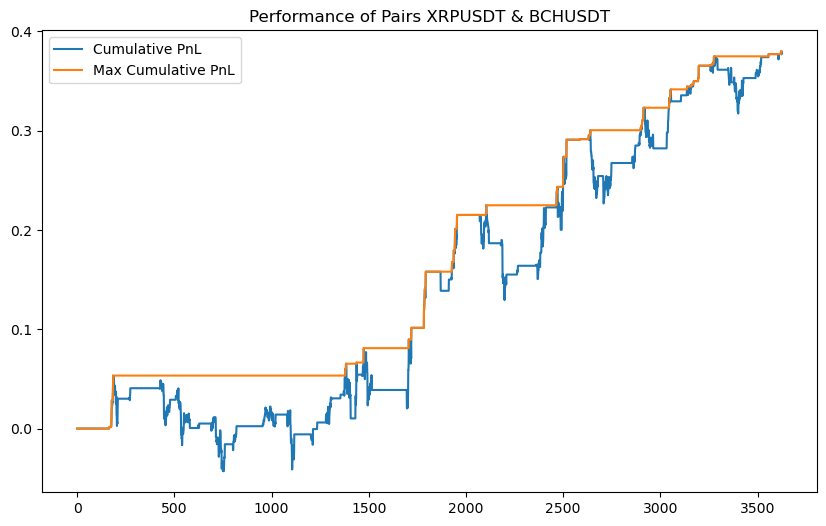

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Test,2024,Strategy2,2.34119,63.280218,37.917909,-9.638509,-32 days +14:00:00


In [123]:
pairs2_test_stoploss2_performance = \
   pnlPerformance(stoploss2_pairs2_test['hourlypnl'].dropna(),'XRPUSDT & BCHUSDT','Test','2024','Strategy2')
pairs2_test_stoploss2_performance

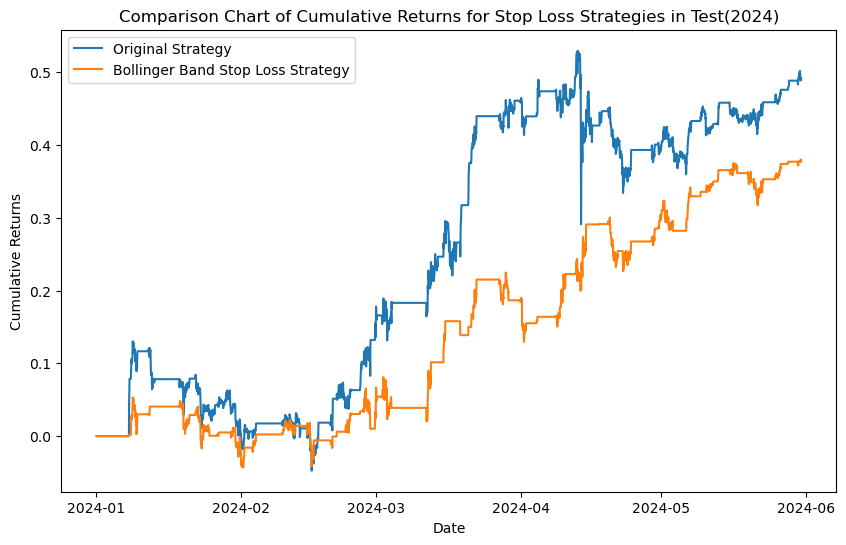

In [124]:
compare_stop_loss_strategies(pairs2_test, stoploss2_pairs2_test, 'cumpnl', 'Test(2024)')

In [125]:
conclu_performance_2 = pd.concat([pairs2_train_2123_performance,
                                pairs2_train_2123_stoploss1_performance,
                                pairs2_train_2123_stoploss2_performance,
                                pairs2_train_2223_performance,
                                pairs2_train_2223_stoploss1_performance,
                                pairs2_train_2223_stoploss2_performance,
                                pairs2_train_21_performance,
                                pairs2_train_21_stoploss1_performance,
                                pairs2_train_21_stoploss2_performance, 
                                pairs2_train_22_performance,
                                pairs2_train_22_stoploss1_performance,
                                pairs2_train_22_stoploss2_performance,
                                pairs2_train_23_performance,
                                pairs2_train_23_stoploss1_performance,
                                pairs2_train_23_stoploss2_performance,
                                pairs2_test_performance,
                                pairs2_test_stoploss1_performance,
                                pairs2_test_stoploss2_performance])
conclu_performance_2

,Year,Stop-Loss,Sharpe Ratio,Average Annual Returns (%),Total Returns (%),Max Drawdown (%),Max Drawdown Period
Train,2021-2023,No,-0.072397,-5.352018,-23.248711,-207.200261,-138 days +07:00:00
Train,2021-2023,Strategy 1,-0.280951,-17.763218,-77.161916,-219.061716,-408 days +20:00:00
Train,2021-2023,Strategy 2,0.684103,37.506237,162.923920,-99.834676,-51 days +12:00:00
Train,2022-2023,No,0.287830,1191.779632,3449.618757,-5217.006663,-427 days +14:00:00
Train,2022-2023,Strategy 1,0.682684,32.008314,92.648404,-54.134008,-679 days +23:00:00
Train,2022-2023,Strategy 2,1.352549,52.135847,150.907761,-43.863347,-38 days +08:00:00
Train,2021,No,-1.017756,-104.894237,-151.808740,-207.200261,-138 days +07:00:00
Train,2021,Strategy1,-1.373676,-119.694748,-173.228858,-216.807407,-173 days +05:00:00
Train,2021,Strategy2,0.096735,7.523169,10.887946,-99.834676,-51 days +12:00:00
Train,2022,No,0.756918,44.046209,63.702412,-36.886213,-265 days +07:00:00
